In [66]:
import matplotlib.pyplot as plt
%matplotlib inline

In [67]:
from gensim.models.word2vec import Word2Vec

In [68]:
from collections import OrderedDict

models = OrderedDict([
    (year, Word2Vec.load('/home/odysseus/Téléchargements/hist-vec-master/crit/LemCorpCrit_models/{}.bin'.format(year)))
    for year in range(1840, 1940, 20)
])

In [69]:
def cosine_series(anchor, query):
    
    series = OrderedDict()
    
    for year, model in models.items():
        
        series[year] = (
            model.similarity(anchor, query)
            if query in model else 0
        )

    return series

In [70]:
import numpy as np
import statsmodels.api as sm

def lin_reg(series):

    x = np.array(list(series.keys()))
    y = np.array(list(series.values()))

    x = sm.add_constant(x)

    return sm.OLS(y, x).fit()

In [71]:
def plot_cosine_series(anchor, query, w=8, h=4):
    
    series = cosine_series(anchor, query)
    
    fit = lin_reg(series)

    x1 = list(series.keys())[0]
    x2 = list(series.keys())[-1]

    y1 = fit.predict()[0]
    y2 = fit.predict()[-1]
    
    print(query)
    
    plt.figure(figsize=(w, h))
    plt.ylim(0, 1)
    plt.title(query)
    plt.xlabel('Year')
    plt.ylabel('Similarity')
    plt.plot(list(series.keys()), list(series.values()))
    plt.plot([x1, x2], [y1, y2], color='gray', linewidth=0.5)
    plt.show()

# Similarity of a list of key terms to "littérature"

poésie


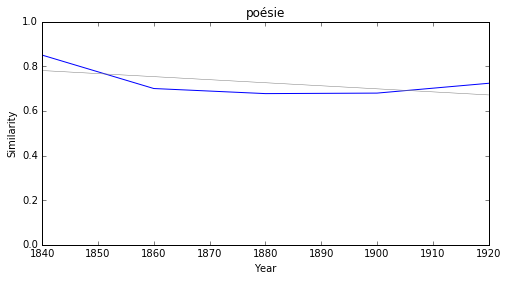

science


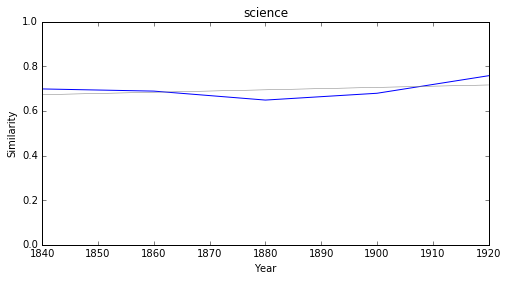

savoir


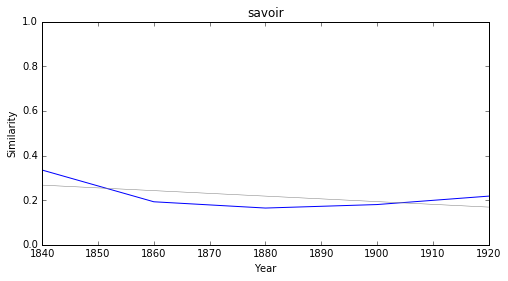

histoire


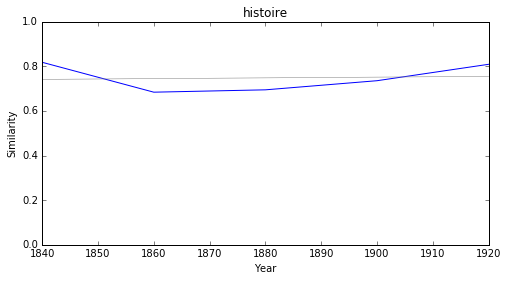

philosophie


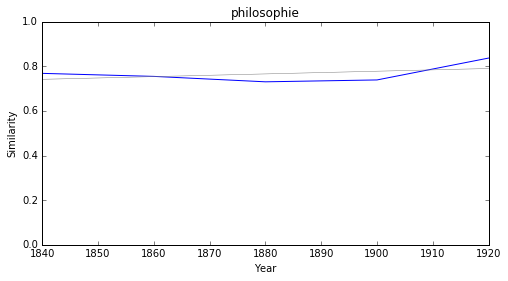

lettre


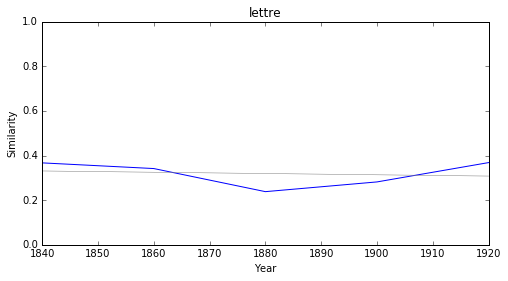

critique


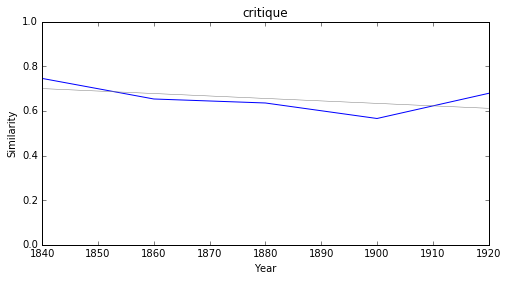

roman


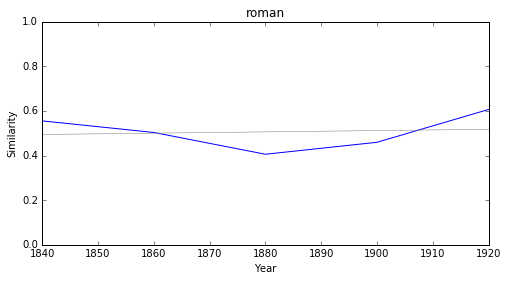

théâtre


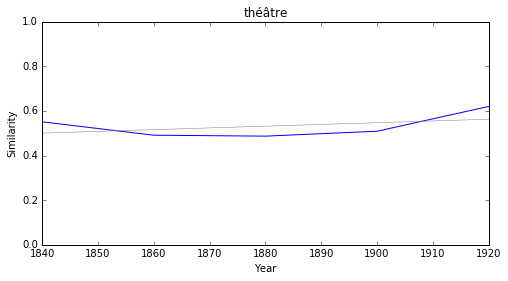

drame


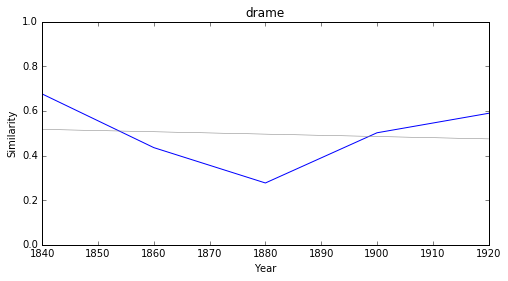

esprit


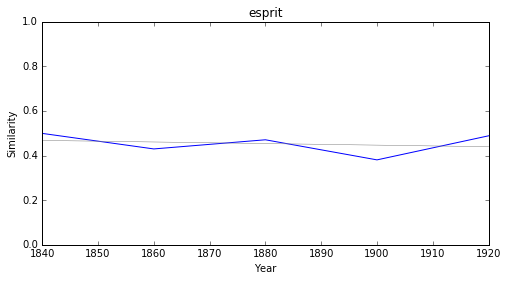

langue


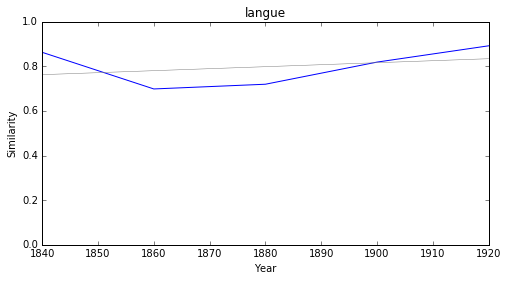

diplomatie


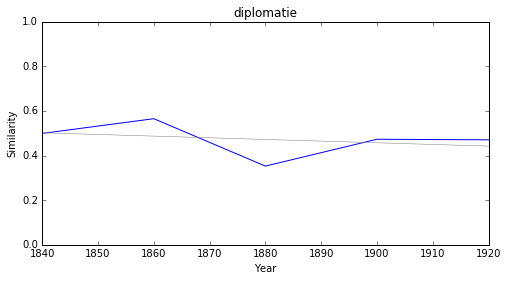

politique


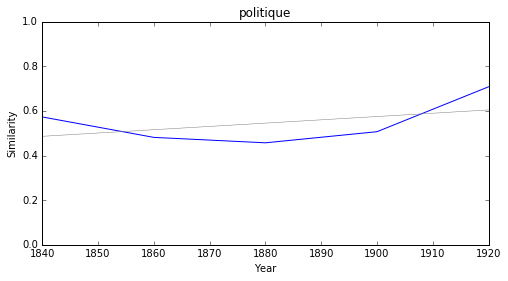

morale


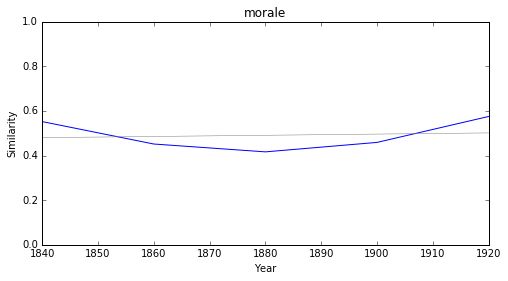

société


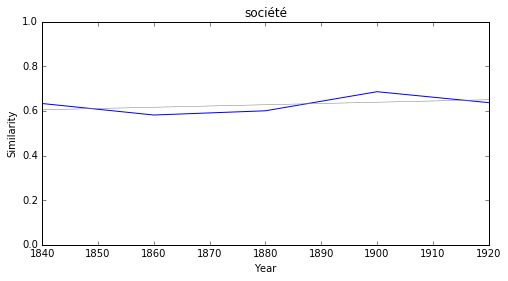

pouvoir


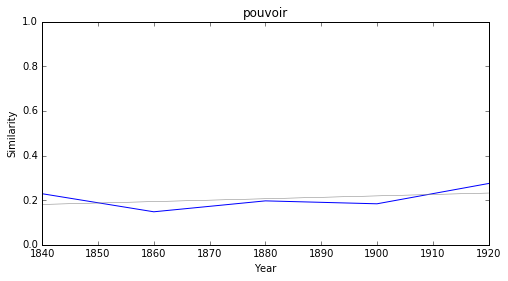

théologie


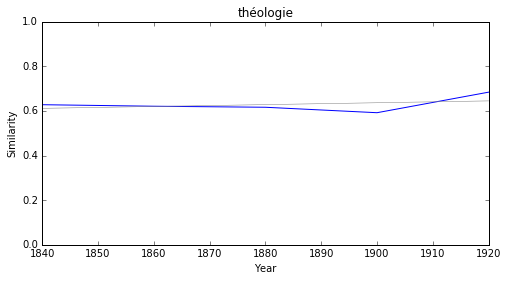

droit


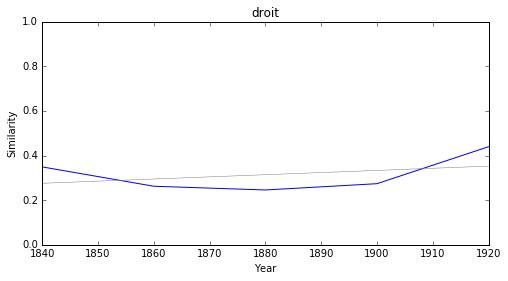

loi


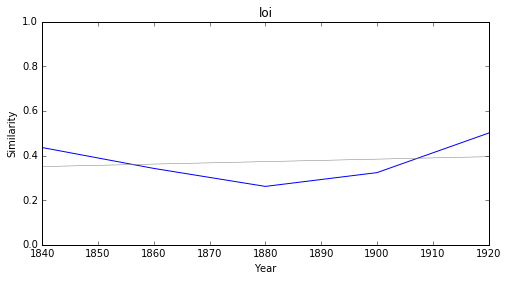

méthode


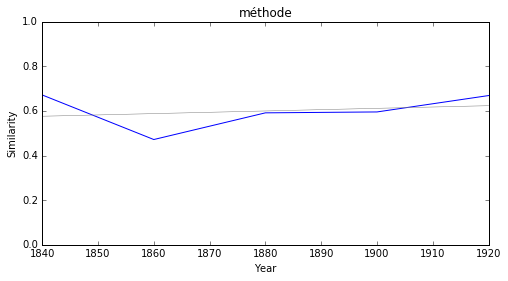

génie


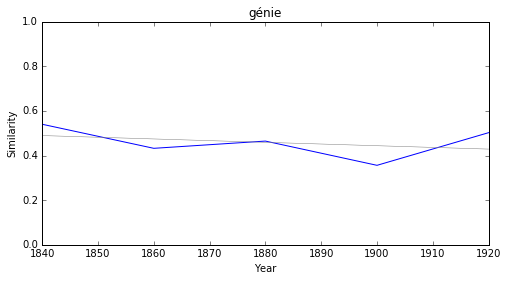

romantisme


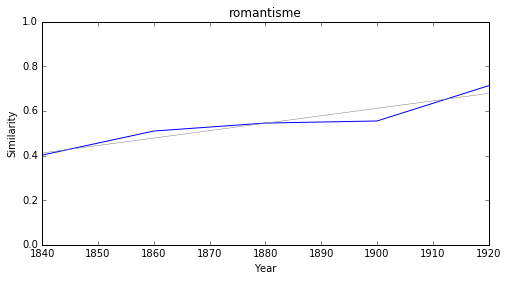

réalisme


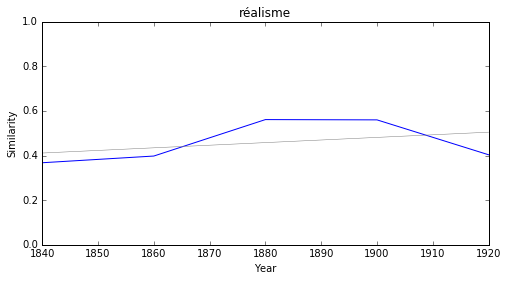

symbolisme


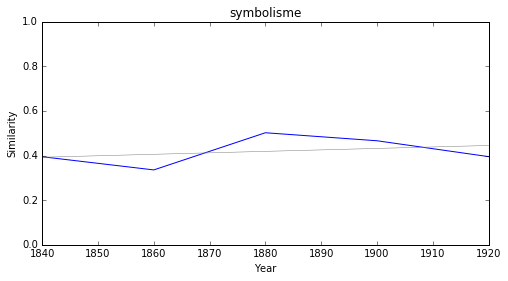

naturalisme


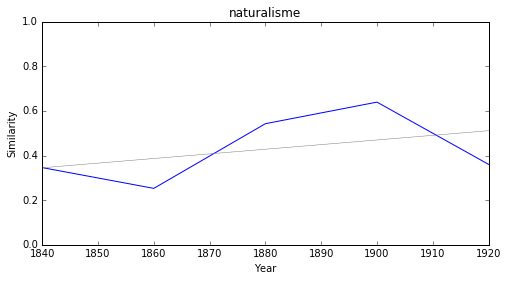

In [72]:
testList = ('littérature','poésie', 'science', 'savoir', 'histoire', 'philosophie', 'lettre', 'critique', 
            'roman', 'théâtre', 'drame', 'esprit', 'langue', 'diplomatie', 'politique', 'morale', 'société', 
            'pouvoir', 'théologie', 'droit', 'loi', 'méthode', 'génie', 'romantisme', 'réalisme', 'symbolisme', 
            'naturalisme')

for idx, val in enumerate(testList):
    if idx>0:
        plot_cosine_series('littérature', val)

The two next cells get the 200 most similar terms to a specific term, from the training models, here "littérature".

In [73]:
def union_neighbor_vocab(anchor, topn=200):
    
    vocab = set()
    
    for year, model in models.items():
        similar = model.most_similar(anchor, topn=topn)
        vocab.update([s[0] for s in similar])
        
    return vocab

At this point, we'll do the same thing as above, and calculate, for each token in the 200 nearest terms to the main entry, the <b>proximity</b> of this term and its <b>significance</b>. The significance is calculated with the p value, that is to say that, below a certain threshold (0.05) we have a strong likelyhood that the result is sure and significant.

In [74]:
testList = ('littérature','poésie', 'science', 'savoir', 'histoire', 'philosophie', 'lettre', 'critique', 
            'roman', 'théâtre', 'drame', 'esprit', 'langue', 'diplomatie', 'politique', 'morale', 'société', 
            'pouvoir', 'théologie', 'droit', 'loi', 'méthode', 'génie', 'romantisme', 'réalisme', 'symbolisme', 
            'naturalisme')
entries={}

for word in testList:
    data = []
    for token in union_neighbor_vocab(word):
    
        series = cosine_series(word, token)
        fit = lin_reg(series)
    
        if fit.pvalues[1] < 0.05:
            data.append((token, fit.params[1], fit.pvalues[1]))
    entries[word]=data

# Increasing

### <i><b>littérature</i></b>

            token     slope         p
35      humanisme  0.010302  0.019004
8   professionnel  0.008294  0.001361
15        éthique  0.007957  0.003634
23     symboliste  0.007367  0.022680
6     orientation  0.007313  0.047529
19     adaptation  0.006944  0.049543
2          apport  0.006558  0.032944
10         manuel  0.006177  0.015870
36     catholique  0.005987  0.007488
31       réaliste  0.005107  0.033174



humanisme


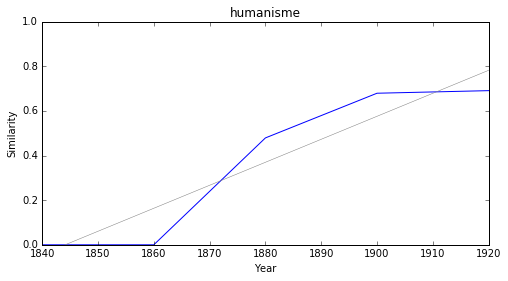

professionnel


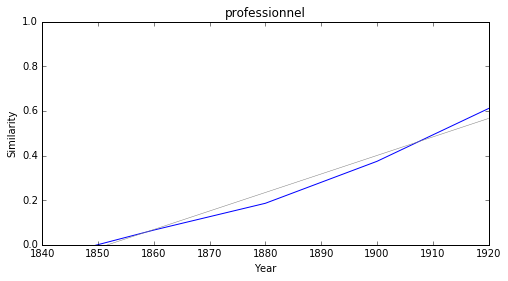

éthique


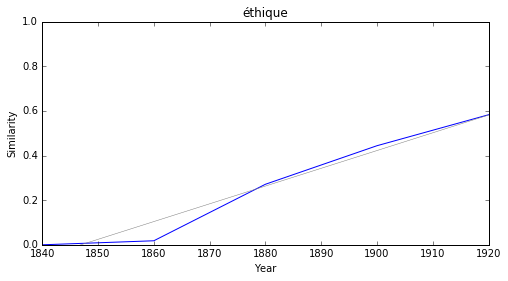

symboliste


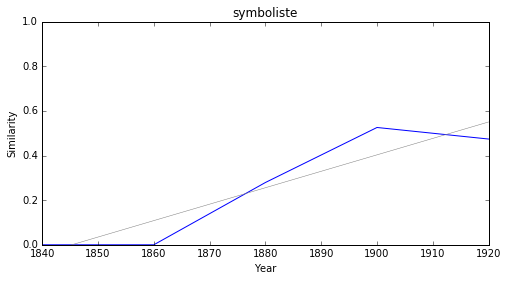

orientation


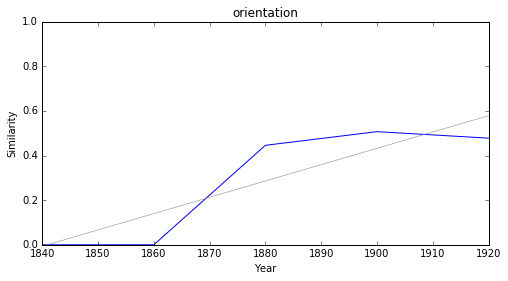

adaptation


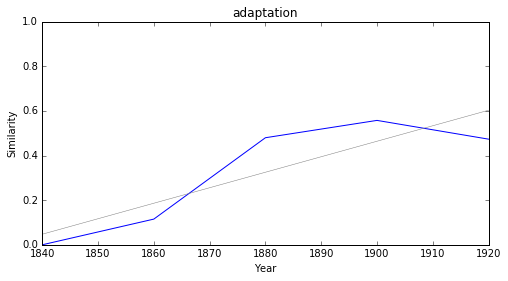

apport


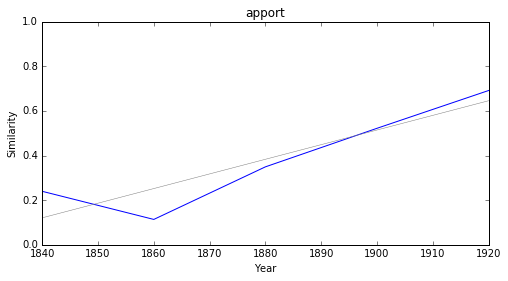

manuel


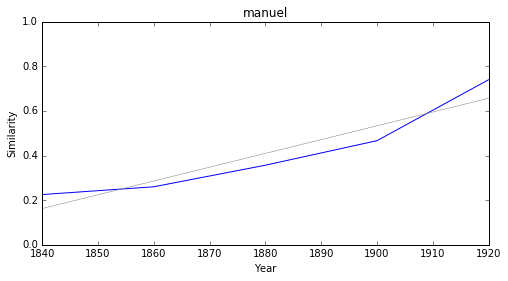

catholique


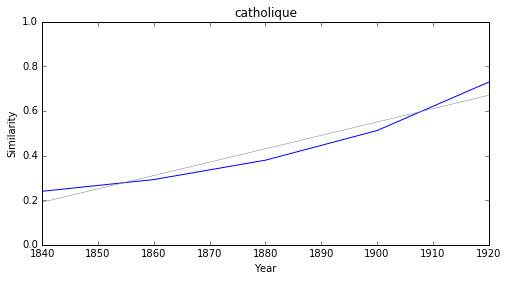

réaliste


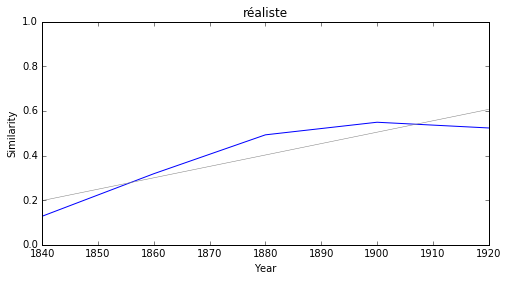

### <i><b>poésie</i></b>

            token     slope         p
31      humanisme  0.009166  0.013652
18        éthique  0.007888  0.006259
7     orientation  0.007747  0.024581
10  professionnel  0.007081  0.039541
42     sociologie  0.006947  0.019920
32        concept  0.006696  0.010612
23     symboliste  0.006564  0.049029
13      conscient  0.006447  0.005222
24        lyrisme  0.004999  0.025161
41    psychologie  0.004763  0.002939



humanisme


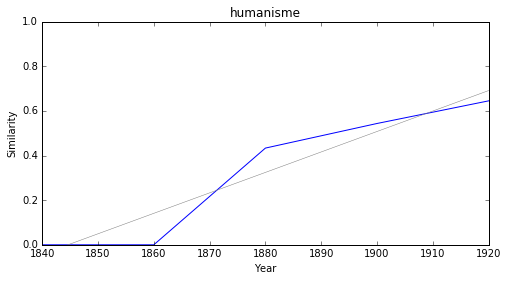

éthique


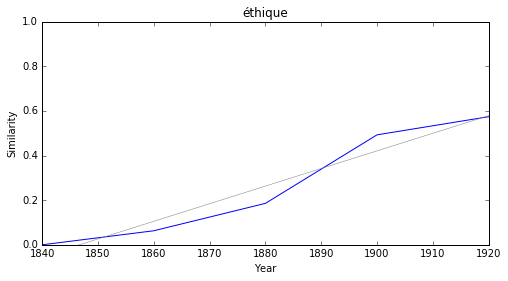

orientation


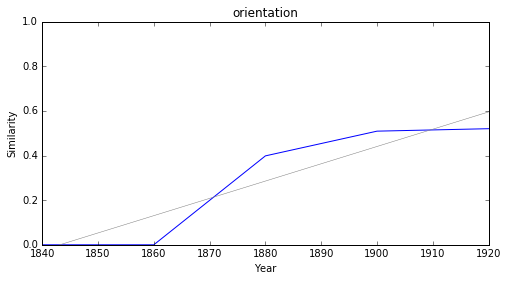

professionnel


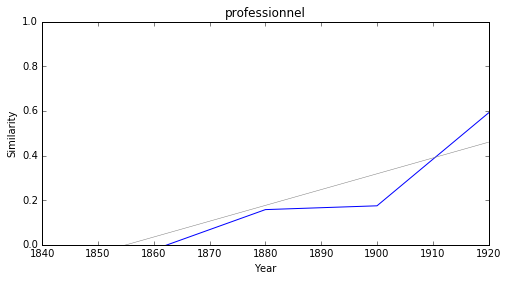

sociologie


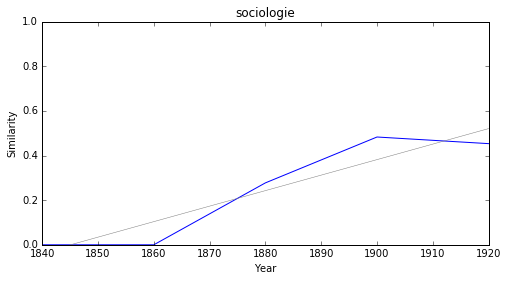

concept


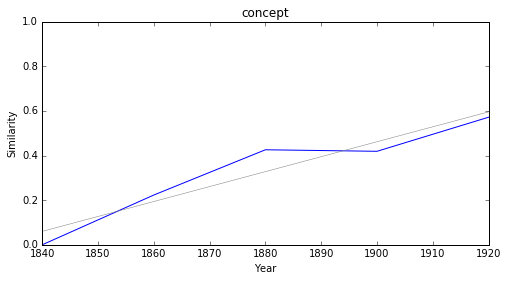

symboliste


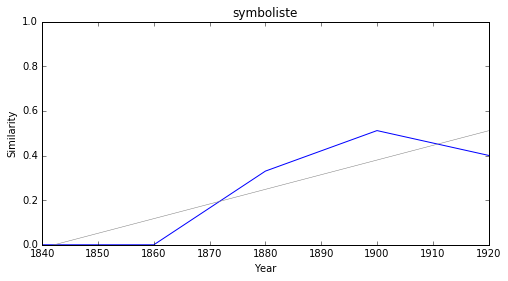

conscient


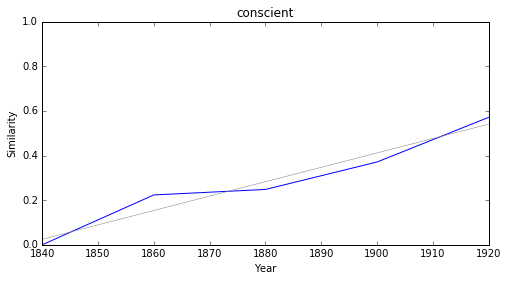

lyrisme


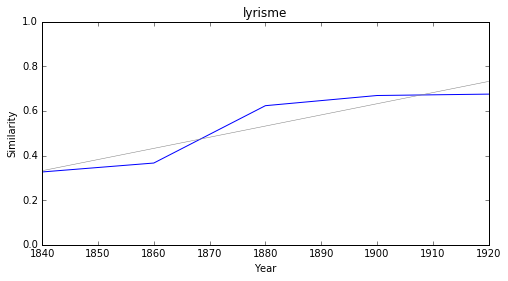

psychologie


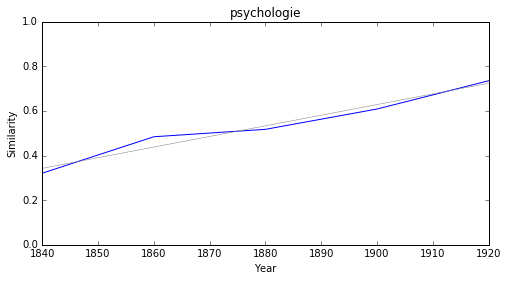

### <i><b>science</i></b>

            token     slope         p
15      humanisme  0.010324  0.015803
6         éthique  0.009705  0.003954
16        concept  0.007712  0.032518
4   professionnel  0.007474  0.001775
12         verbal  0.007292  0.045695
9      adaptation  0.007090  0.041557
1          apport  0.006653  0.015005
5          manuel  0.004922  0.026045
13    réalisation  0.004023  0.008931
10     artistique  0.003804  0.002656



humanisme


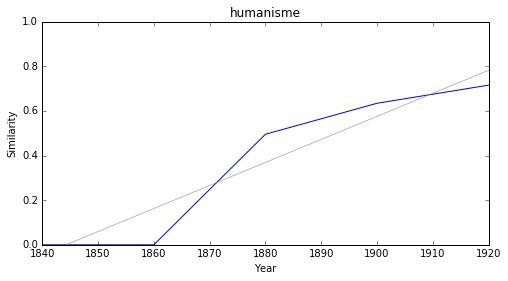

éthique


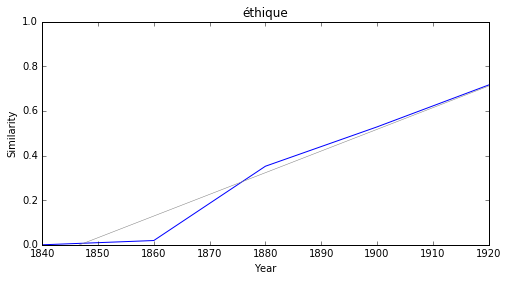

concept


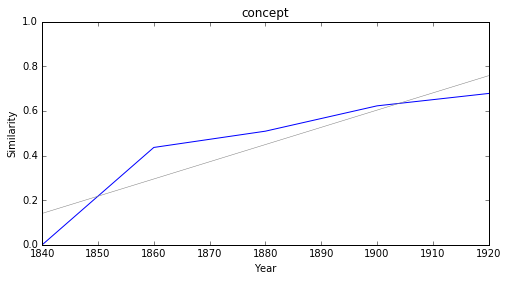

professionnel


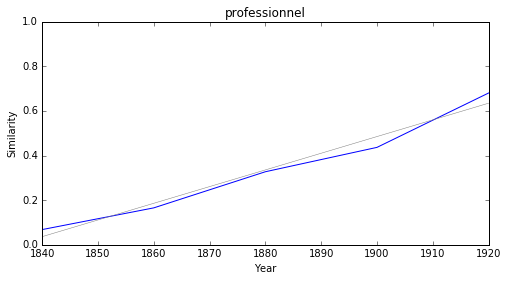

verbal


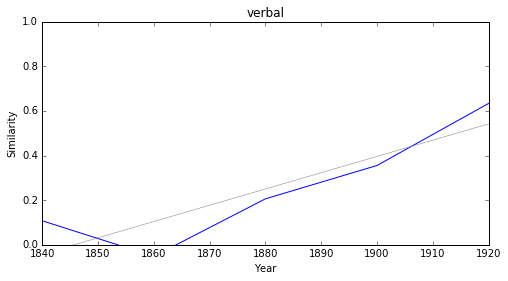

adaptation


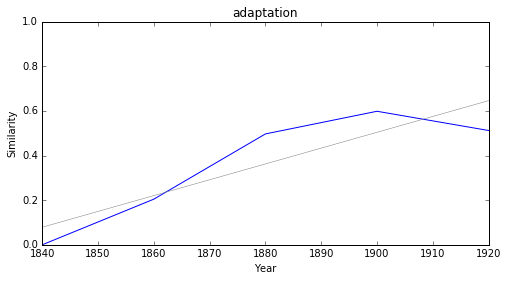

apport


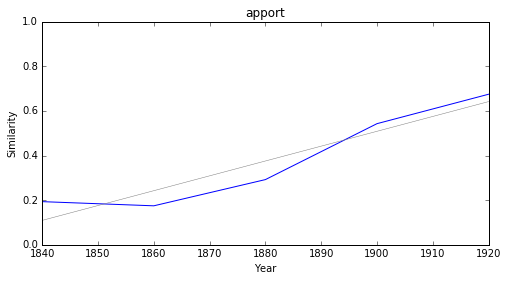

manuel


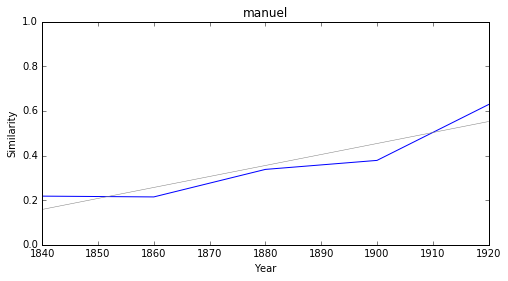

réalisation


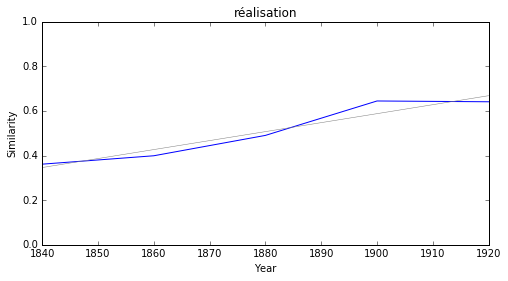

artistique


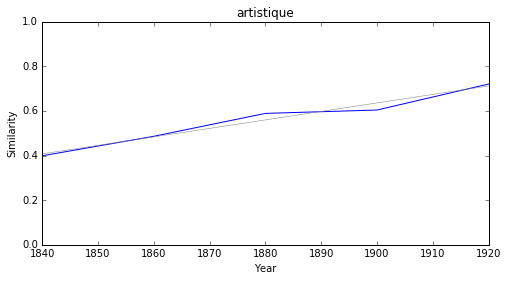

### <i><b>savoir</i></b>

      token     slope         p
9  pâtisser  0.006054  0.028294
4     viser  0.004455  0.019309
5    risque  0.004404  0.043395
8  détester  0.002874  0.016979
0     gêner  0.002809  0.002437
2   railler  0.002230  0.022109
6     gâter  0.002218  0.028621
3    métier  0.001241  0.002480
7    vanter -0.001712  0.049584
1     seoir -0.004003  0.008388



pâtisser


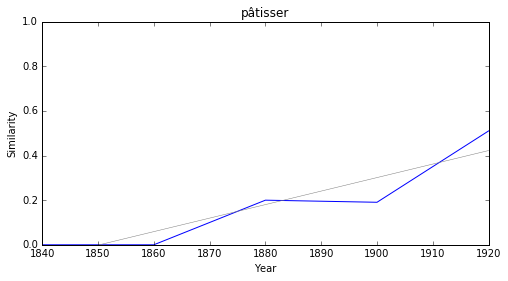

viser


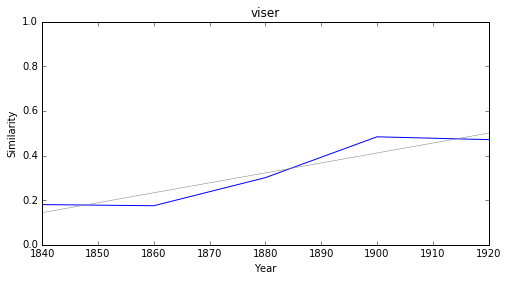

risque


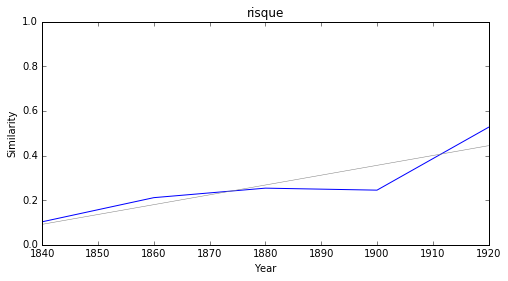

détester


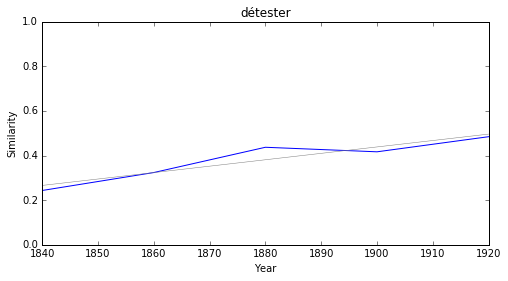

gêner


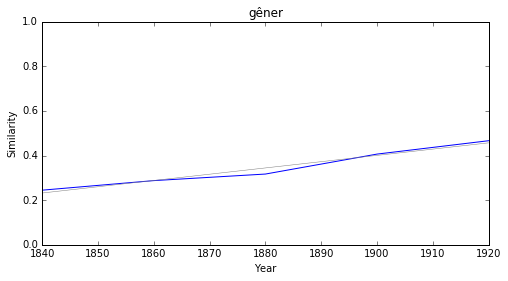

railler


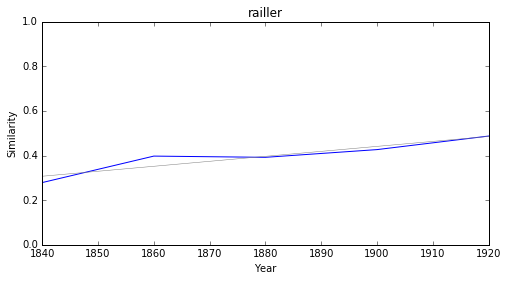

gâter


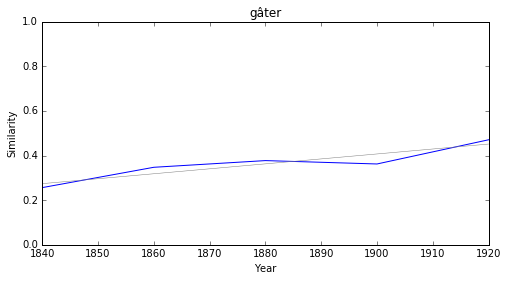

métier


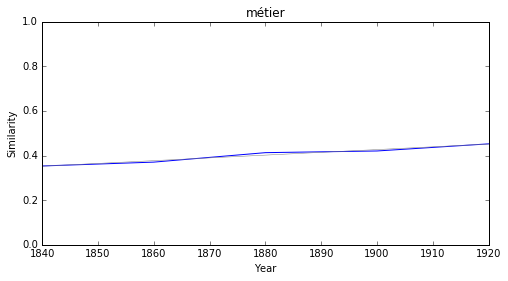

vanter


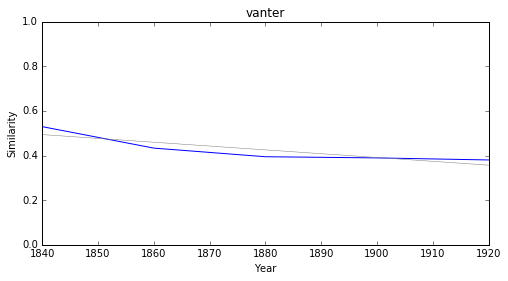

seoir


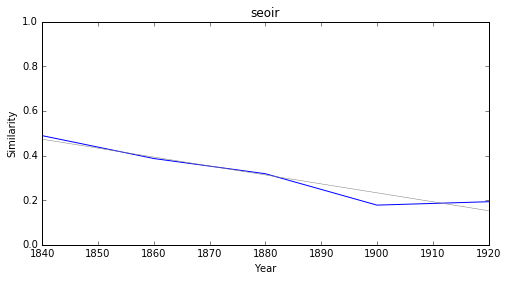

### <i><b>histoire</i></b>

          token     slope         p
24    humanisme  0.009313  0.007254
30   sociologie  0.008232  0.027857
17  welschinger  0.007957  0.026897
29    mentalité  0.007956  0.044890
26    réédition  0.007857  0.007885
9   orientation  0.007588  0.025802
14    référence  0.007373  0.006875
15    evolution  0.007348  0.015108
20   adaptation  0.006832  0.013572
1     vauquelin  0.006252  0.020016



humanisme


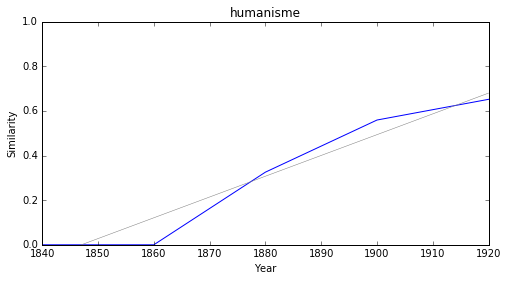

sociologie


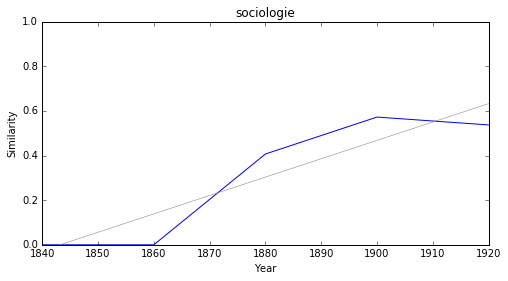

welschinger


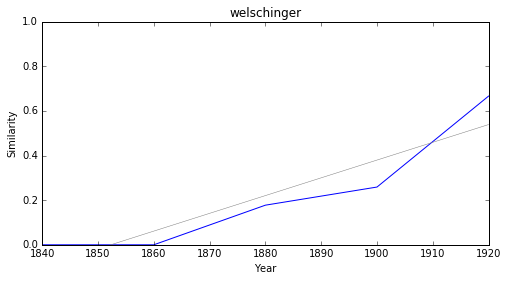

mentalité


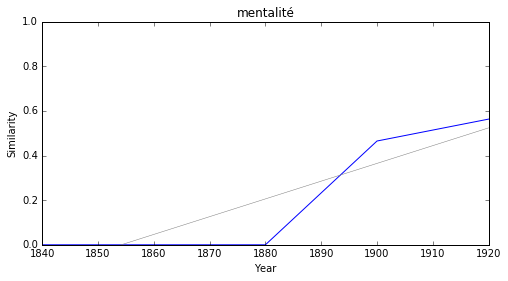

réédition


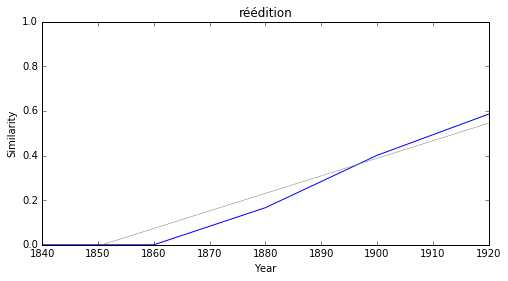

orientation


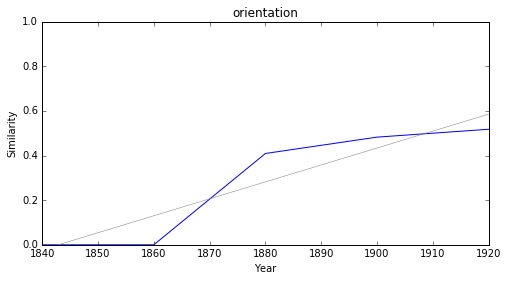

référence


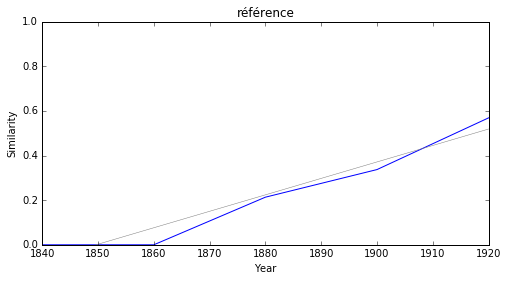

evolution


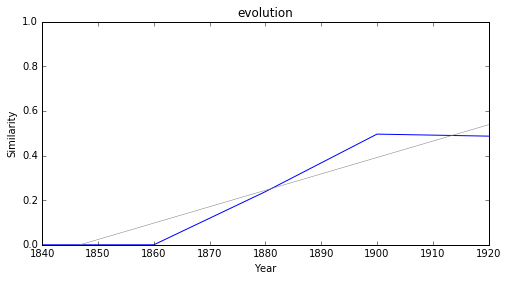

adaptation


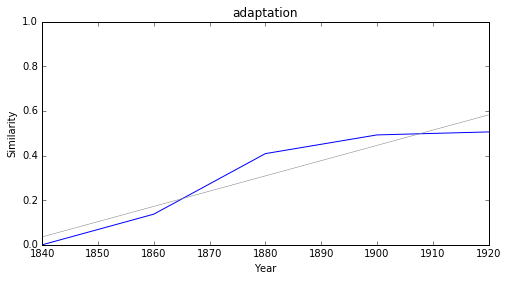

vauquelin


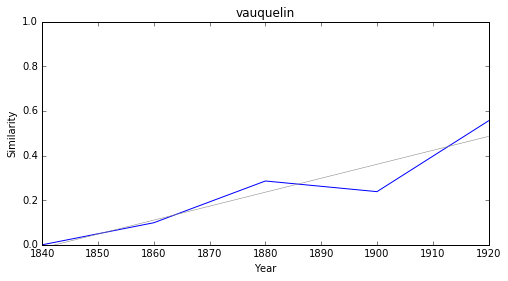

### <i><b>philosophie</i></b>

             token     slope         p
23       humanisme  0.011137  0.017477
14         éthique  0.009203  0.002645
7      orientation  0.008874  0.032780
16      relativité  0.008523  0.004917
26         concept  0.007430  0.031548
0   inconnaissable  0.007134  0.046298
15         facteur  0.007120  0.020241
9    professionnel  0.006998  0.016379
4           apport  0.006054  0.033386
3        doctrinal  0.005609  0.033767



humanisme


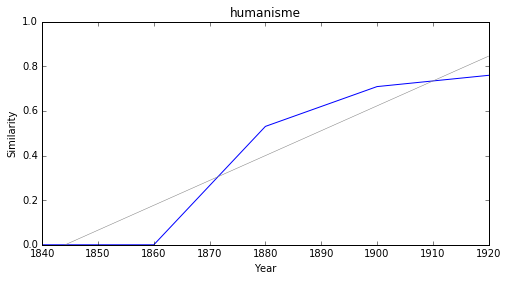

éthique


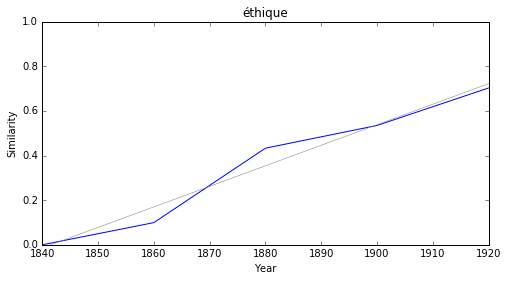

orientation


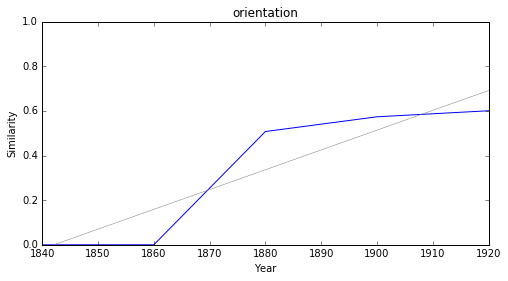

relativité


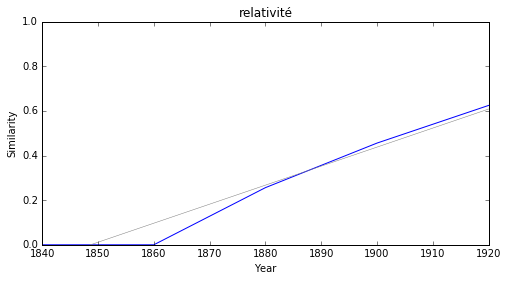

concept


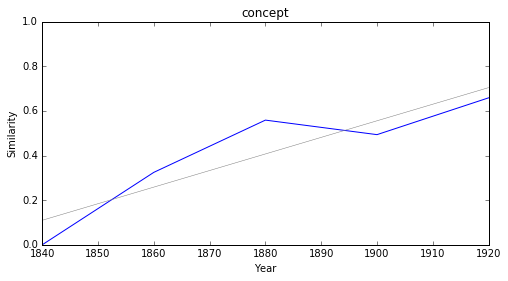

inconnaissable


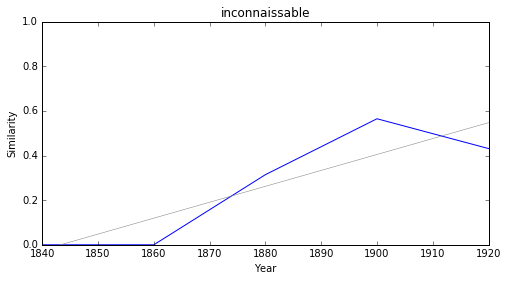

facteur


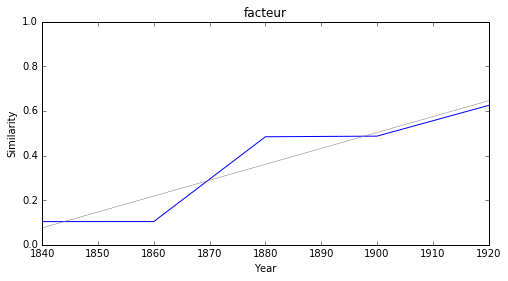

professionnel


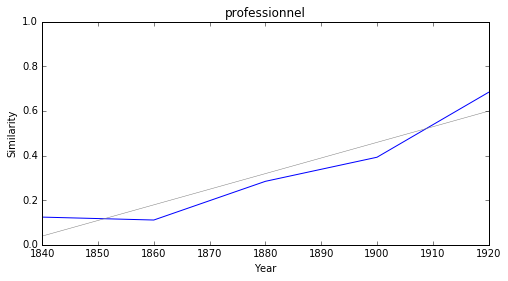

apport


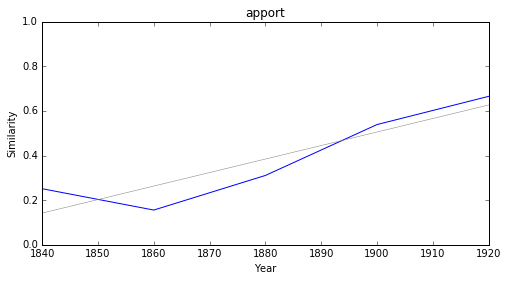

doctrinal


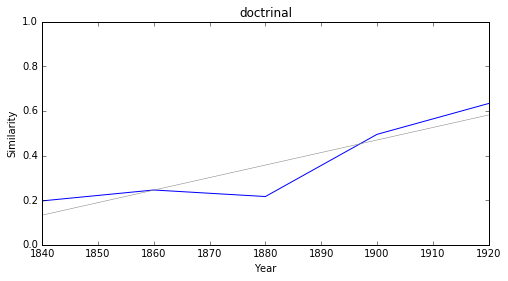

### <i><b>lettre</i></b>

        token     slope         p
20  boulenger  0.006318  0.033882
9     rostand  0.006239  0.033194
2    goncourt  0.006113  0.007593
8        huis  0.005111  0.044397
0       meyer  0.005109  0.031397
10    enquête  0.004546  0.031753
21      renan  0.003846  0.006126
23     cahier  0.003013  0.038350
7      manuel  0.002998  0.046705
18   aubignac  0.002865  0.009442



boulenger


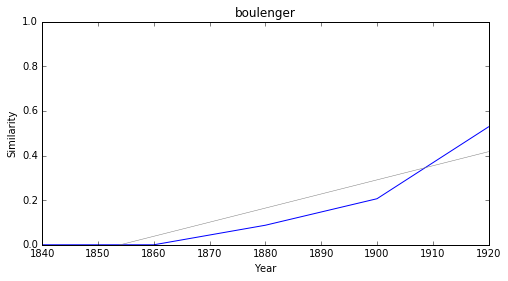

rostand


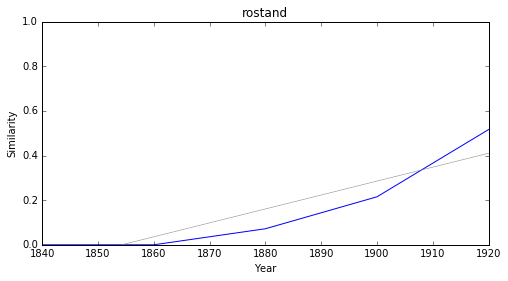

goncourt


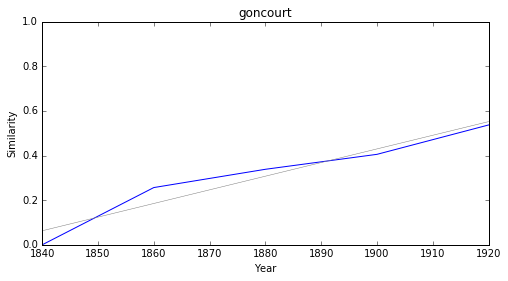

huis


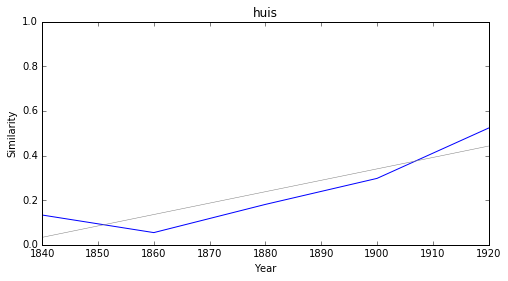

meyer


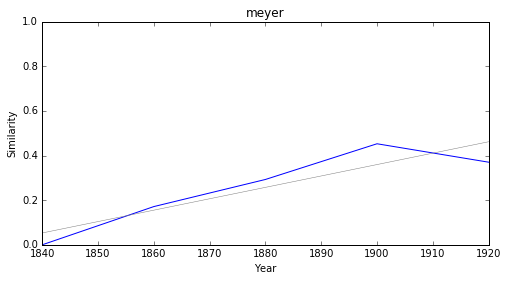

enquête


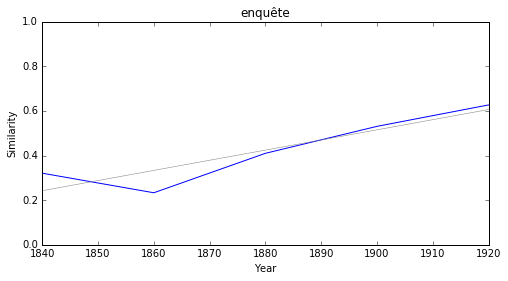

renan


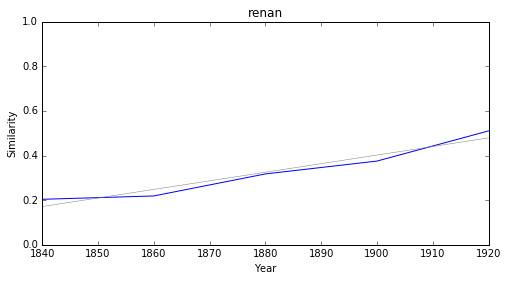

cahier


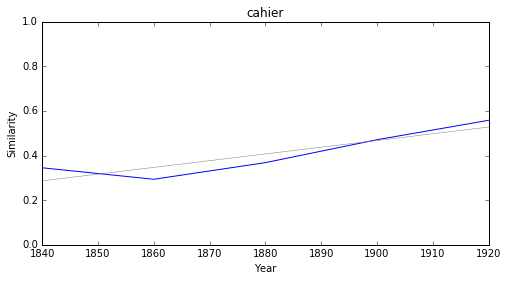

manuel


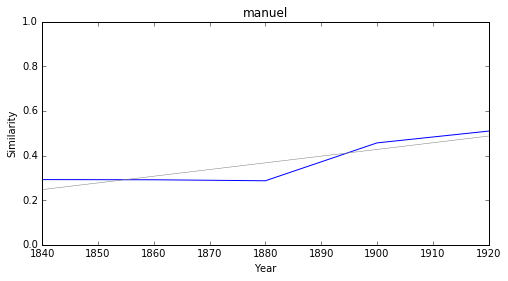

aubignac


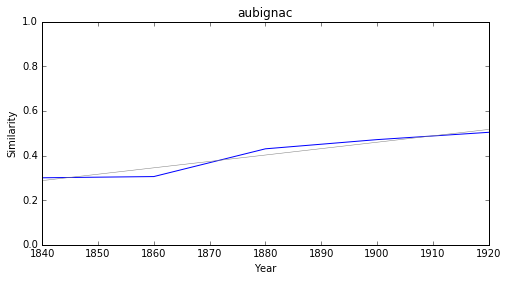

### <i><b>critique</i></b>

            token     slope         p
9   professionnel  0.007992  0.001677
27     brunetière  0.007584  0.019840
34      mentalité  0.007276  0.041012
8     spécialiste  0.006832  0.026375
22       flaubert  0.006129  0.038399
21       stendhal  0.005859  0.012322
10         manuel  0.005489  0.001237
18          taine  0.005356  0.028558
1          apport  0.005130  0.002134
23       réaliste  0.004924  0.028495



professionnel


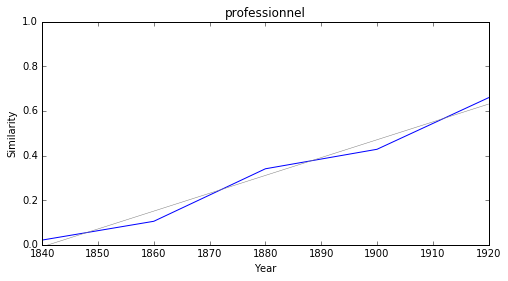

brunetière


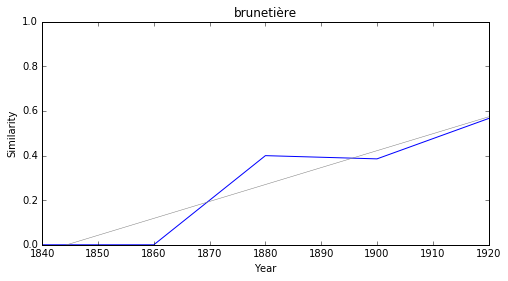

mentalité


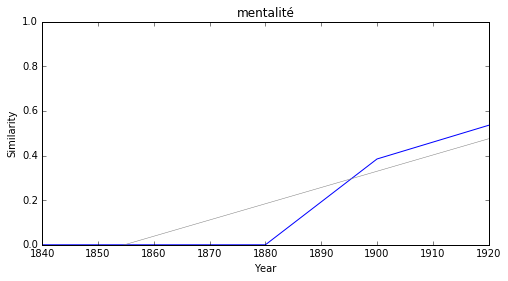

spécialiste


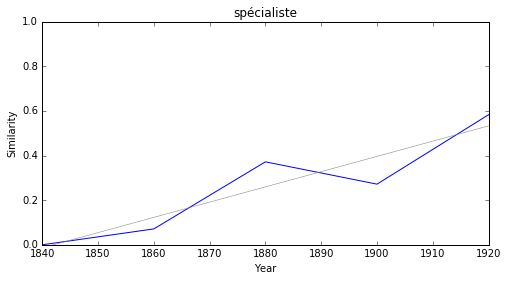

flaubert


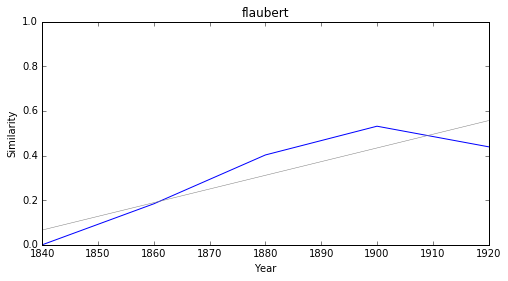

stendhal


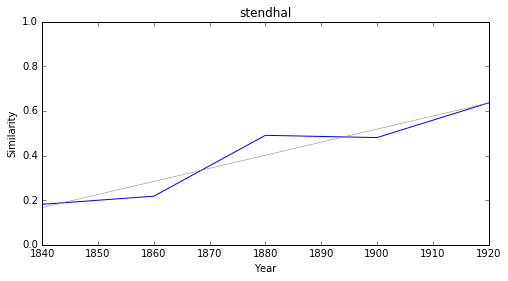

manuel


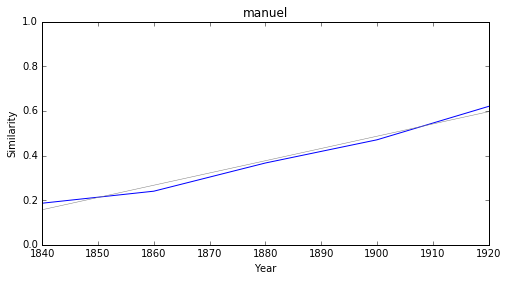

taine


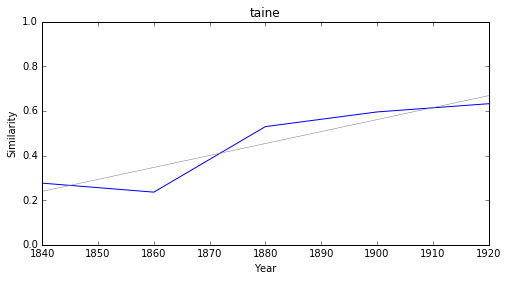

apport


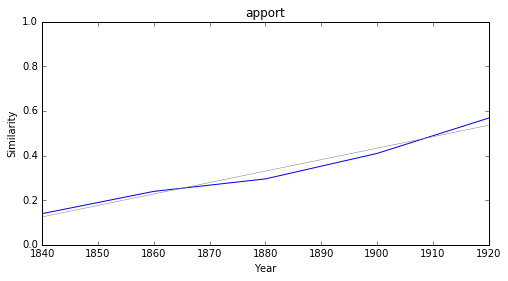

réaliste


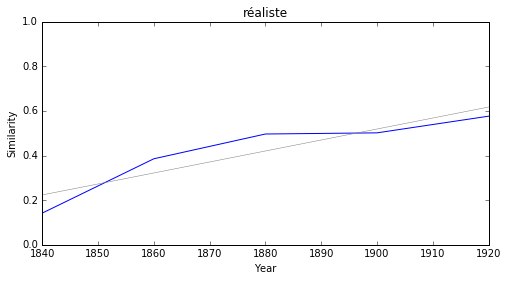

### <i><b>roman</i></b>

               token     slope         p
25         réédition  0.008054  0.017591
23        brunetière  0.006853  0.009692
4             ecrits  0.006385  0.008796
19          flaubert  0.005985  0.032393
16         fascicule  0.005962  0.010966
0   autobiographique  0.005752  0.021953
28       psychologie  0.005001  0.024115
3             manuel  0.004821  0.016735
17          stendhal  0.003796  0.032441
5      psychologique  0.003643  0.046890



réédition


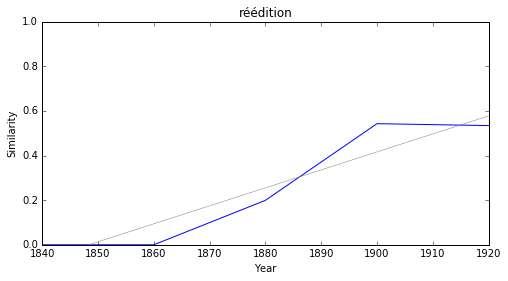

brunetière


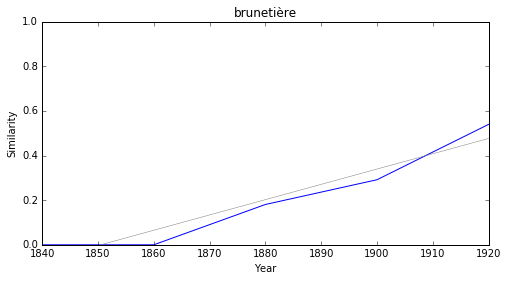

ecrits


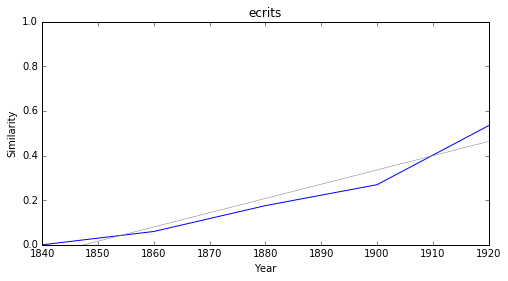

flaubert


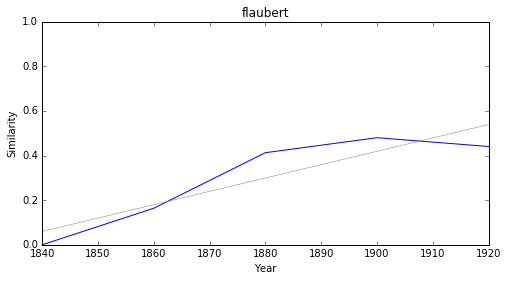

fascicule


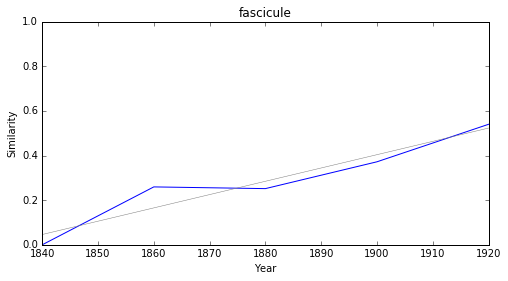

autobiographique


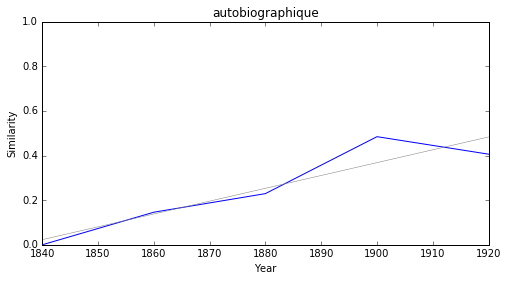

psychologie


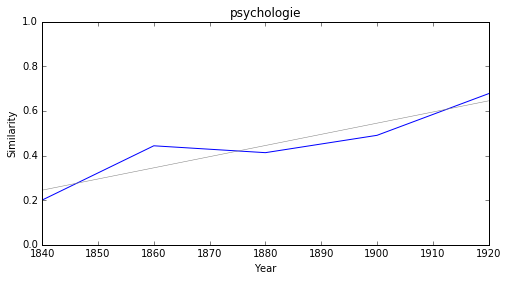

manuel


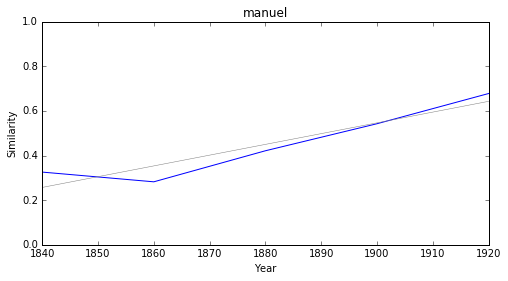

stendhal


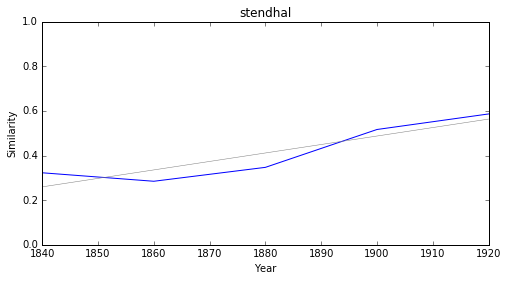

psychologique


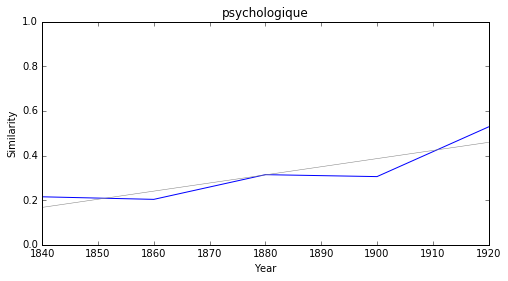

### <i><b>théâtre</i></b>

          token     slope         p
1    arlésienne  0.007858  0.018918
20         fail  0.006452  0.043836
15  classicisme  0.006441  0.038381
14   plébiscite  0.006274  0.003488
6        bartas  0.005827  0.044500
7       cénacle  0.003865  0.011995
13     parnasse  0.002804  0.028749
18  shakespeare  0.002791  0.003469
5          type  0.002581  0.047111
17     dialogue  0.002164  0.005454



arlésienne


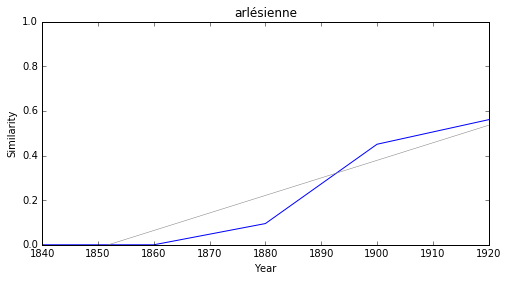

fail


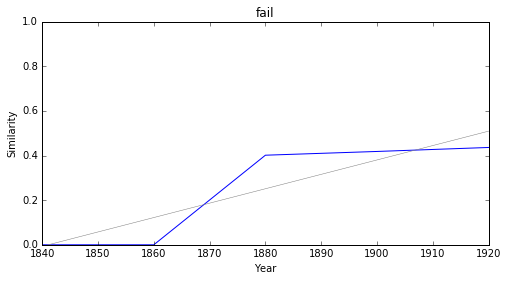

classicisme


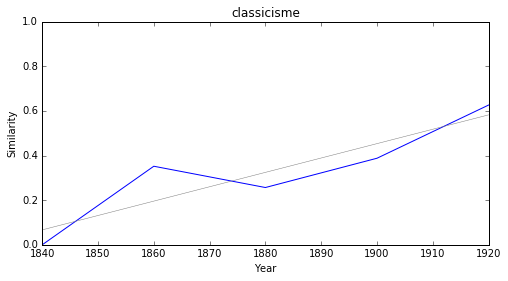

plébiscite


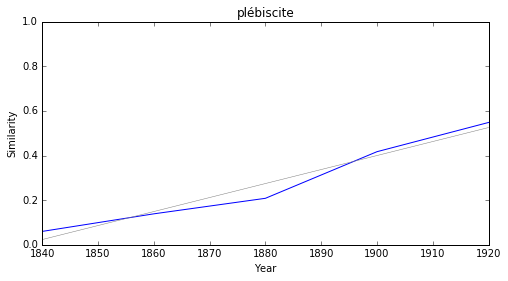

bartas


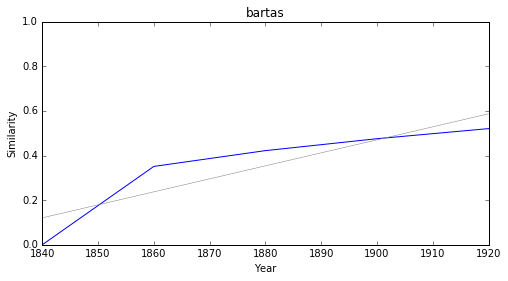

cénacle


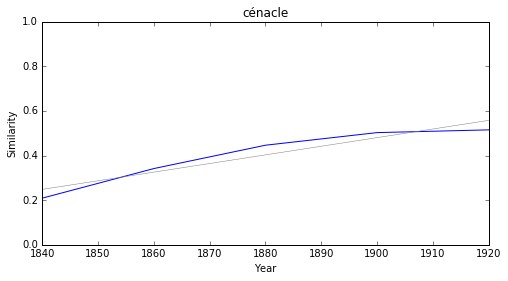

parnasse


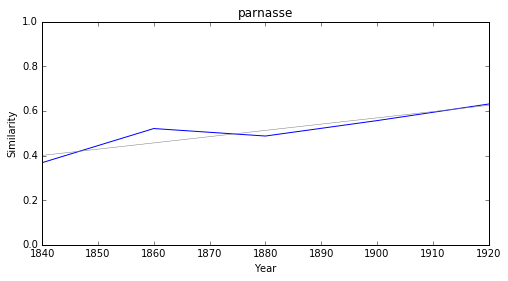

shakespeare


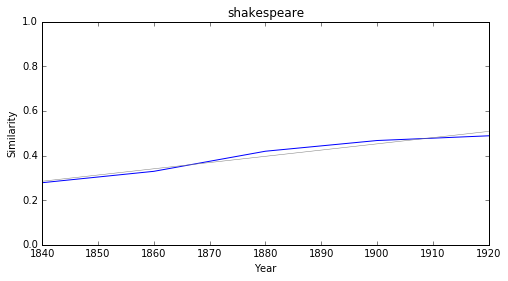

type


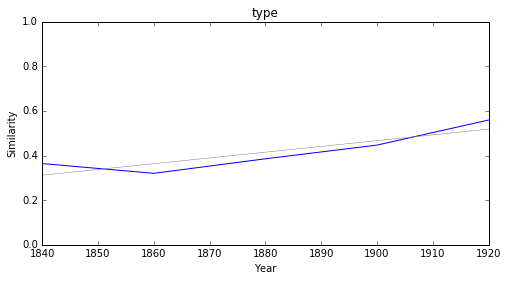

dialogue


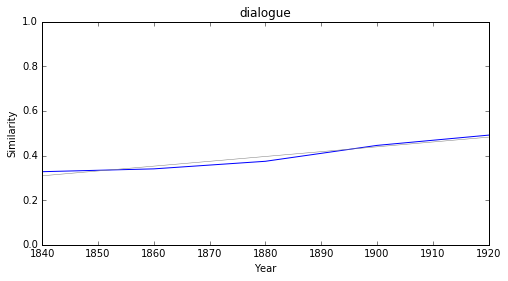

### <i><b>drame</i></b>

           token     slope         p
0     arlésienne  0.008230  0.022633
10     pacifisme  0.007402  0.049431
5   déséquilibre  0.007115  0.017128
22       concept  0.006891  0.014500
19         recul  0.006337  0.029939
4         cliché  0.006004  0.019917
9        facteur  0.004261  0.008167
1        symbole  0.003538  0.011245
26   psychologie  0.003240  0.017406
8     romantique  0.002358  0.005027



arlésienne


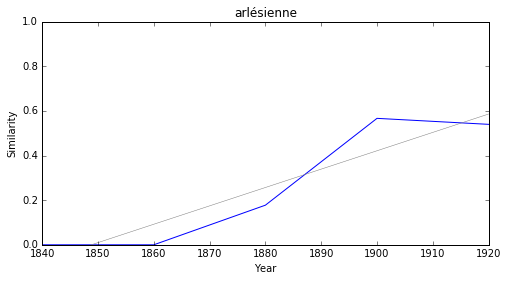

pacifisme


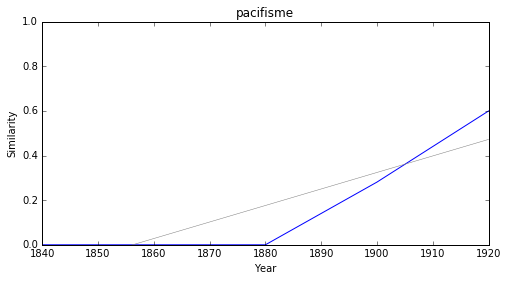

déséquilibre


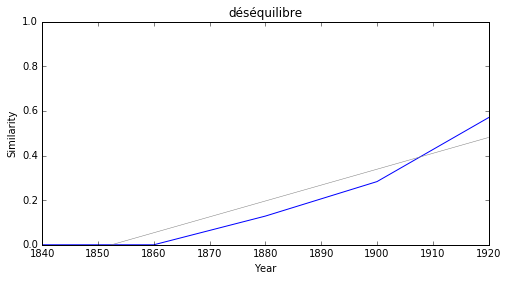

concept


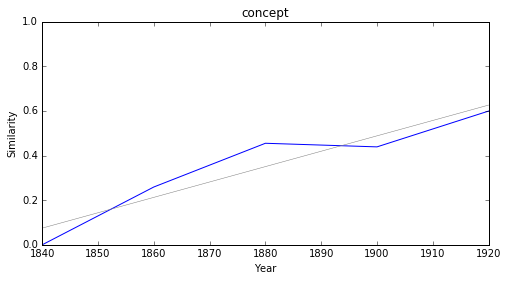

recul


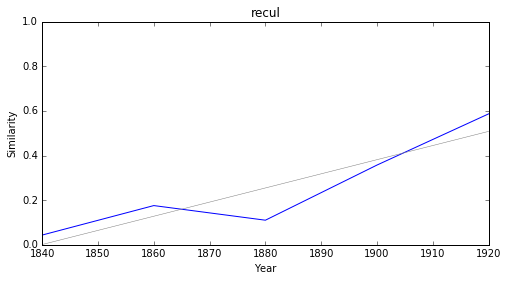

cliché


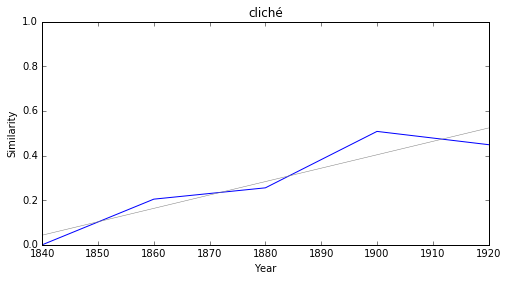

facteur


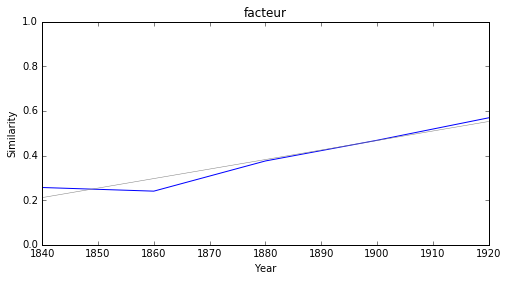

symbole


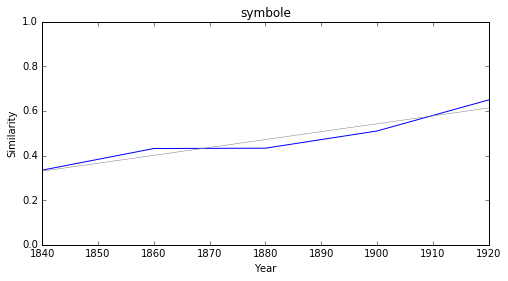

psychologie


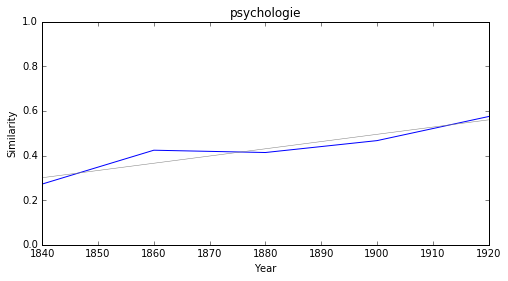

romantique


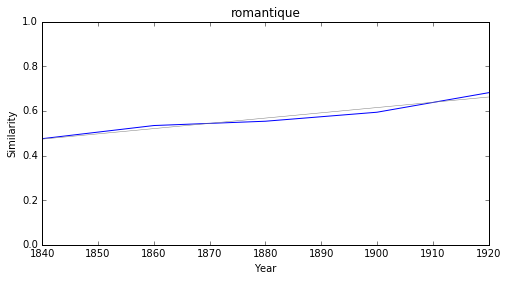

### <i><b>esprit</i></b>

             token     slope         p
6        conscient  0.008319  0.000038
5      inconscient  0.007676  0.002770
15  individualisme  0.006321  0.022916
2         hérédité  0.005464  0.029999
11       incapable  0.004584  0.024917
25      discipline  0.004183  0.038798
16          vision  0.004068  0.025569
23   compréhension  0.003943  0.043196
19    personnalité  0.003904  0.001634
3        intuition  0.003895  0.015316



conscient


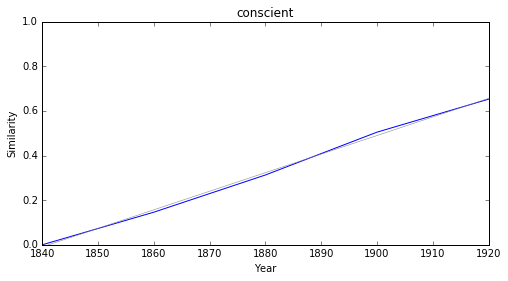

inconscient


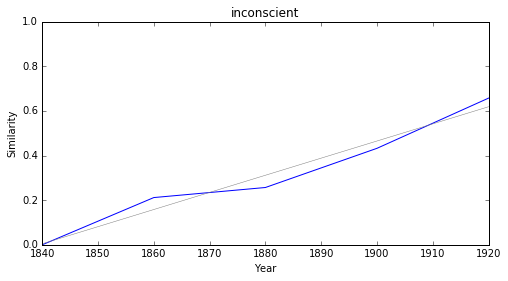

individualisme


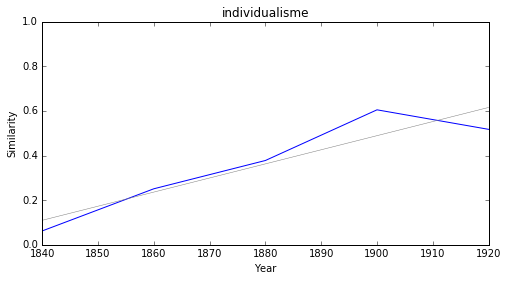

hérédité


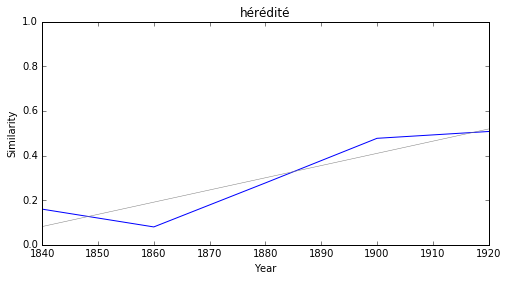

incapable


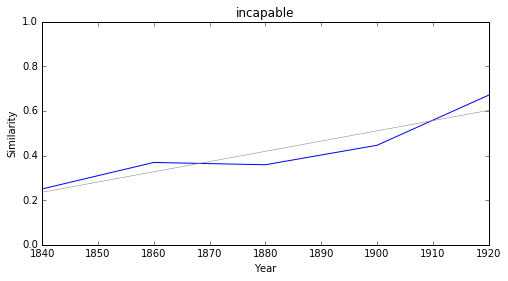

discipline


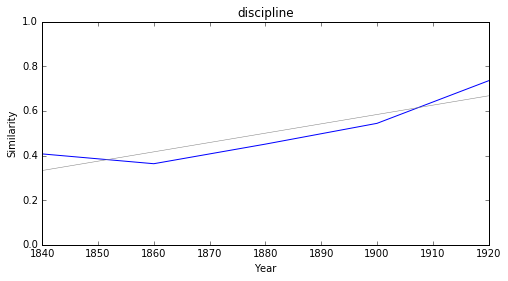

vision


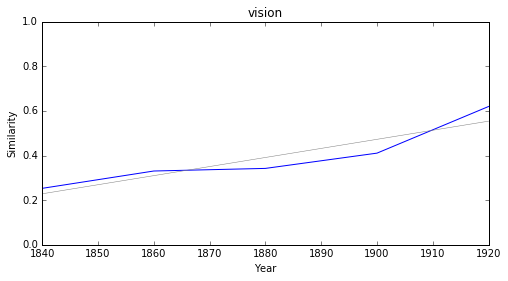

compréhension


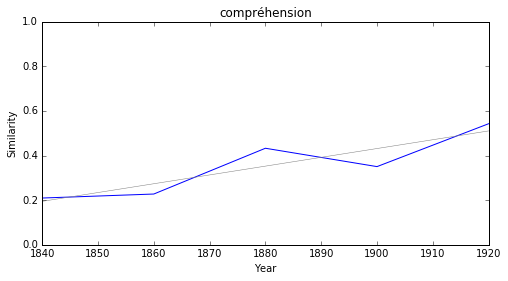

personnalité


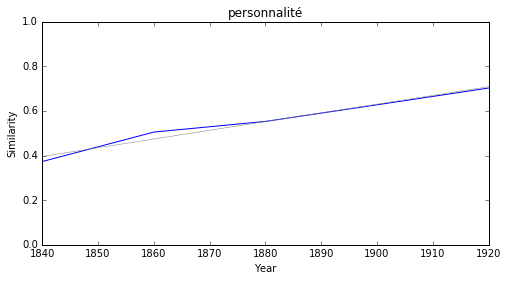

intuition


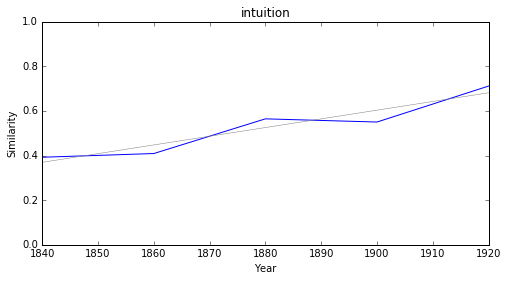

### <i><b>langue</i></b>

            token     slope         p
22      humanisme  0.009380  0.010400
29      mentalité  0.008766  0.044714
3   professionnel  0.008668  0.008152
31     sociologie  0.006649  0.036656
10     adaptation  0.006539  0.022217
9      romantique  0.004254  0.009023
23     catholique  0.004068  0.032273
13       majorité  0.004041  0.032740
20     théoricien  0.003533  0.006794
1          france  0.003433  0.038887



humanisme


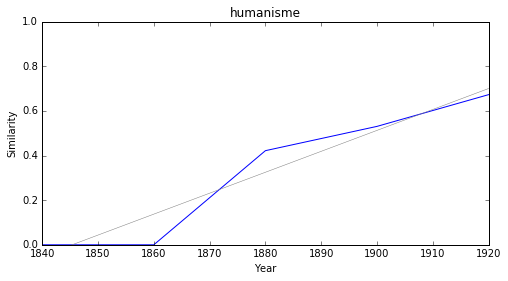

mentalité


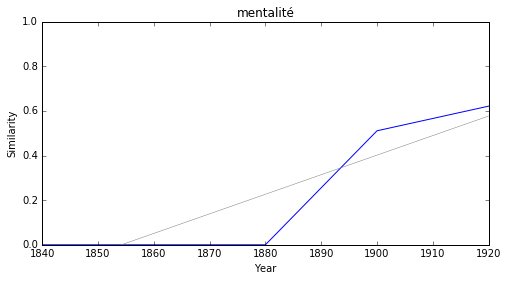

professionnel


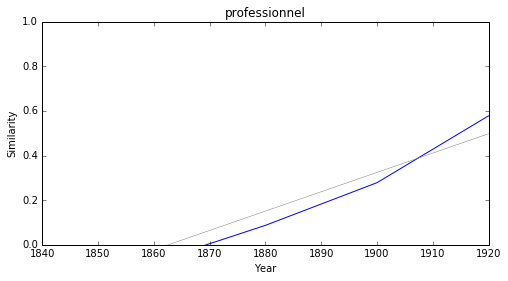

sociologie


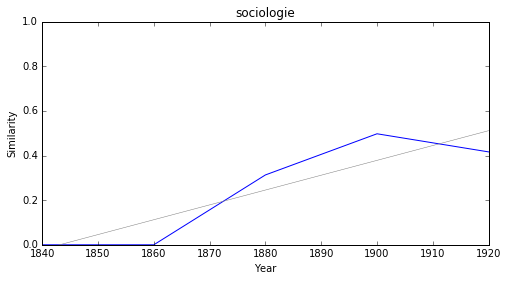

adaptation


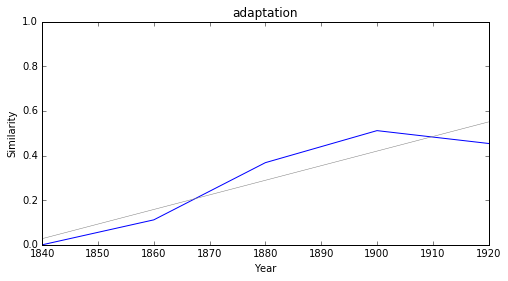

romantique


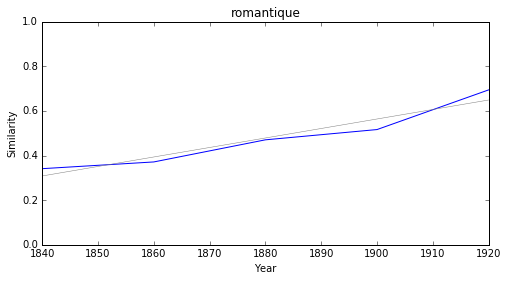

catholique


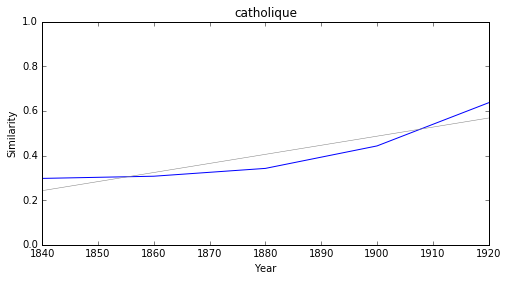

majorité


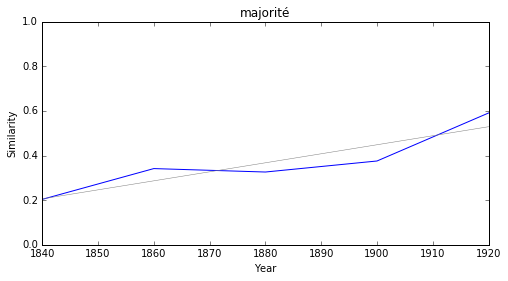

théoricien


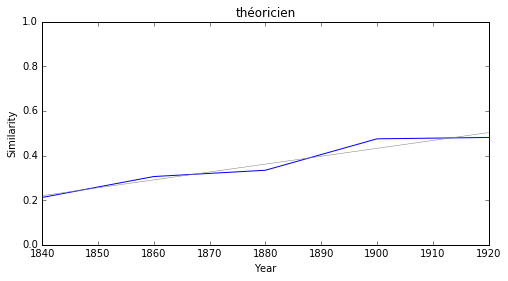

france


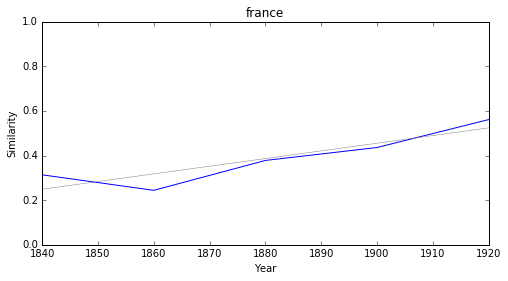

### <i><b>diplomatie</i></b>

              token     slope         p
71     accoutumance  0.012401  0.018452
72          édicter  0.012000  0.017030
43           libido  0.011935  0.043128
49   évolutionniste  0.011805  0.019631
14         médiéval  0.011489  0.033102
4   automatiquement  0.011313  0.013109
36        ancestral  0.011276  0.024314
26       machinerie  0.011262  0.012191
39     pornographie  0.011246  0.007880
20       frondaison  0.011242  0.006671



accoutumance


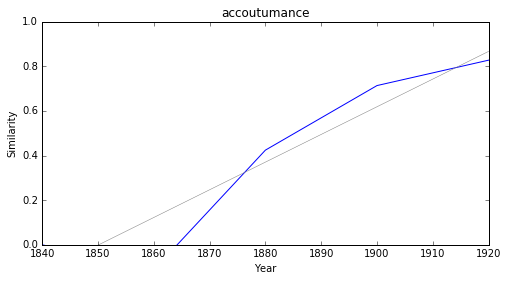

édicter


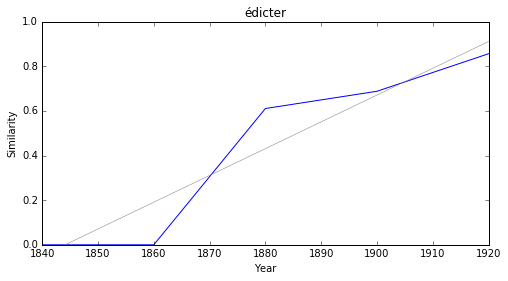

libido


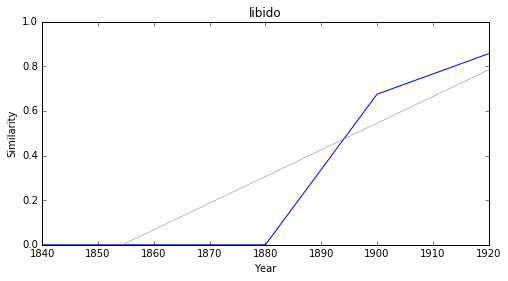

évolutionniste


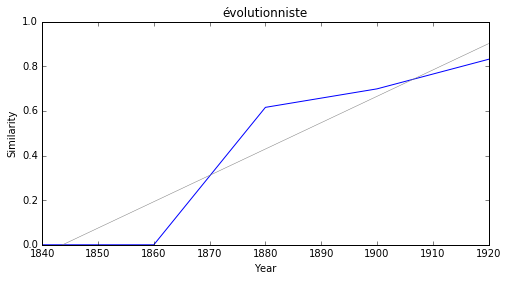

médiéval


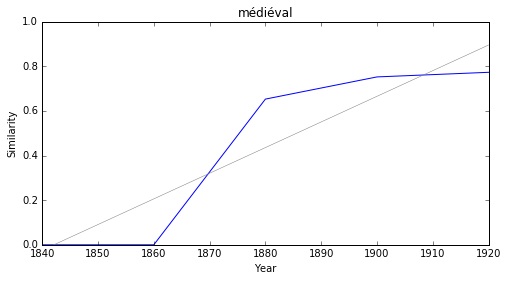

automatiquement


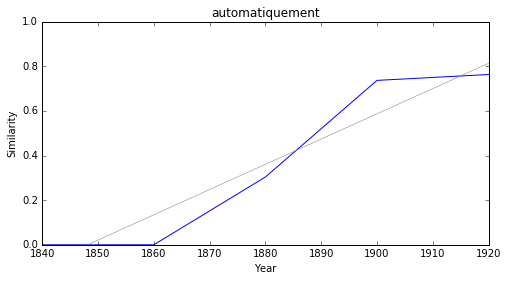

ancestral


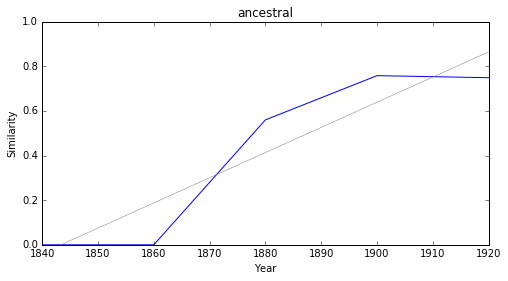

machinerie


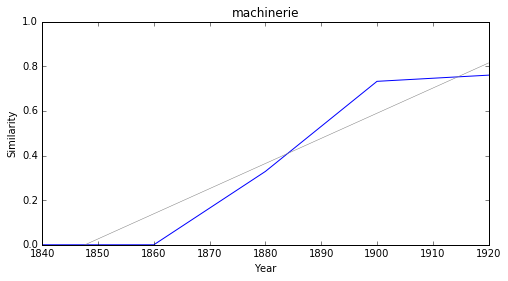

pornographie


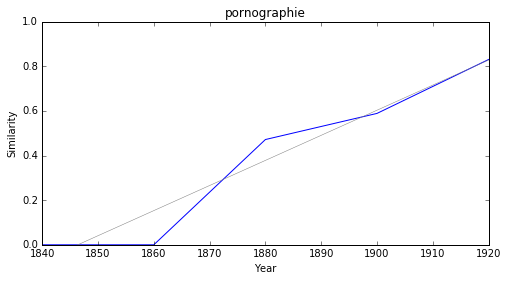

frondaison


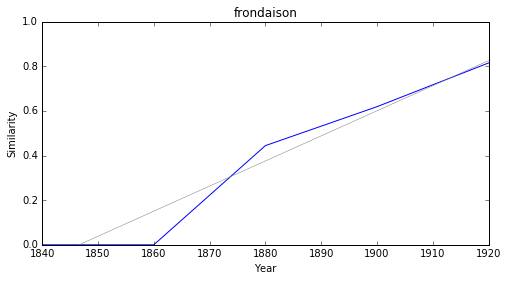

### <i><b>politique</i></b>

            token     slope         p
29     sociologie  0.009202  0.032623
22      humanisme  0.009007  0.020162
24        évoluer  0.008123  0.007157
11        éthique  0.008014  0.000936
7    sociologique  0.007912  0.024952
18     symboliste  0.007876  0.016387
14       ethnique  0.006631  0.027557
13   linguistique  0.006483  0.038141
25        concept  0.006414  0.028780
5   vulgarisation  0.006250  0.017014



sociologie


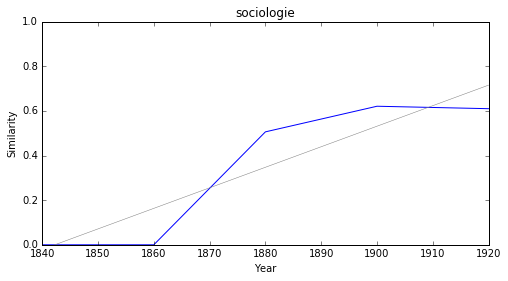

humanisme


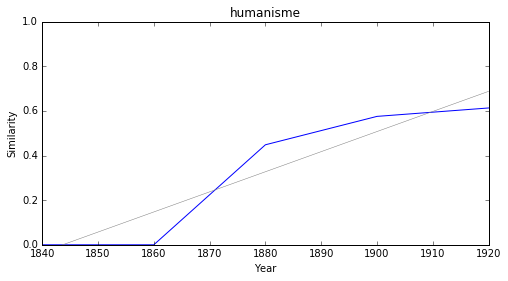

évoluer


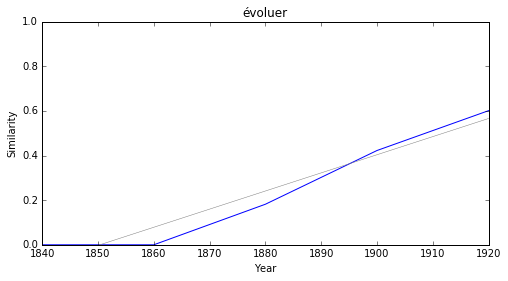

éthique


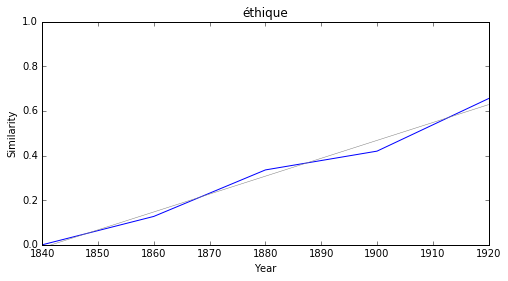

sociologique


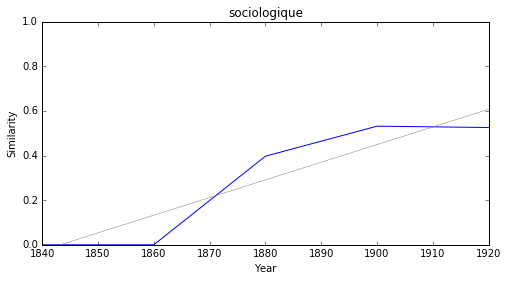

symboliste


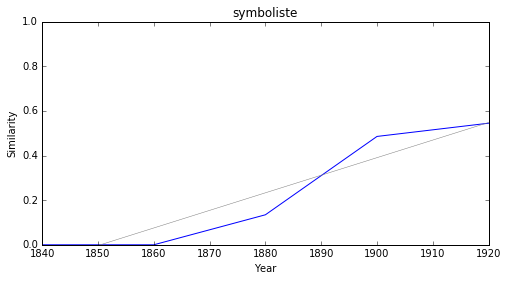

ethnique


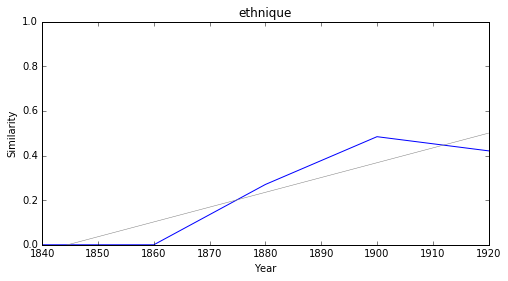

linguistique


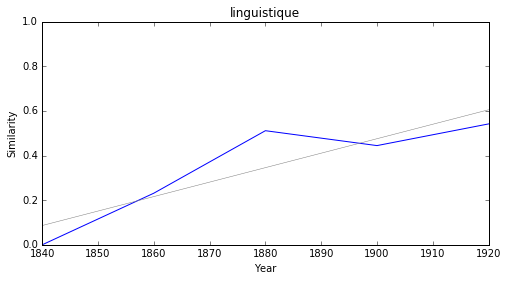

concept


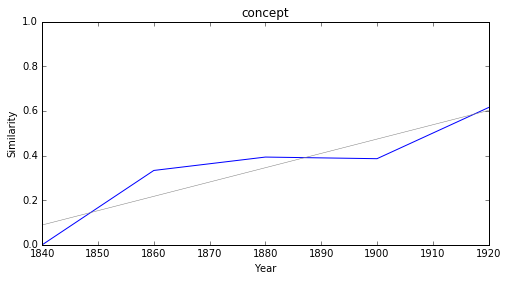

vulgarisation


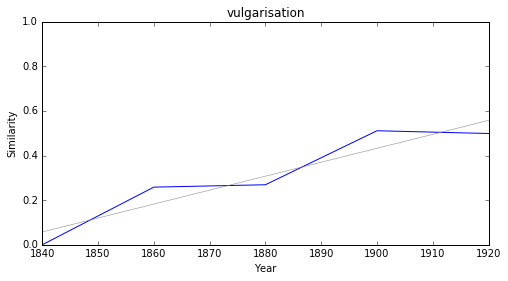

### <i><b>morale</i></b>

             token     slope         p
16         éthique  0.009229  0.003567
31      sociologie  0.008759  0.044621
9        conscient  0.008699  0.012856
23       humanisme  0.008354  0.039487
6      inconscient  0.008275  0.008551
0   inconnaissable  0.007942  0.038572
25         concept  0.007938  0.030949
7      objectivité  0.007583  0.010090
5    professionnel  0.006264  0.019443
22           total  0.005670  0.001354



éthique


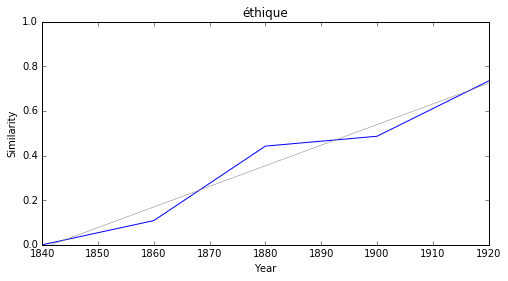

sociologie


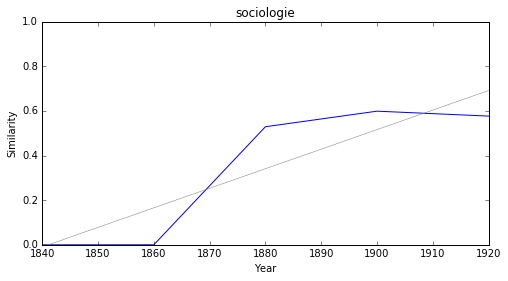

conscient


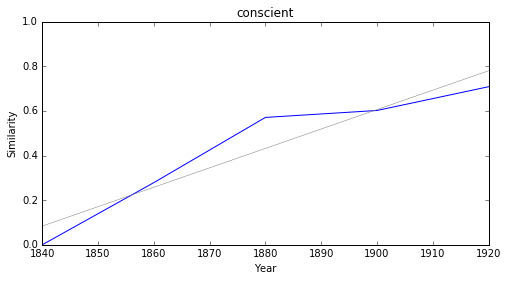

humanisme


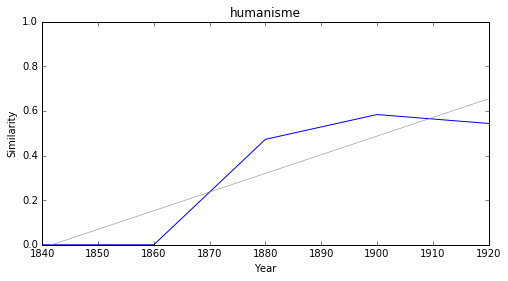

inconscient


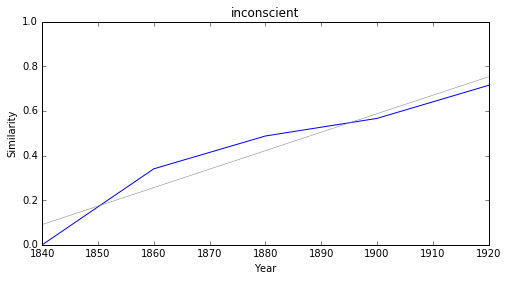

inconnaissable


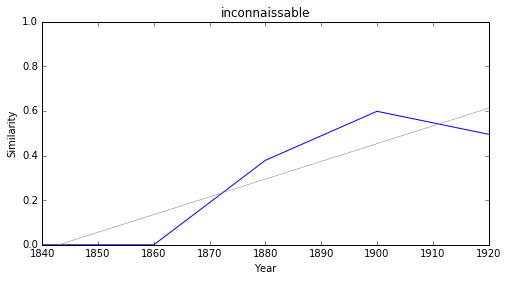

concept


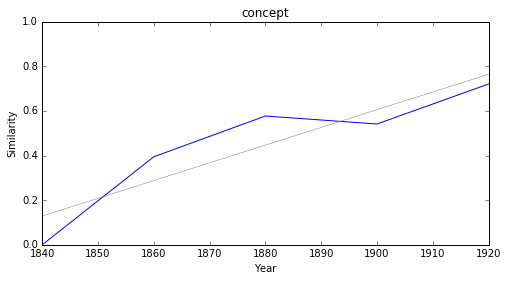

objectivité


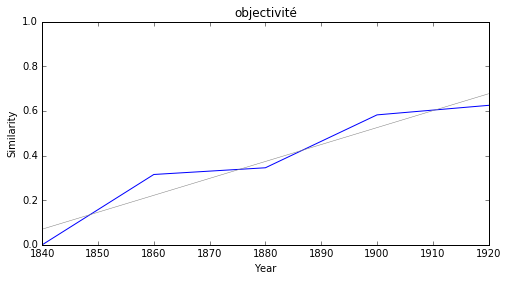

professionnel


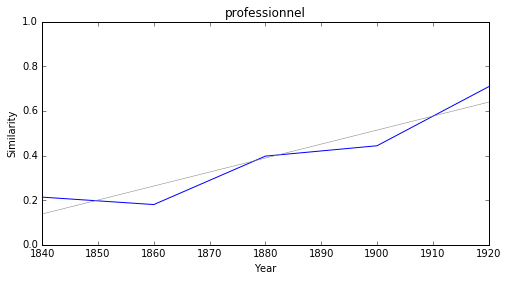

total


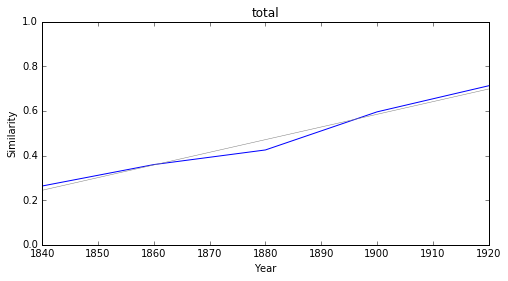

### <i><b>société</i></b>

         token     slope         p
19           s  0.010440  0.048208
28   humanisme  0.009360  0.012021
32  révocation  0.009260  0.001978
42         mém  0.008870  0.026577
43  sociologie  0.008341  0.015438
17  symboliste  0.007721  0.026858
0     toulouse  0.007333  0.044755
10     facteur  0.007258  0.042185
11  adaptation  0.007153  0.004541
12     mémoire  0.007135  0.016869



s


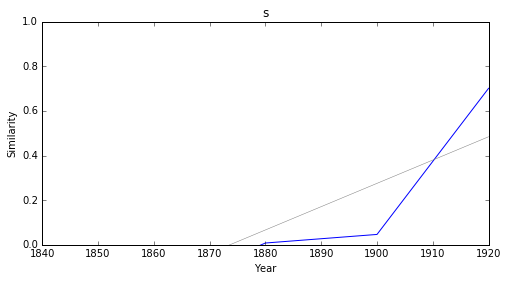

humanisme


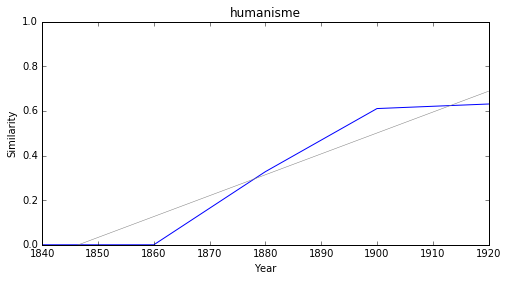

révocation


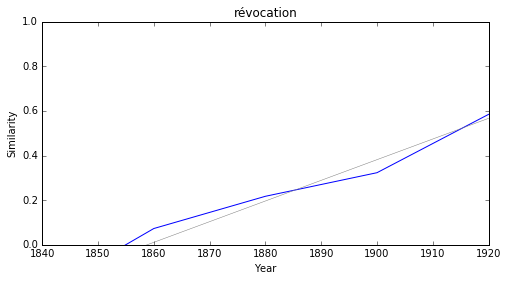

mém


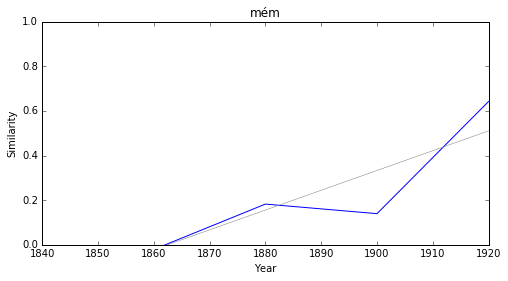

sociologie


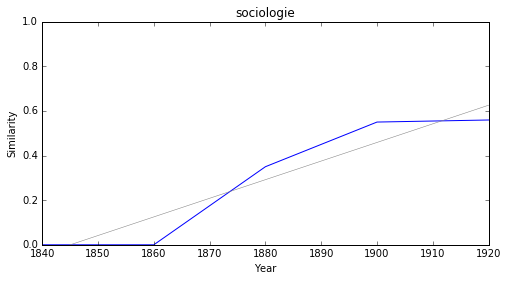

symboliste


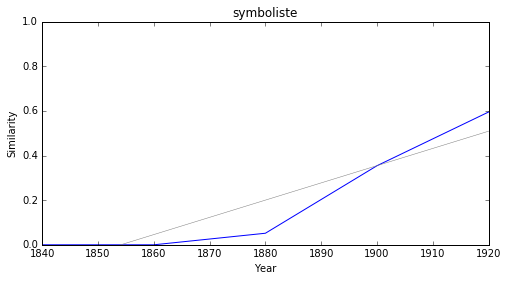

toulouse


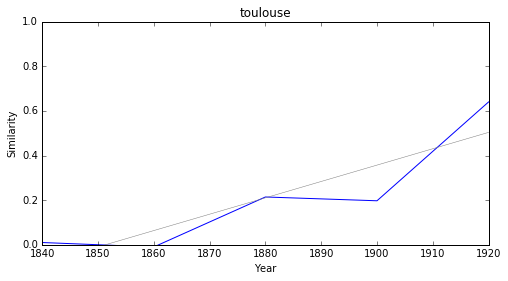

facteur


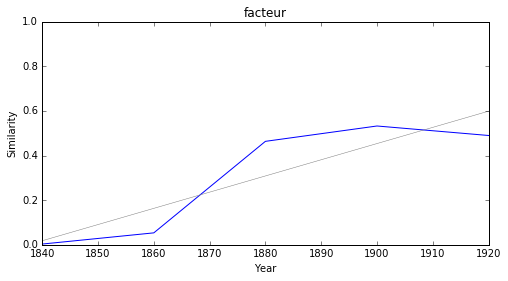

adaptation


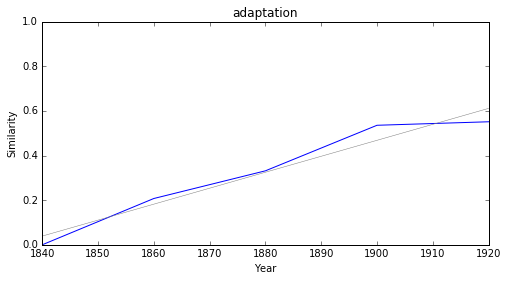

mémoire


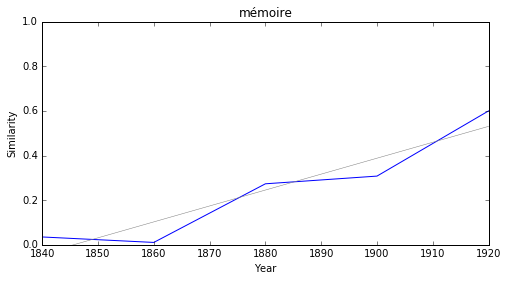

### <i><b>pouvoir</i></b>

            token     slope         p
8          cosmos  0.006506  0.033525
10         risque  0.004583  0.023295
16     discipline  0.003366  0.026525
7        réaliser  0.003244  0.047176
15     réellement  0.003212  0.027874
17      percevoir  0.003005  0.000270
6         formule  0.002461  0.019813
19    précisément  0.002380  0.025222
5     originalité  0.002370  0.047944
3   naturellement  0.002314  0.016528



cosmos


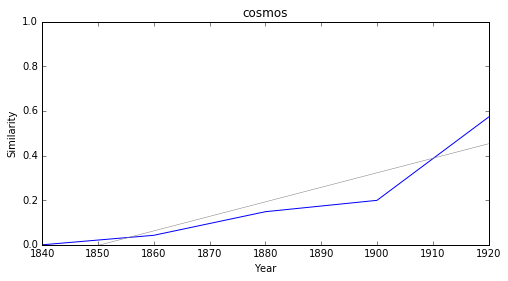

risque


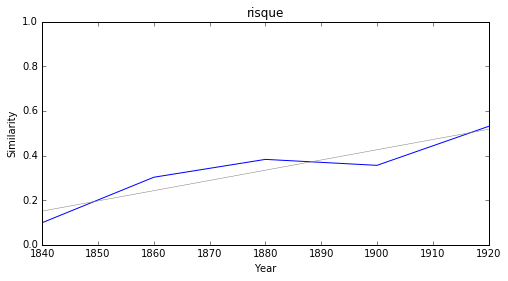

discipline


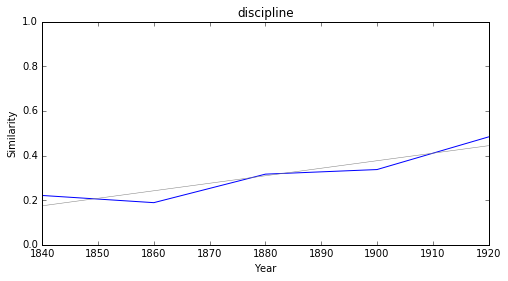

réaliser


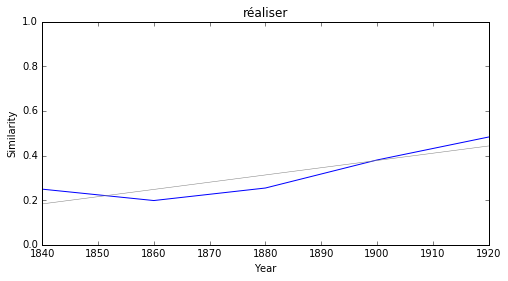

réellement


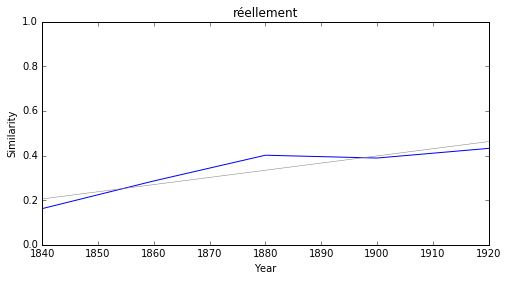

percevoir


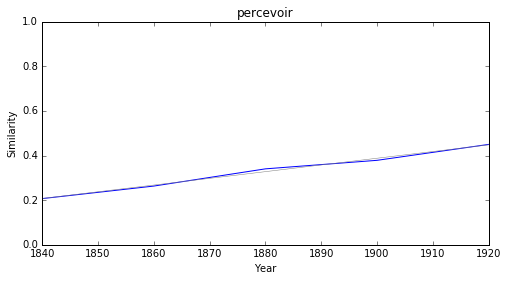

formule


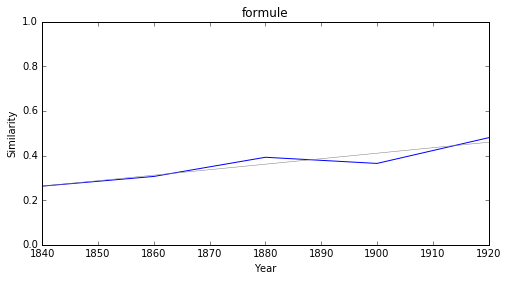

précisément


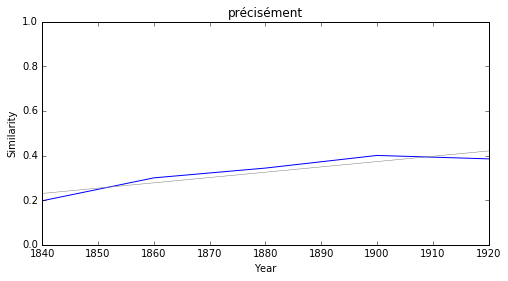

originalité


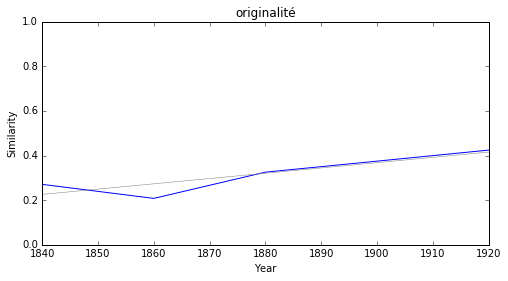

naturellement


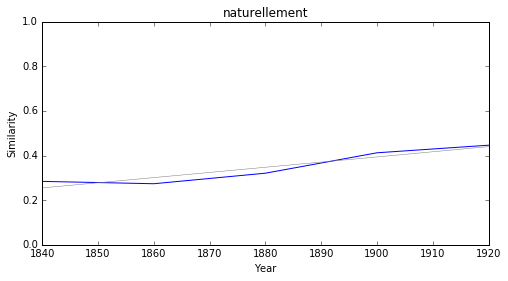

### <i><b>théologie</i></b>

              token     slope         p
38        humanisme  0.011796  0.025058
4                sc  0.010558  0.002768
27       symboliste  0.010449  0.009760
12     sociologique  0.010388  0.027225
1       fédéralisme  0.010293  0.020457
10      orientation  0.010264  0.036678
44  instrumentation  0.010202  0.018235
18         economie  0.010124  0.005620
26          corrèze  0.010103  0.012128
31          maugras  0.010060  0.011387



humanisme


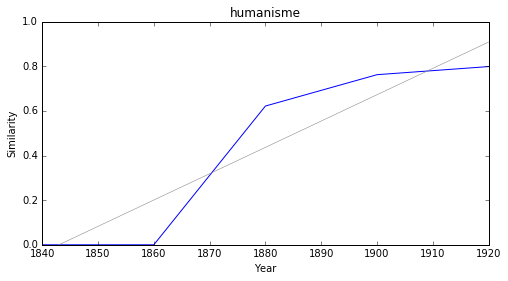

sc


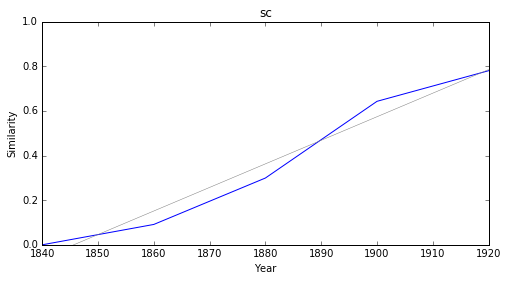

symboliste


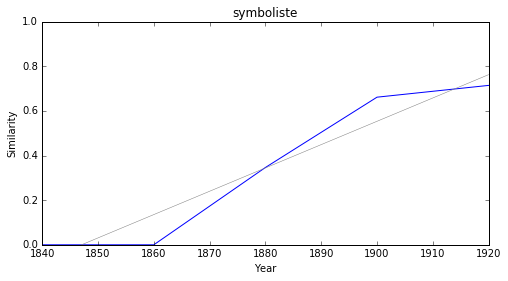

sociologique


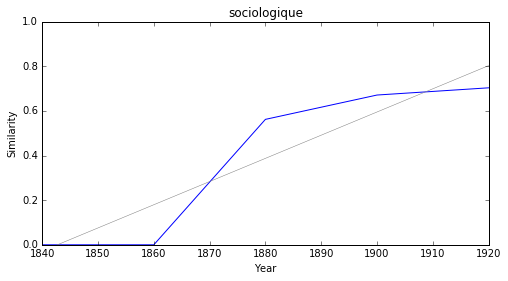

fédéralisme


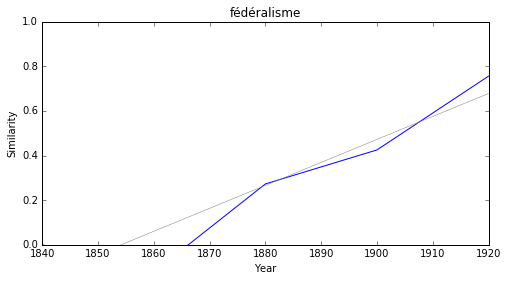

orientation


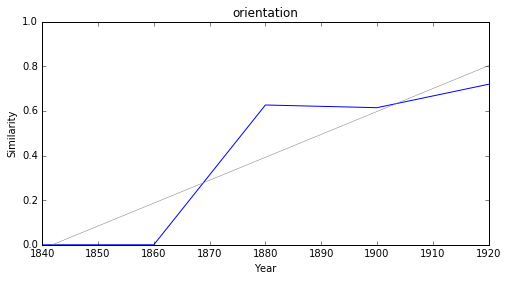

instrumentation


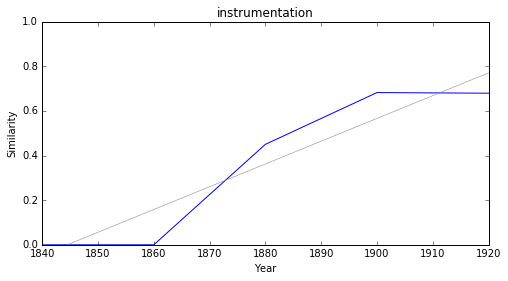

economie


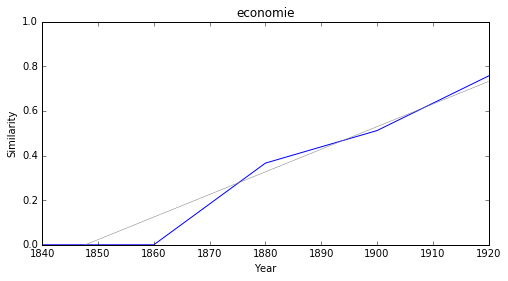

corrèze


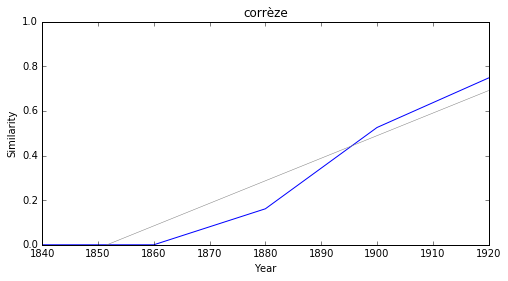

maugras


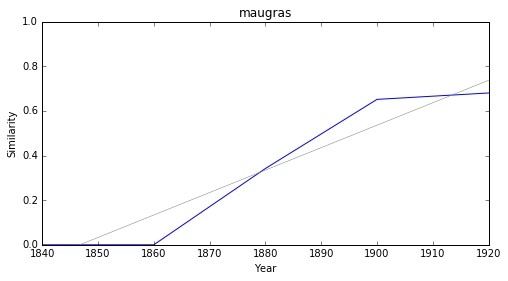

### <i><b>droit</i></b>

           token     slope         p
15   castagnette  0.005653  0.038444
14  reproduction  0.005270  0.026960
21         pacte  0.004535  0.041624
6        salaire  0.004500  0.023091
8       majorité  0.003360  0.047964
1      règlement  0.001205  0.049223
13       libéral  0.001009  0.030495
7           code -0.000877  0.012986
9     obéissance -0.001873  0.020389
5       garantie -0.001939  0.004626



castagnette


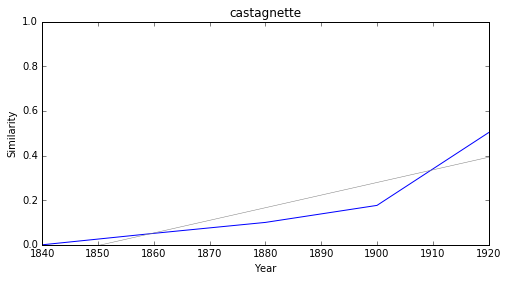

reproduction


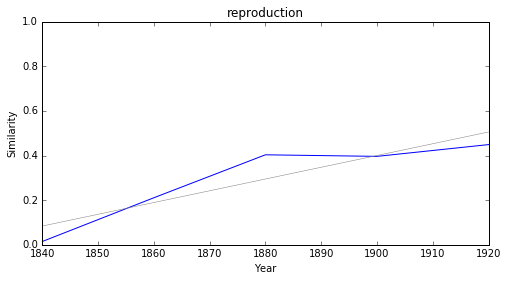

pacte


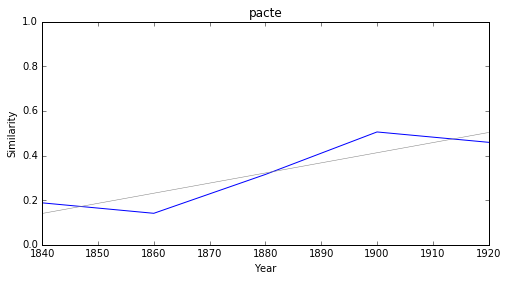

salaire


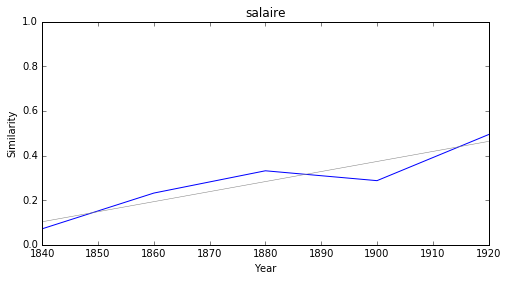

majorité


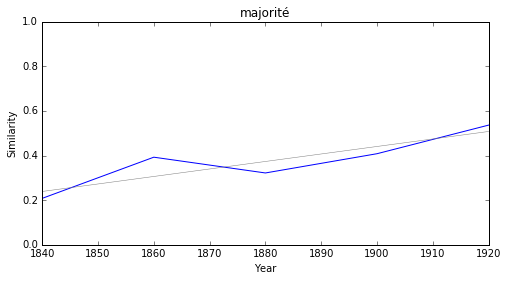

règlement


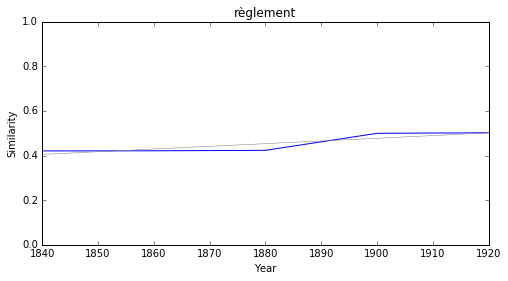

libéral


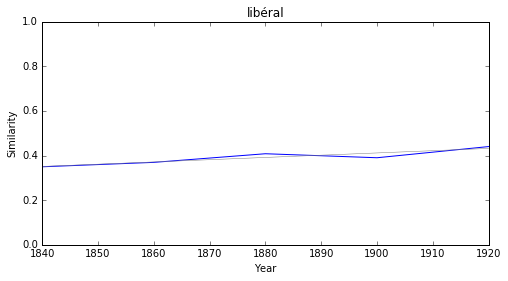

code


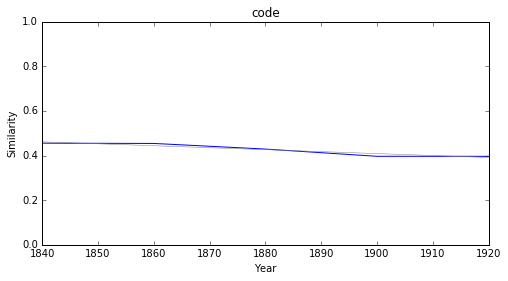

obéissance


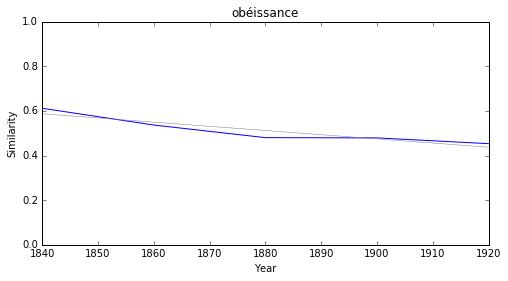

garantie


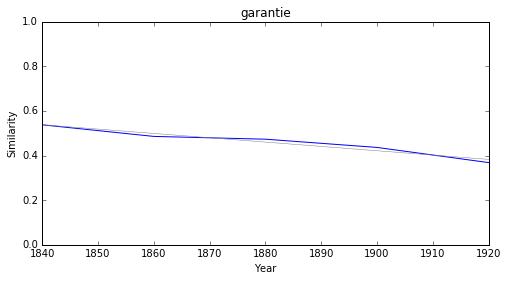

### <i><b>loi</i></b>

          token     slope         p
11      facteur  0.008098  0.047704
8     conscient  0.007278  0.021705
7   inconscient  0.007228  0.003676
1        apport  0.005466  0.040811
2     intuition  0.004876  0.032810
12   divergence  0.004417  0.026987
18  réalisation  0.004195  0.033085
10   séparation  0.004173  0.019730
5       conflit  0.003994  0.020739
14     majorité  0.003969  0.008353



facteur


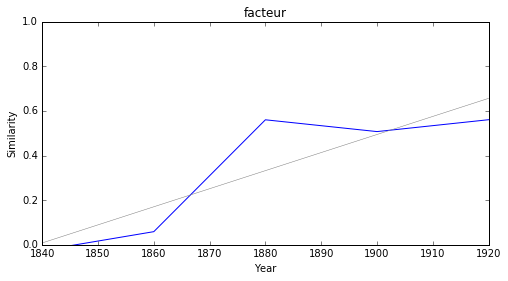

conscient


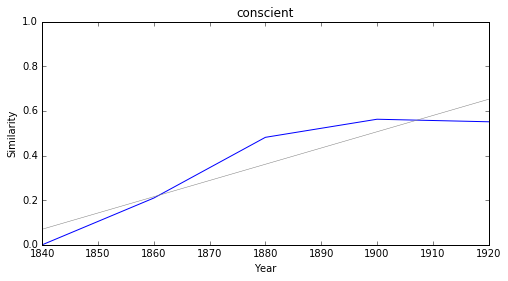

inconscient


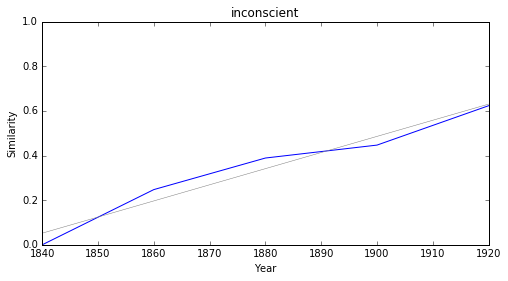

apport


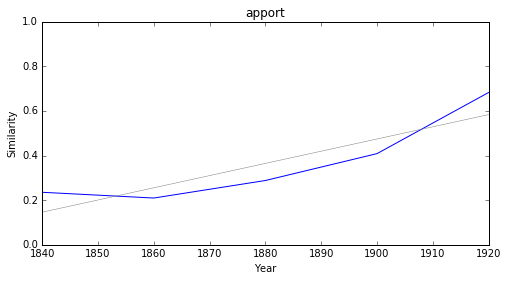

intuition


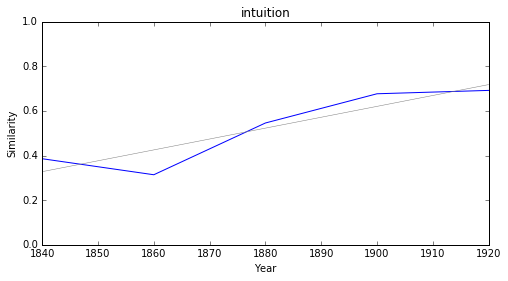

divergence


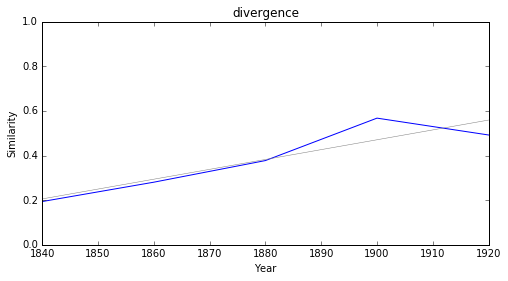

réalisation


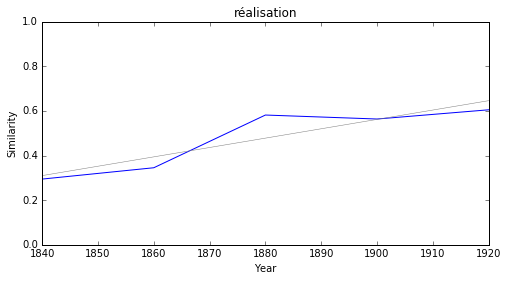

séparation


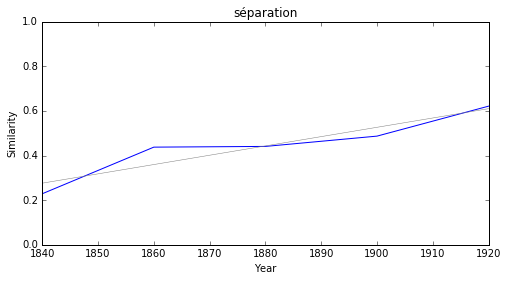

conflit


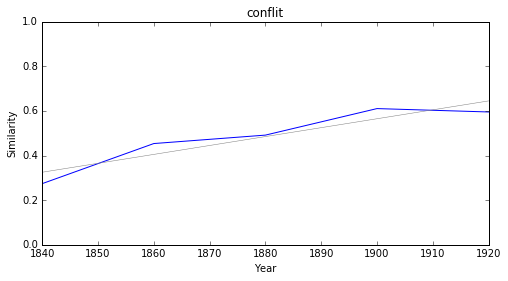

majorité


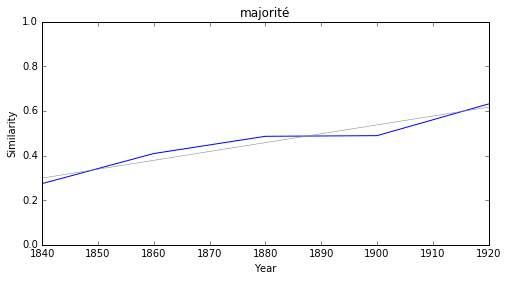

### <i><b>méthode</i></b>

             token     slope         p
15         éthique  0.009695  0.011454
6      orientation  0.009458  0.042818
9      objectivité  0.008452  0.017898
10       conscient  0.008203  0.007583
8    professionnel  0.007688  0.016970
3           apport  0.005434  0.003098
21  individualisme  0.005328  0.040407
22     réalisation  0.004716  0.045058
30       idéalisme  0.003802  0.048683
4       esthétique  0.002216  0.040282



éthique


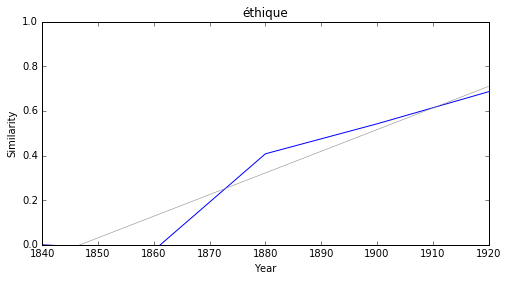

orientation


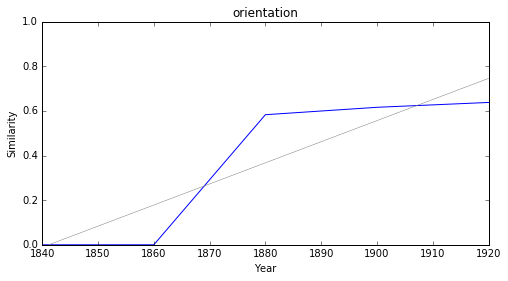

objectivité


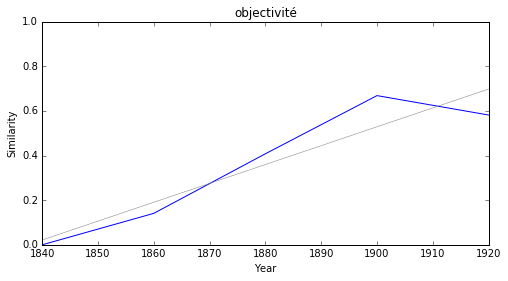

conscient


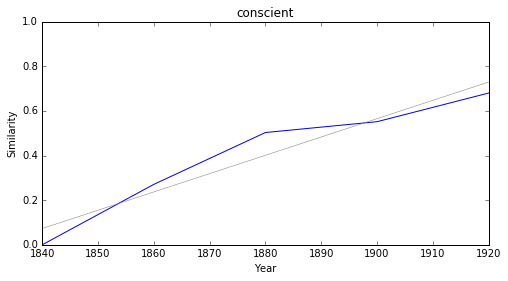

professionnel


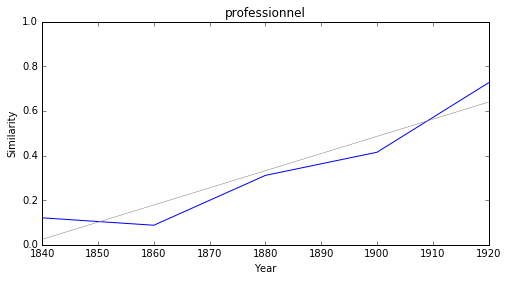

apport


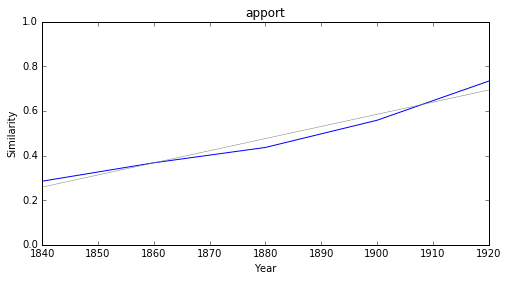

individualisme


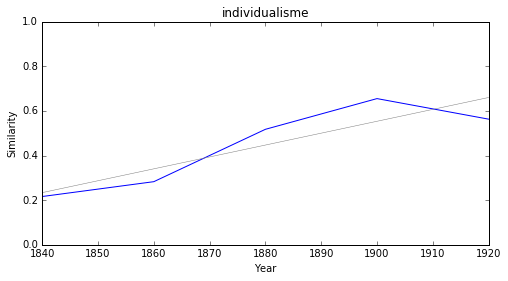

réalisation


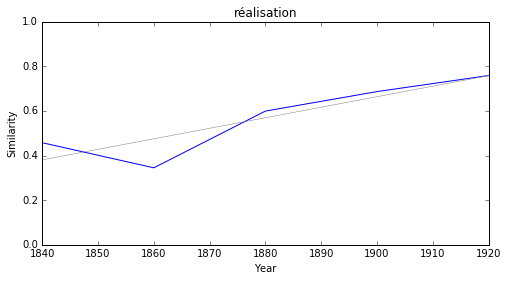

idéalisme


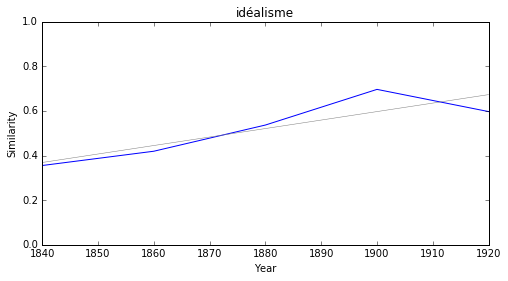

esthétique


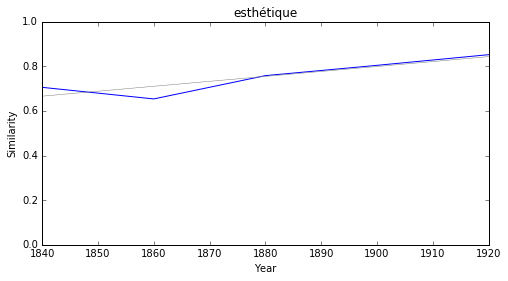

### <i><b>génie</i></b>

            token     slope         p
8       conscient  0.007859  0.000248
6   professionnel  0.007078  0.016404
24        concept  0.006486  0.018487
20   déterminisme  0.006152  0.048914
3      pessimisme  0.005603  0.019686
1          apport  0.005474  0.033953
17    détachement  0.005224  0.020071
19        lyrisme  0.004757  0.023723
14     dramaturge  0.004176  0.015516
11     romantique  0.004173  0.001099



conscient


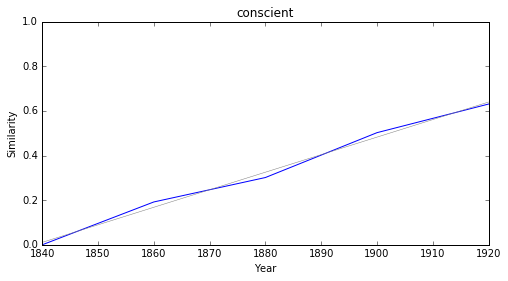

professionnel


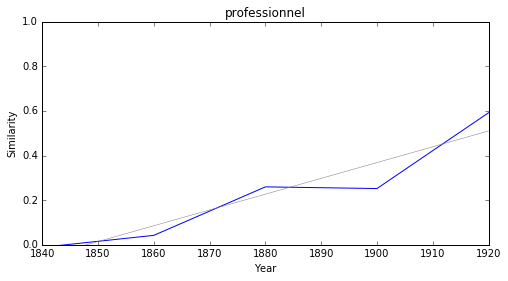

concept


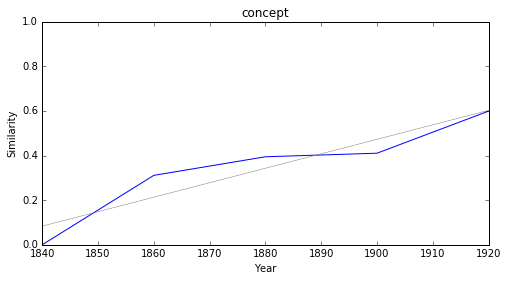

déterminisme


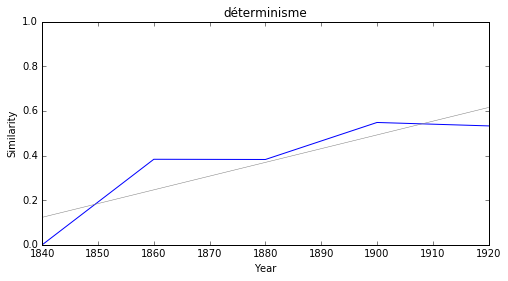

pessimisme


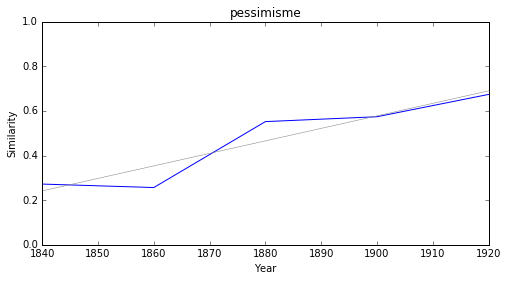

apport


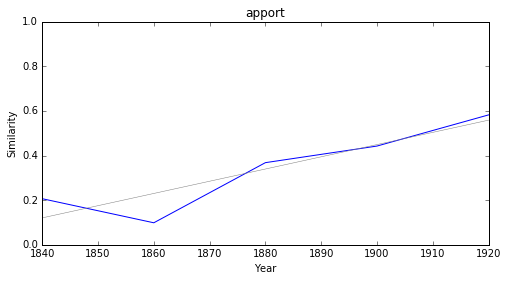

détachement


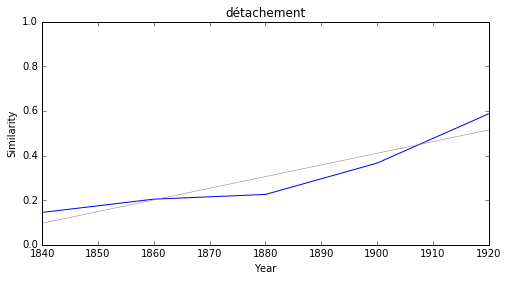

lyrisme


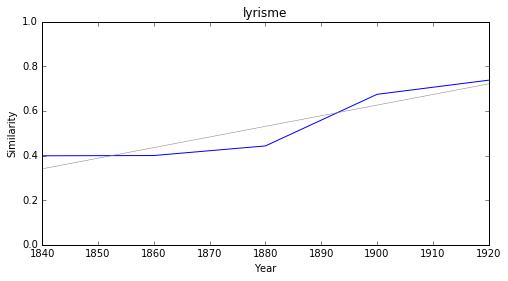

dramaturge


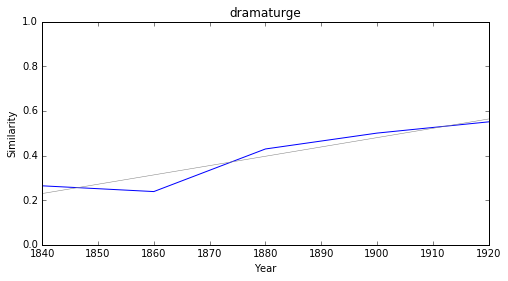

romantique


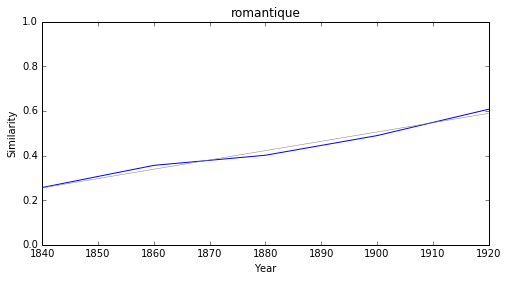

### <i><b>romantisme</i></b>

            token     slope         p
55      humanisme  0.009400  0.029588
46      pacifisme  0.008884  0.046662
41   nationalisme  0.008766  0.012548
44     symboliste  0.007830  0.039538
4    subconscient  0.007579  0.040010
27    parnassiens  0.006914  0.047643
48    déformation  0.006341  0.019789
12  professionnel  0.005866  0.019548
39        surtout  0.004544  0.013432
56     catholique  0.004253  0.007133



humanisme


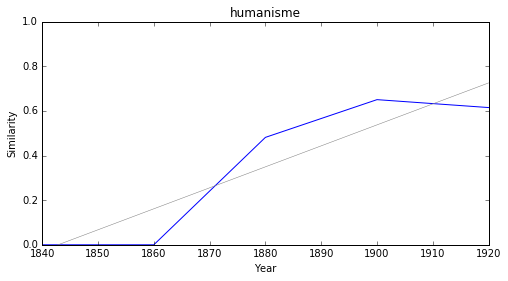

pacifisme


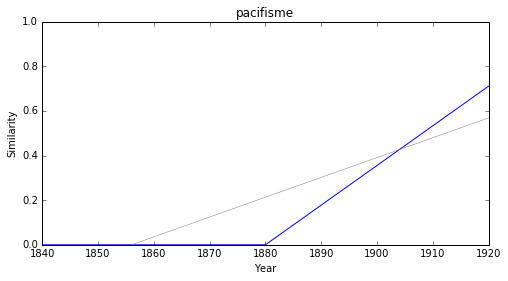

nationalisme


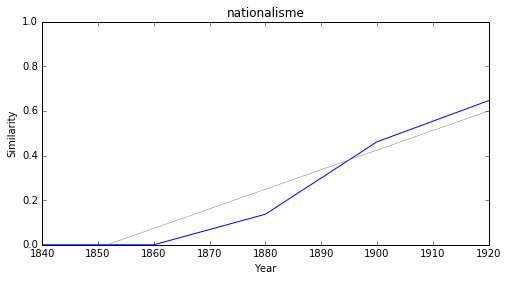

symboliste


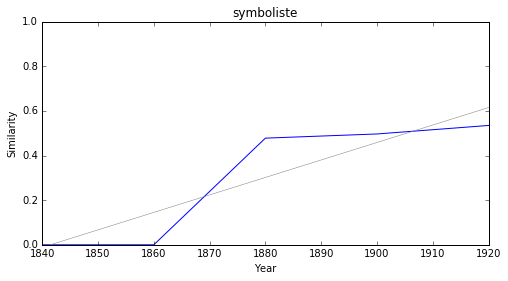

subconscient


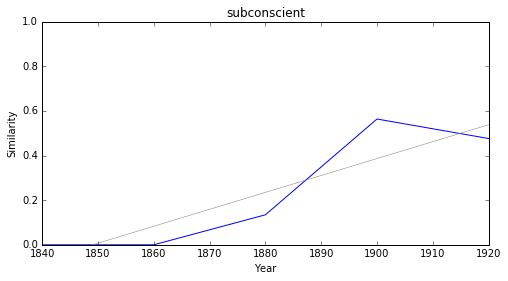

parnassiens


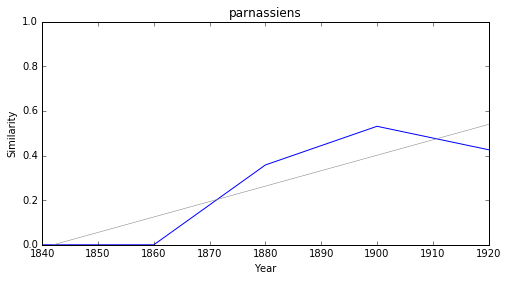

déformation


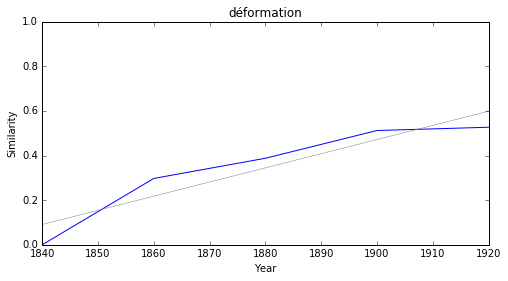

professionnel


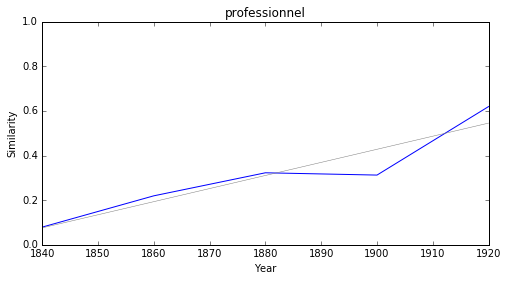

surtout


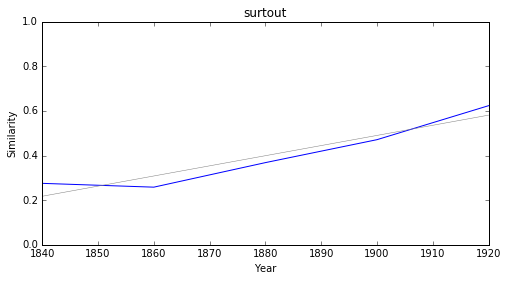

catholique


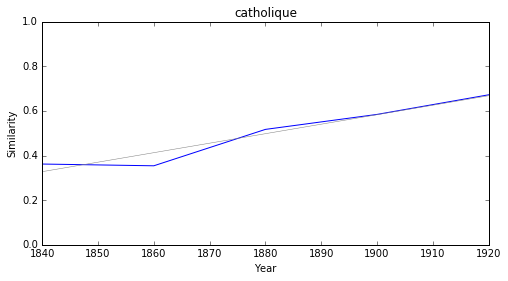

### <i><b>réalisme</i></b>

              token     slope         p
50  traditionalisme  0.011994  0.048885
32     nationalisme  0.011300  0.037242
5      subconscient  0.011163  0.035843
13     sociologique  0.010926  0.012673
14         médiéval  0.010896  0.005821
63    subjectivisme  0.010882  0.006278
51  instrumentation  0.010867  0.006843
46   évolutionniste  0.010796  0.005640
39        moralisme  0.010773  0.004823
29         ethnique  0.010766  0.008599



traditionalisme


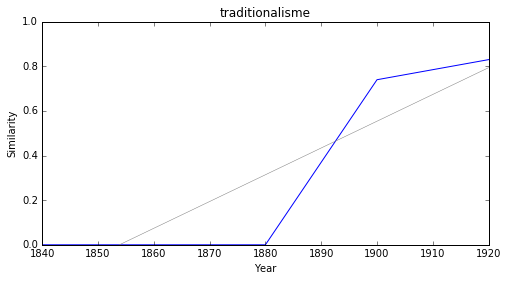

nationalisme


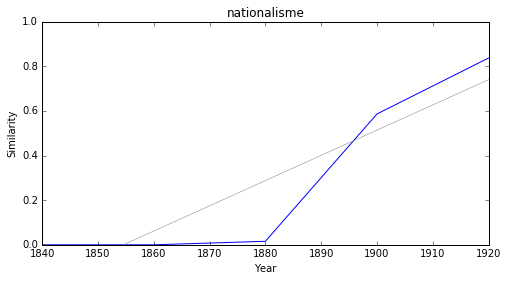

subconscient


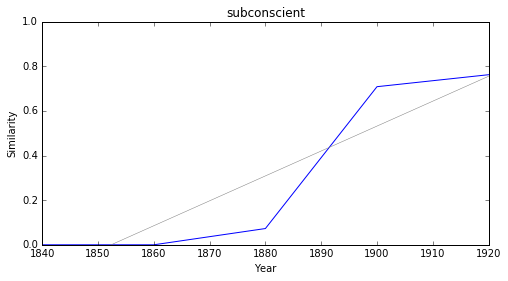

sociologique


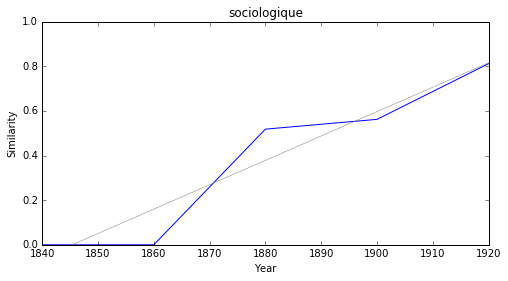

médiéval


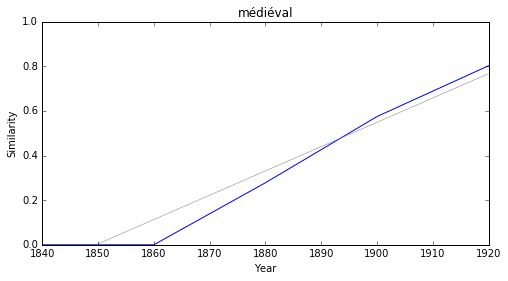

subjectivisme


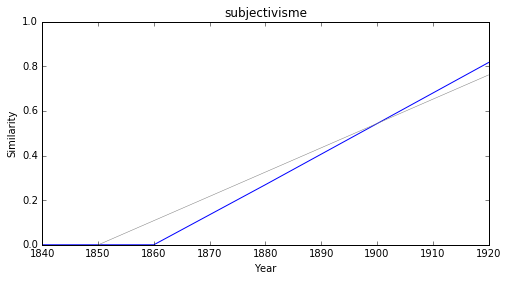

instrumentation


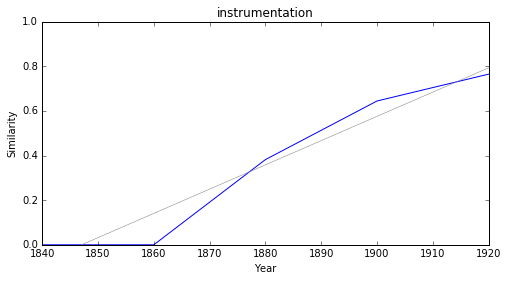

évolutionniste


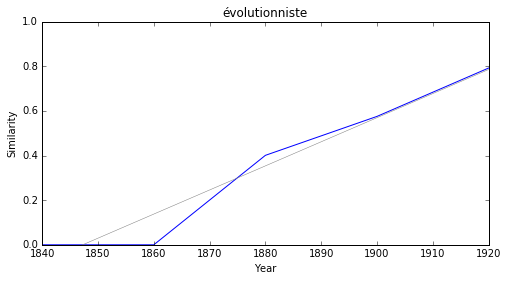

moralisme


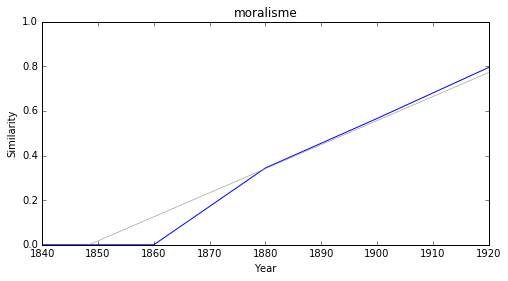

ethnique


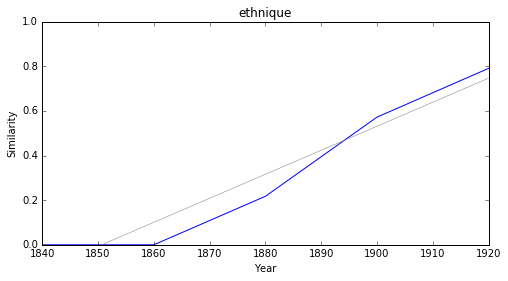

### <i><b>symbolisme</i></b>

              token     slope         p
58             fail  0.010605  0.006520
48  traditionalisme  0.010440  0.046668
29     nationalisme  0.010225  0.032394
32        pacifisme  0.010215  0.045741
15     sociologique  0.010174  0.018754
2       positivisme  0.009913  0.029861
8      subconscient  0.009634  0.049815
46           vêture  0.009557  0.013902
7        qualitatif  0.009490  0.035942
24      parnassiens  0.009296  0.021654



fail


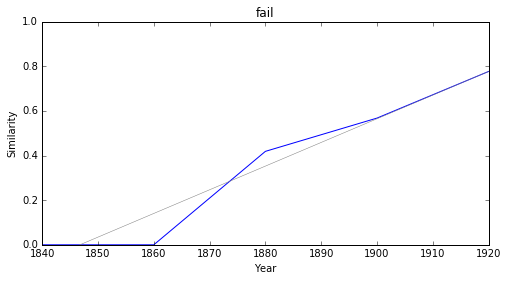

traditionalisme


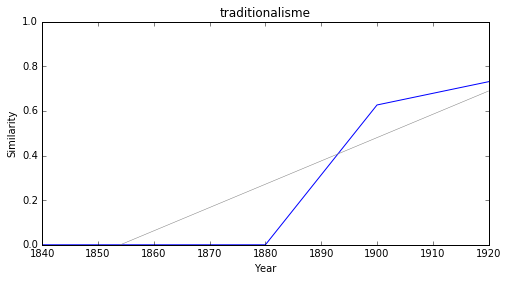

nationalisme


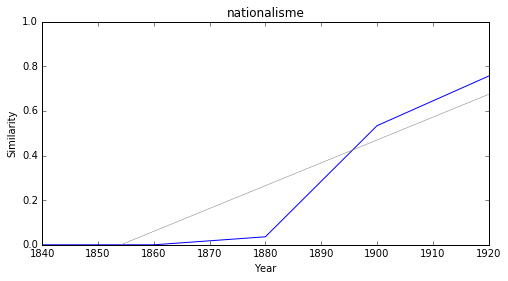

pacifisme


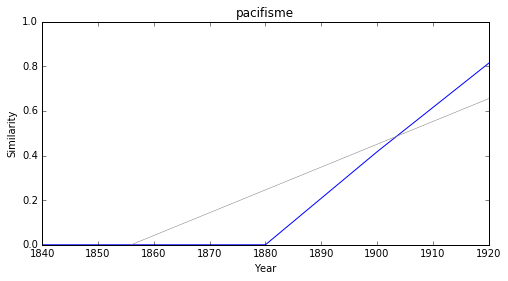

sociologique


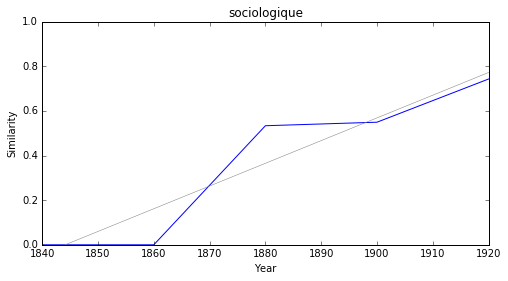

positivisme


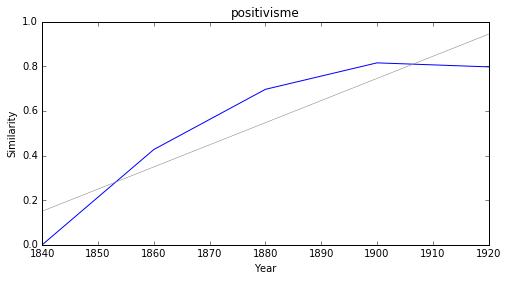

subconscient


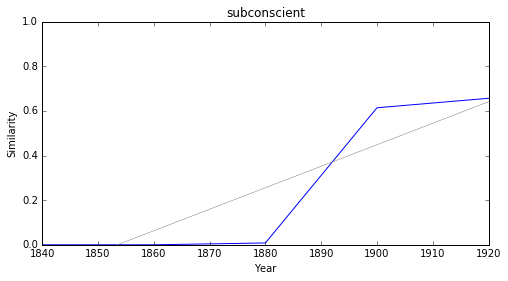

vêture


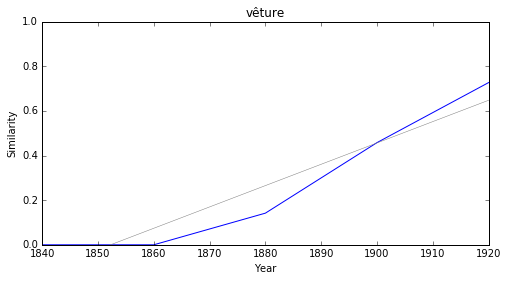

qualitatif


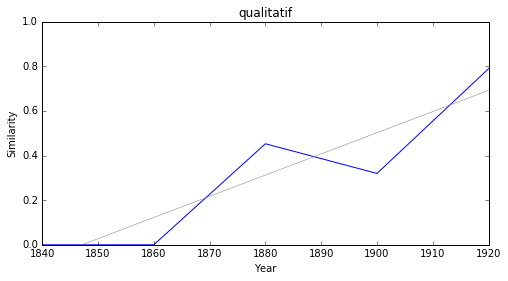

parnassiens


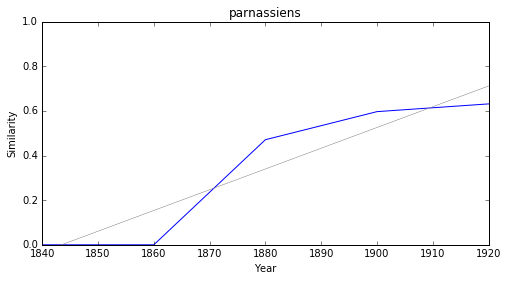

### <i><b>naturalisme</i></b>

              token     slope         p
33  traditionalisme  0.011469  0.041427
5      subconscient  0.011179  0.020818
16     nationalisme  0.011042  0.031501
11      parnassiens  0.011031  0.006847
39          sénégal  0.011029  0.028776
30   évolutionniste  0.010822  0.010046
27     cléricalisme  0.010686  0.035960
8      sociologique  0.010600  0.019431
42    subjectivisme  0.010499  0.007542
13     déclassement  0.010493  0.035596



traditionalisme


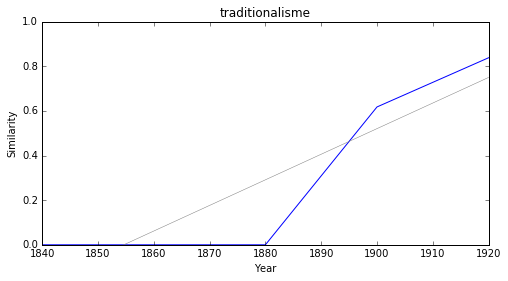

subconscient


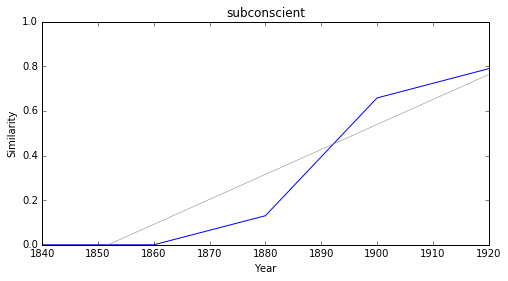

nationalisme


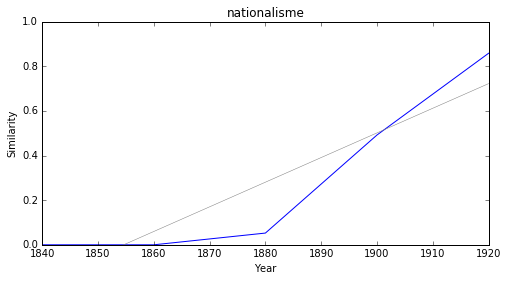

parnassiens


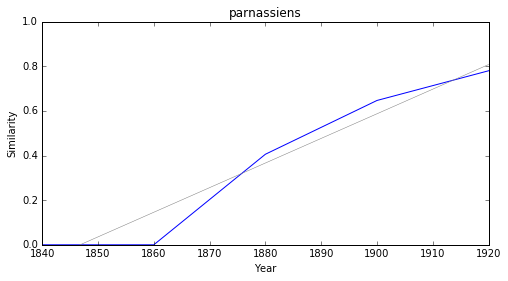

sénégal


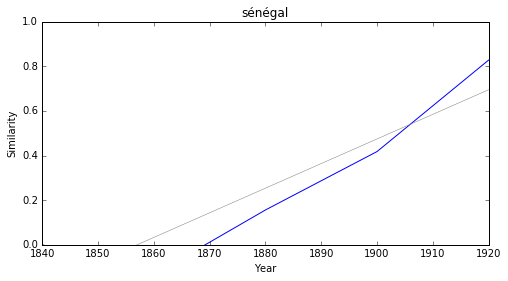

évolutionniste


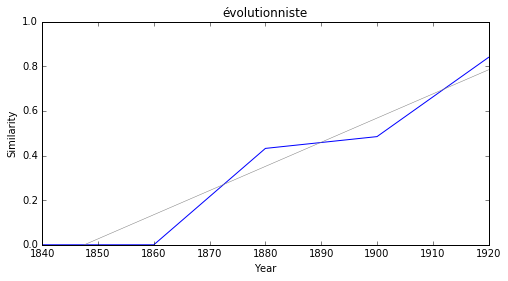

cléricalisme


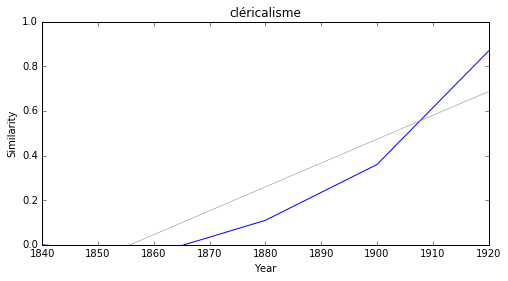

sociologique


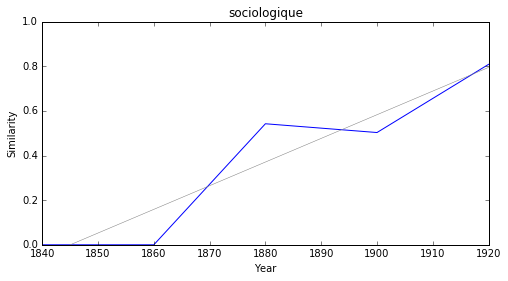

subjectivisme


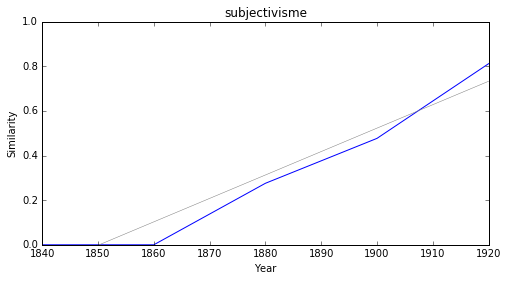

déclassement


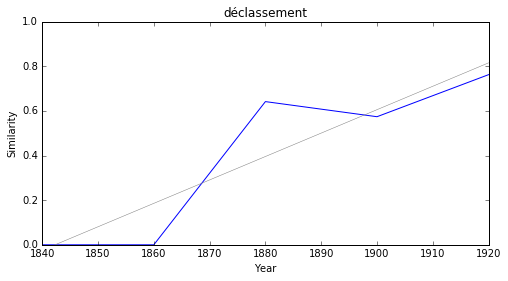

In [75]:
import pandas as pd
from IPython.display import Markdown, display
pd.set_option('display.max_rows', 1000)

for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df1 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df1.sort_values('slope', ascending=False).head(10))
    print('\n\n')
    
    for i, row in df1.sort_values('slope', ascending=False).head(10).iterrows():
        plot_cosine_series(word, row['token'], 8, 4)

# Decreasing

### <i><b>littérature</i></b>

          token     slope         p
41   naturalisé -0.004513  0.042377
34  théologique -0.003168  0.017397
39     barbarie -0.003002  0.020017
7      monument -0.002199  0.010337
26  comparaison -0.002012  0.041023
11         goût -0.001436  0.022249
38      domaine  0.001052  0.005780
27      utilité  0.001188  0.040852
32   prétention  0.001296  0.034148
40        revue  0.001511  0.012991



naturalisé


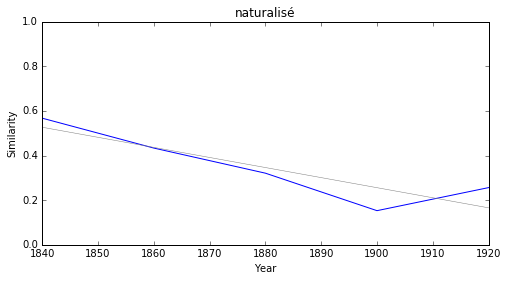

théologique


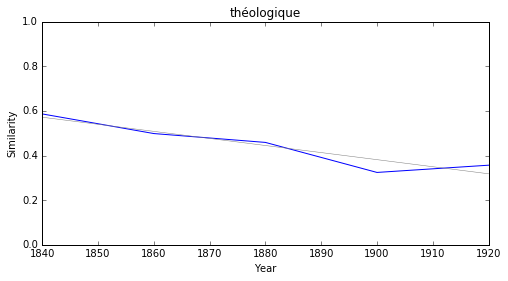

barbarie


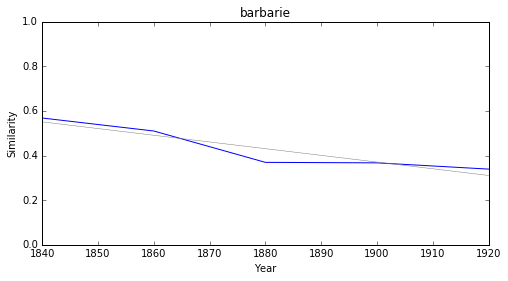

monument


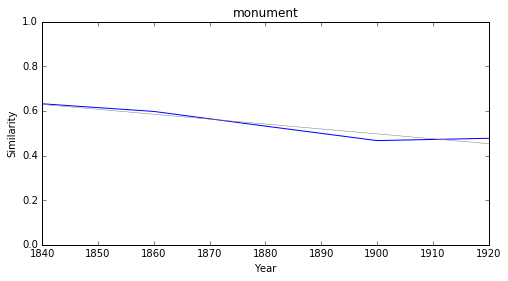

comparaison


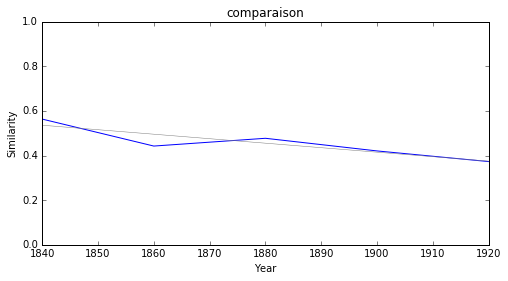

goût


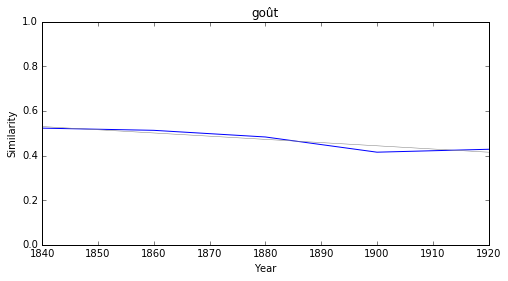

domaine


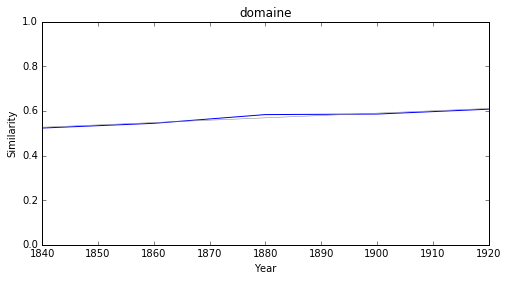

utilité


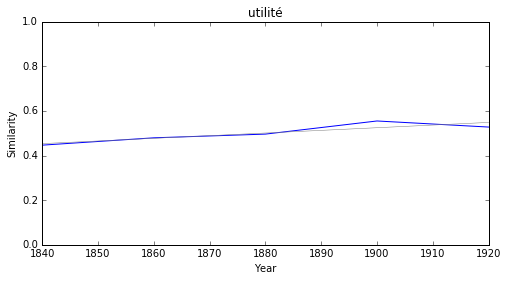

prétention


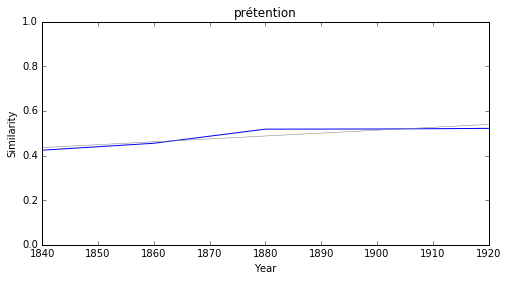

revue


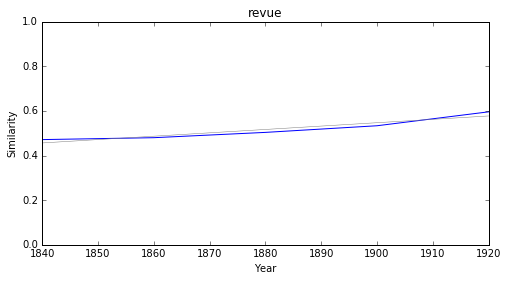

### <i><b>poésie</i></b>

       token     slope         p
16  enjambée -0.007023  0.037809
2      haydn -0.005180  0.046533
34      lied -0.004957  0.039804
40    sonnet -0.003953  0.044455
17  héroïque -0.003859  0.027892
11      naïf -0.003788  0.031220
37    homère -0.003463  0.019579
35       ode -0.003238  0.018120
39  dialecte -0.003125  0.003727
25     grèce -0.002943  0.016600



enjambée


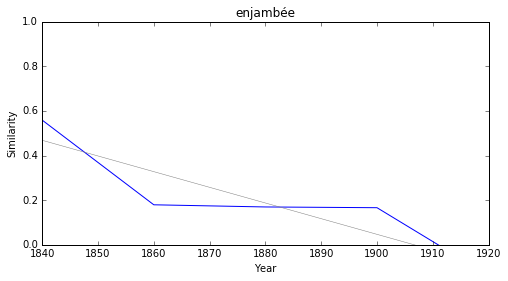

haydn


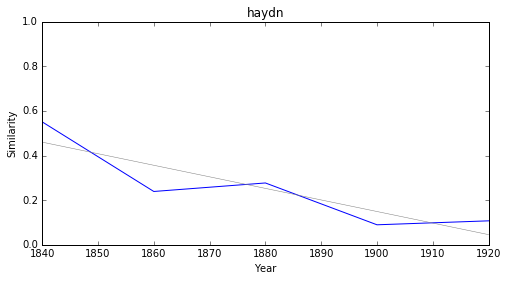

lied


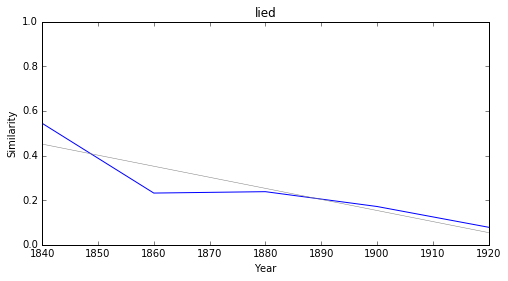

sonnet


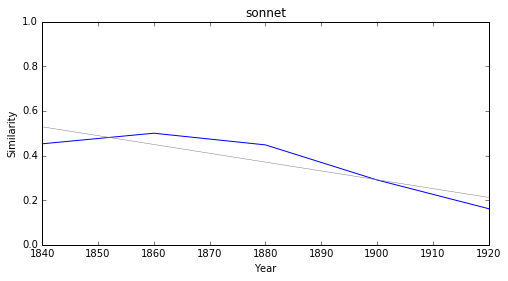

héroïque


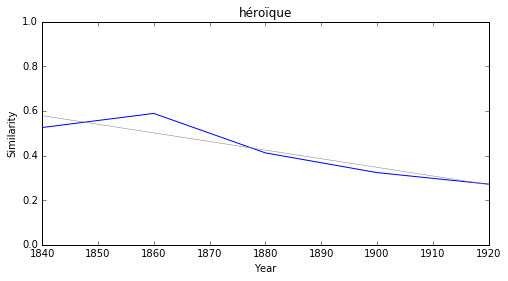

naïf


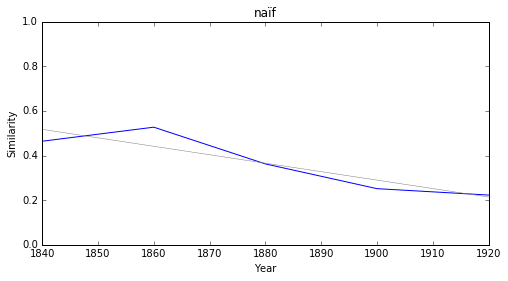

homère


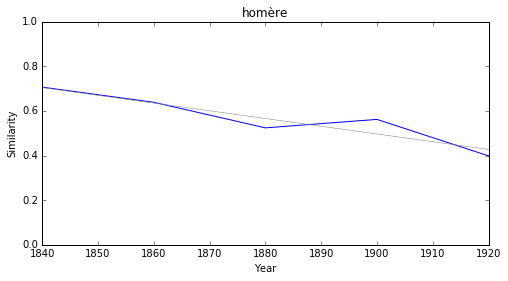

ode


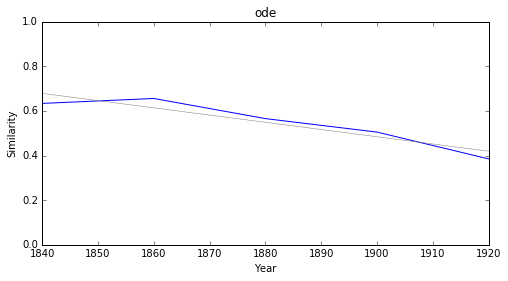

dialecte


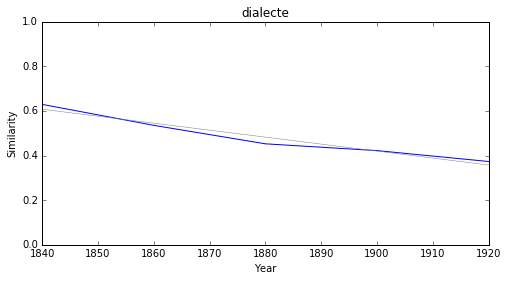

grèce


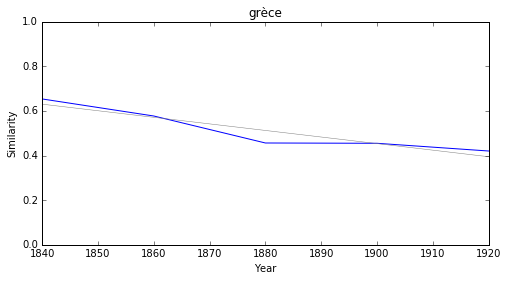

### <i><b>science</i></b>

            token     slope         p
11    comparaison -0.003810  0.036434
14    physiologie -0.002929  0.035389
0   investigation -0.002852  0.025221
8      obligation  0.001207  0.031690
2      esthétique  0.001881  0.014456
18     hiérarchie  0.002097  0.038372
7      convention  0.002538  0.008362
3           thèse  0.003069  0.018877
17     démocratie  0.003162  0.007856
10     artistique  0.003804  0.002656



comparaison


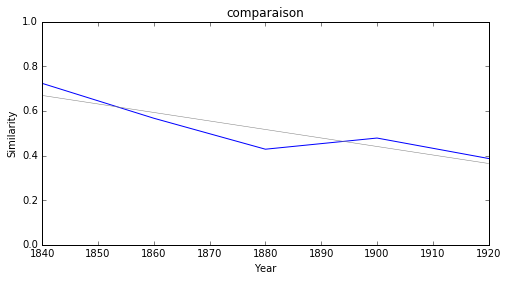

physiologie


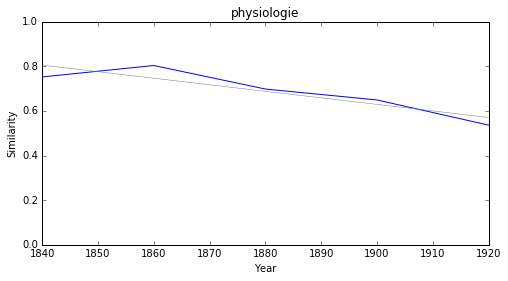

investigation


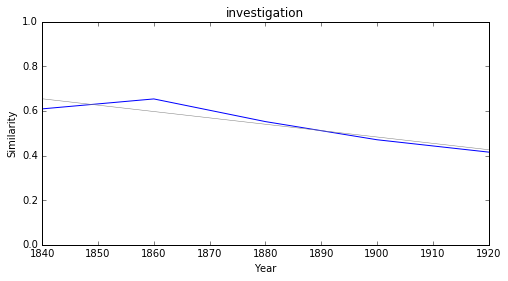

obligation


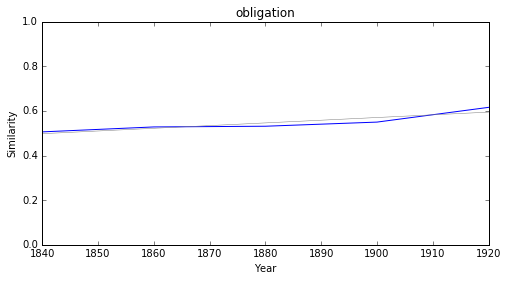

esthétique


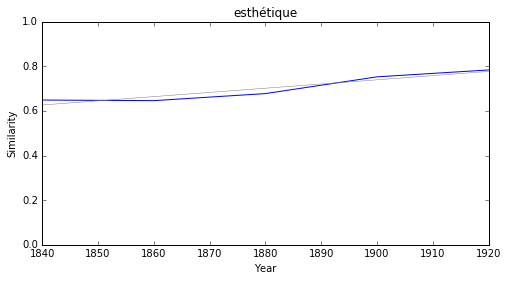

hiérarchie


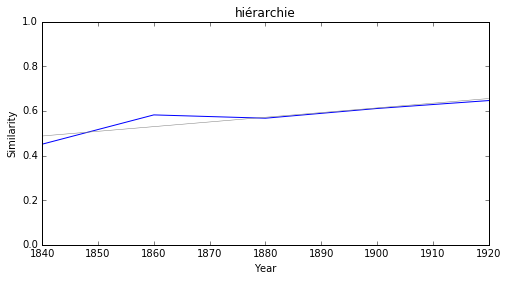

convention


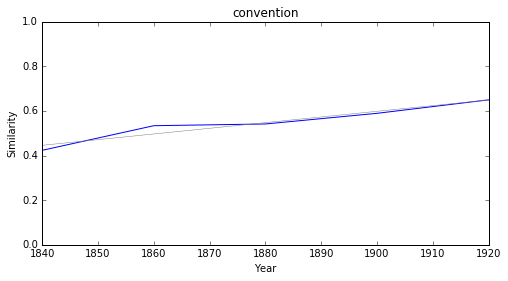

thèse


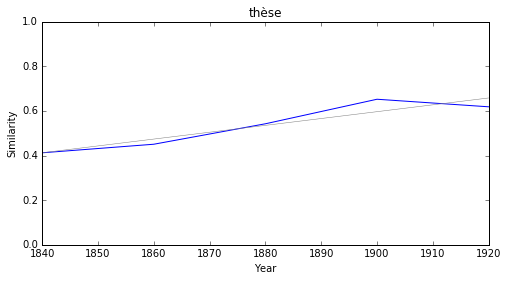

démocratie


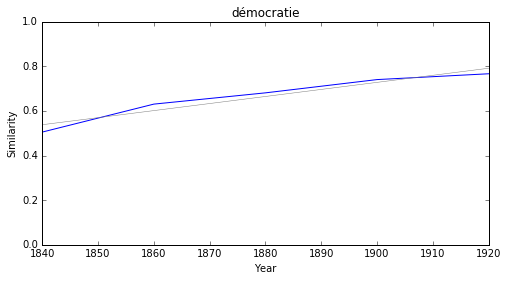

artistique


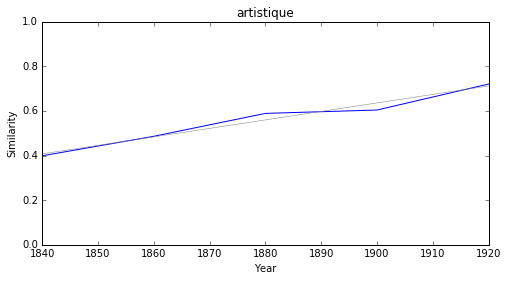

### <i><b>savoir</i></b>

      token     slope         p
1     seoir -0.004003  0.008388
7    vanter -0.001712  0.049584
3    métier  0.001241  0.002480
6     gâter  0.002218  0.028621
2   railler  0.002230  0.022109
0     gêner  0.002809  0.002437
8  détester  0.002874  0.016979
5    risque  0.004404  0.043395
4     viser  0.004455  0.019309
9  pâtisser  0.006054  0.028294



seoir


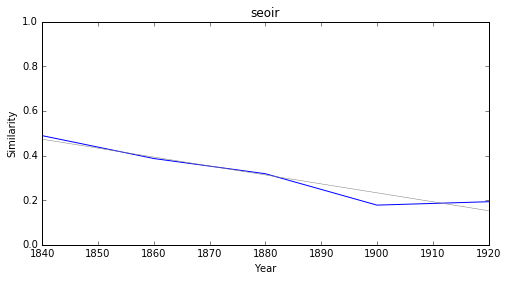

vanter


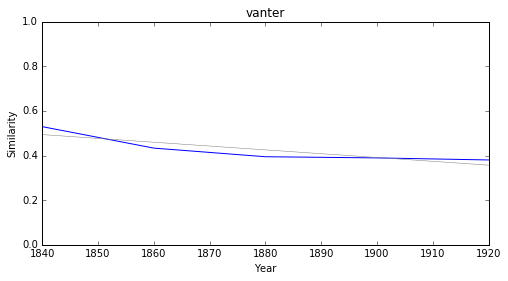

métier


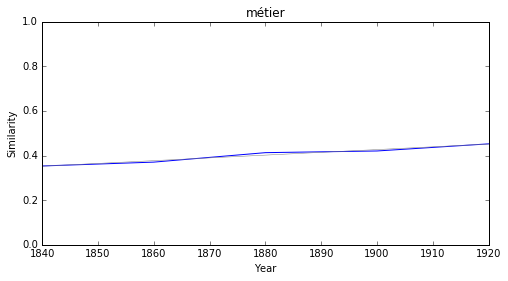

gâter


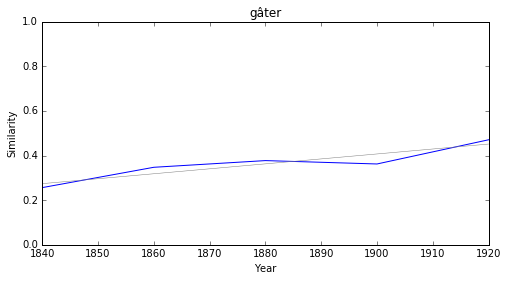

railler


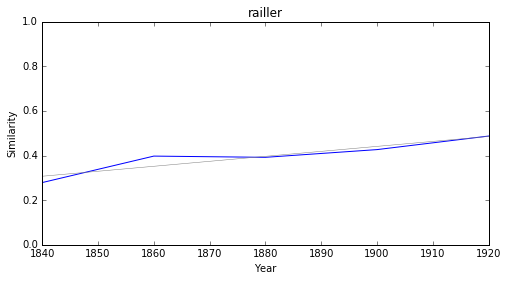

gêner


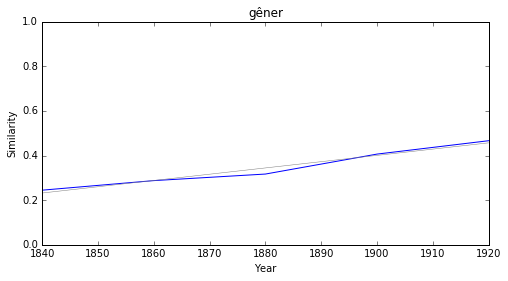

détester


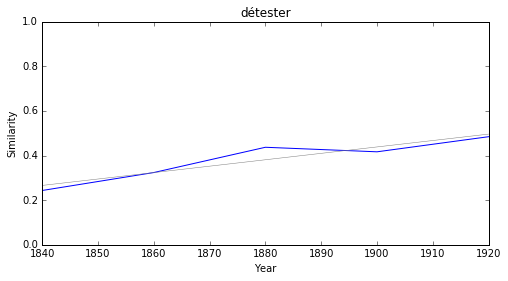

risque


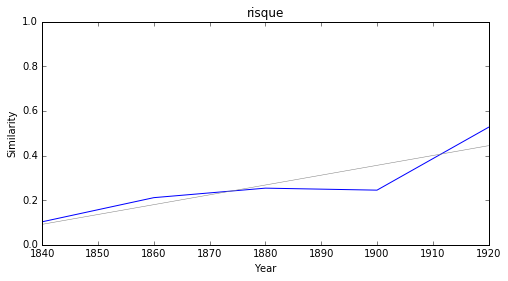

viser


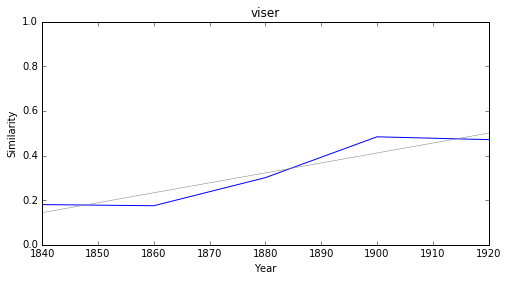

pâtisser


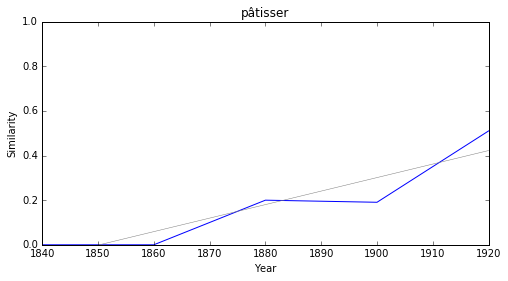

### <i><b>histoire</i></b>

               token     slope         p
18     métempsychose -0.007343  0.016137
8   particulièrement -0.003846  0.026504
13     physiologique -0.003507  0.039481
23       théologique -0.002930  0.045661
6           zoologie -0.002909  0.034656
22          religion  0.001345  0.038461
2            légende  0.001947  0.013143
10           culture  0.002186  0.011003
5             france  0.002220  0.035565
21        artistique  0.002455  0.043558



métempsychose


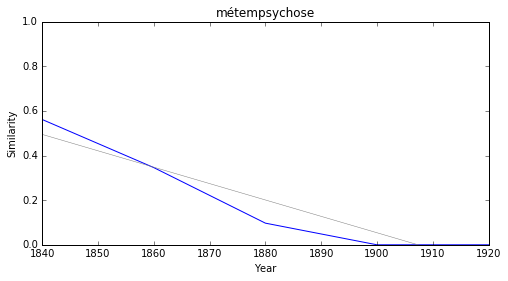

particulièrement


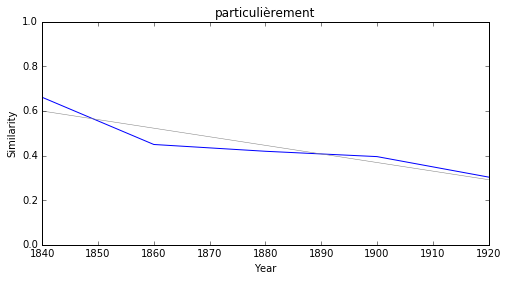

physiologique


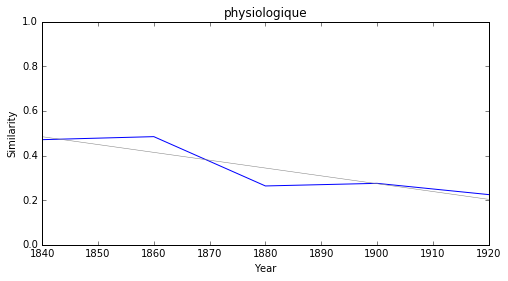

théologique


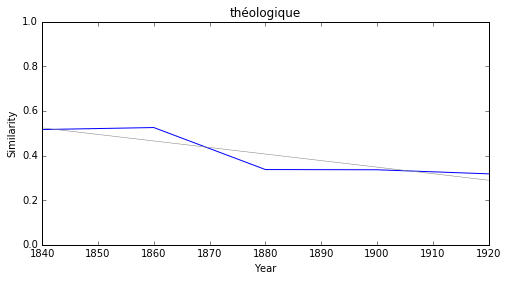

zoologie


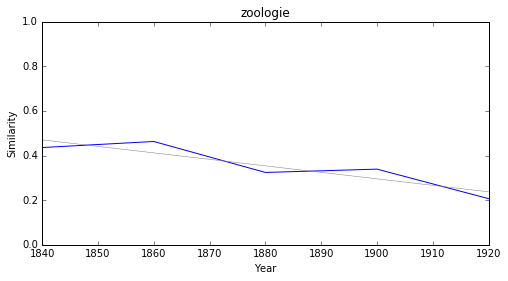

religion


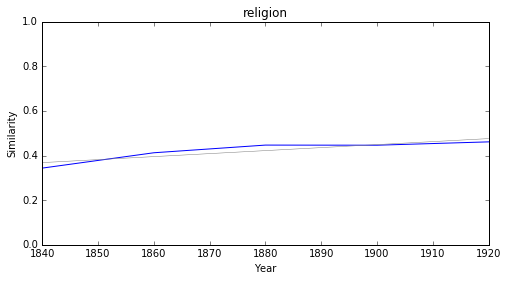

légende


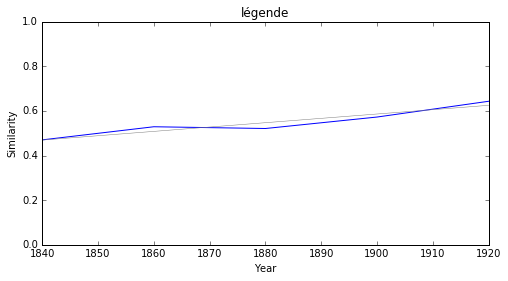

culture


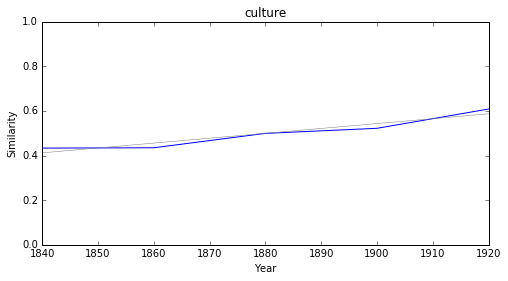

france


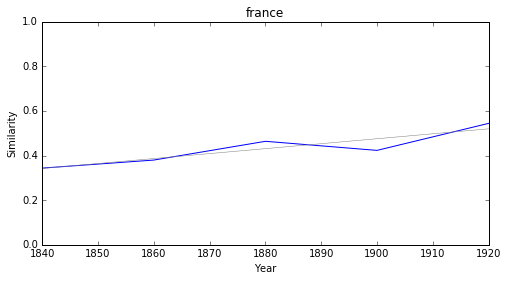

artistique


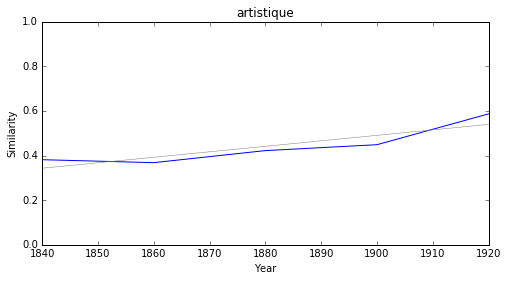

### <i><b>philosophie</i></b>

            token     slope         p
28   morcellement -0.004171  0.040000
19    comparaison -0.003513  0.028931
11  physiologique -0.003233  0.036825
21         nature -0.002983  0.024753
2   investigation -0.002964  0.010167
25   souveraineté -0.002846  0.001365
29      tolérance -0.001984  0.017291
22         vérité -0.001719  0.047640
8       rationnel -0.001695  0.023396
5      esthétique  0.001531  0.031395



morcellement


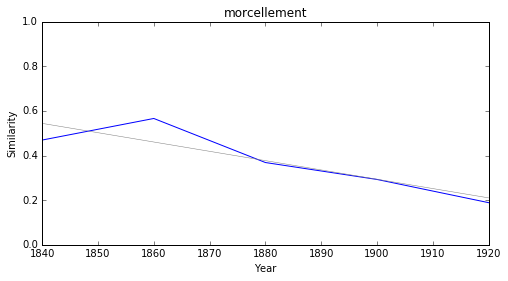

comparaison


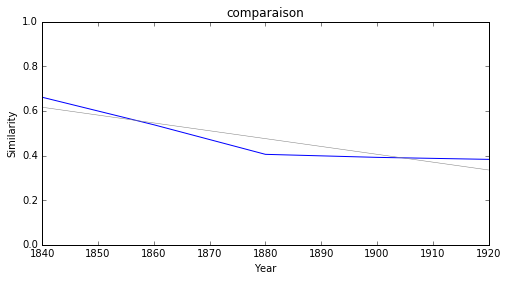

physiologique


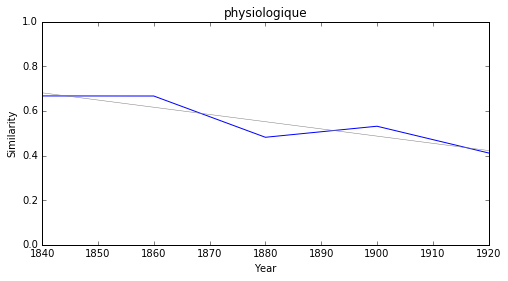

nature


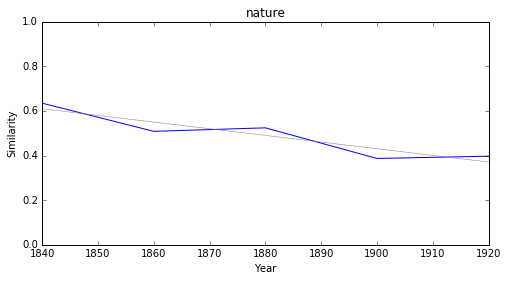

investigation


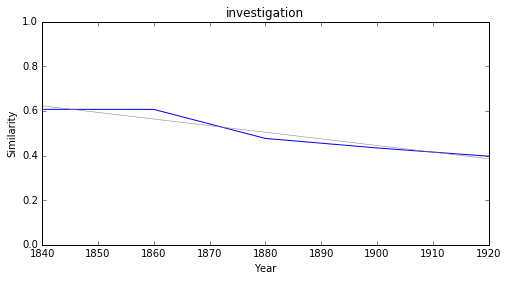

souveraineté


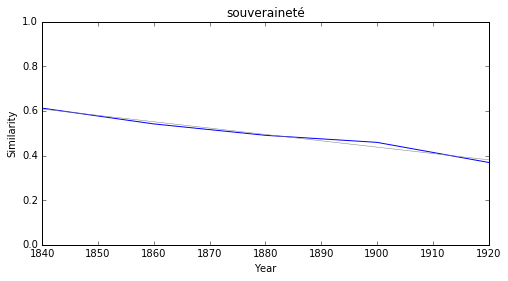

tolérance


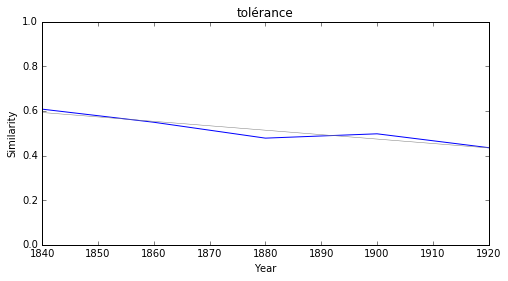

vérité


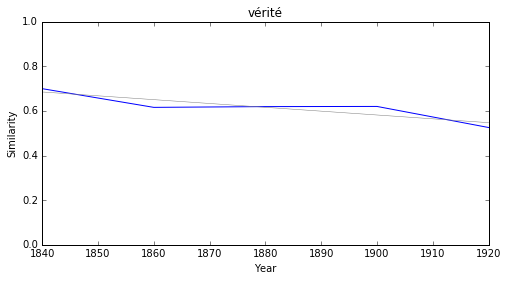

rationnel


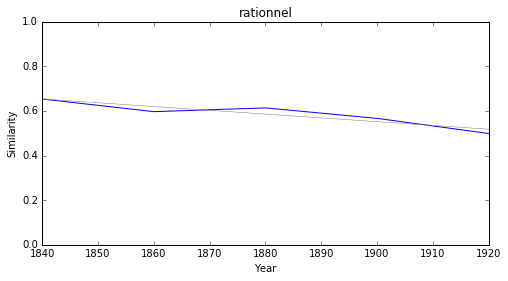

esthétique


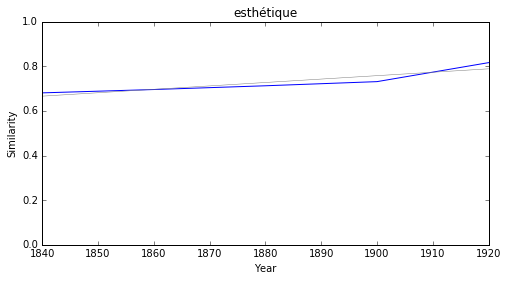

### <i><b>lettre</i></b>

          token     slope         p
22      épernon -0.007224  0.004996
17     argental -0.005124  0.044331
13      bouhier -0.004859  0.026782
16       denise -0.004003  0.044633
24   compliment -0.002762  0.005779
5   ambassadeur -0.001978  0.006100
1       insérer -0.001806  0.008851
4    confession  0.001169  0.044680
3         texte  0.001204  0.031444
19       notice  0.001274  0.010345



épernon


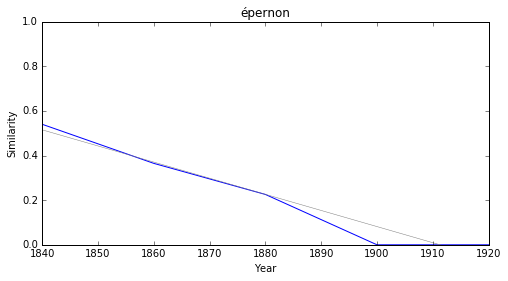

argental


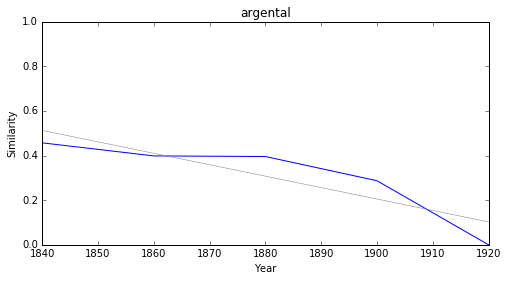

bouhier


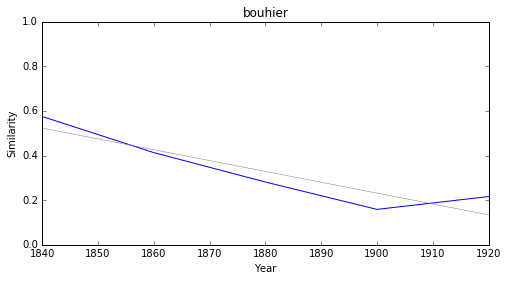

denise


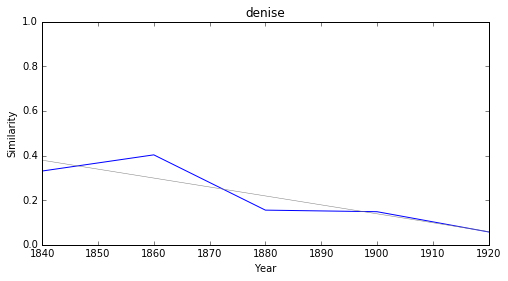

compliment


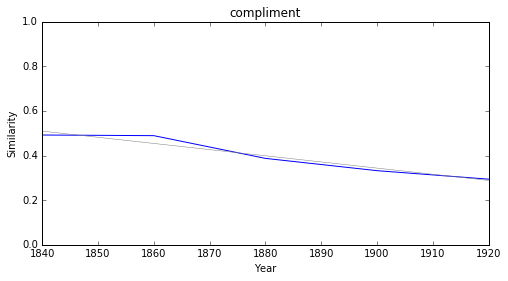

ambassadeur


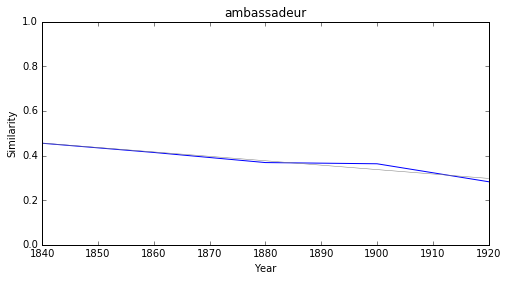

insérer


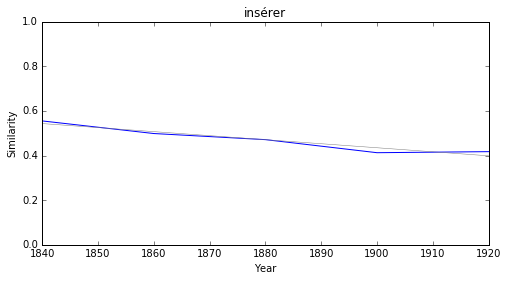

confession


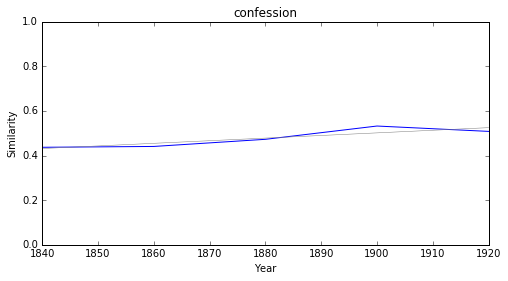

texte


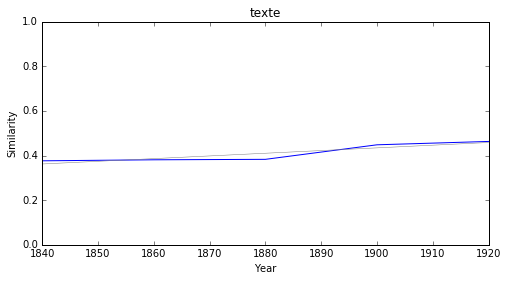

notice


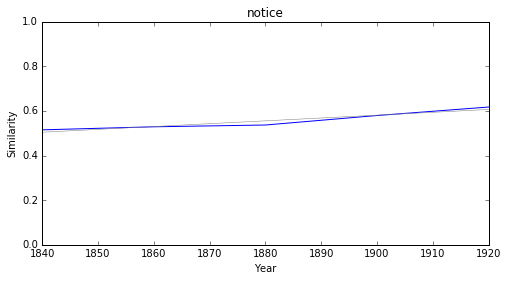

### <i><b>critique</i></b>

            token     slope         p
12  physiologique -0.005056  0.013300
24    théologique -0.004009  0.024551
7       induction -0.003832  0.001674
13    spéculation -0.003820  0.023682
26    physiologie -0.003745  0.028975
33      recherche -0.003251  0.043106
25         examen -0.003033  0.009406
29    commentaire -0.002482  0.039274
2         sérieux -0.002361  0.003426
16        positif -0.002151  0.045553



physiologique


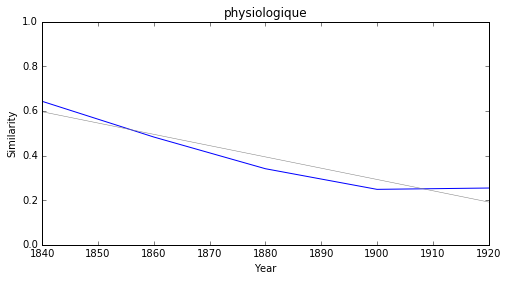

théologique


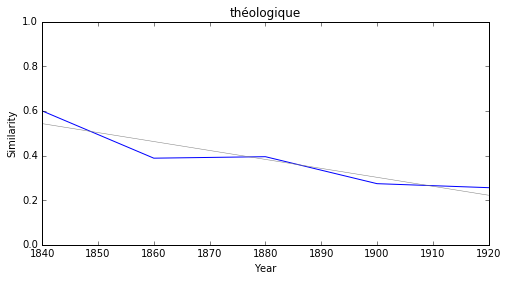

induction


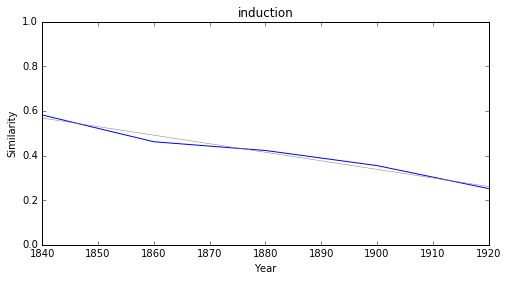

spéculation


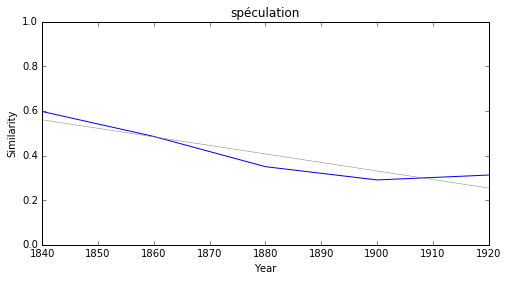

physiologie


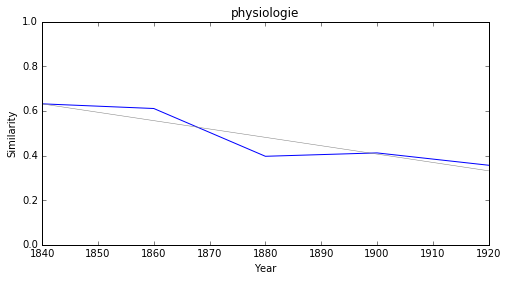

recherche


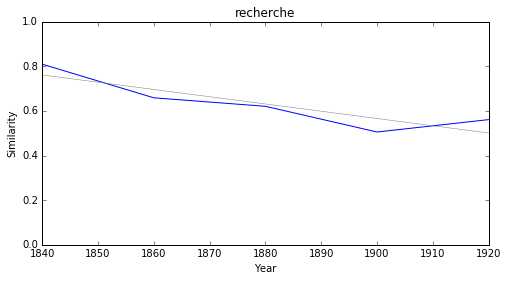

examen


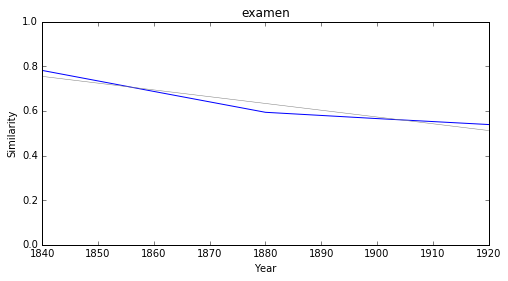

commentaire


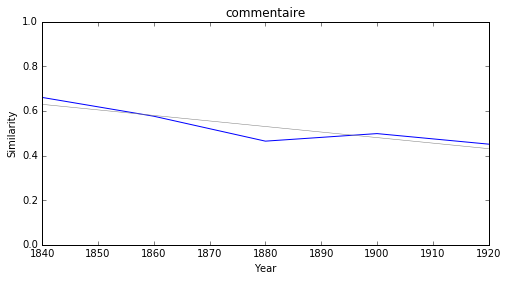

sérieux


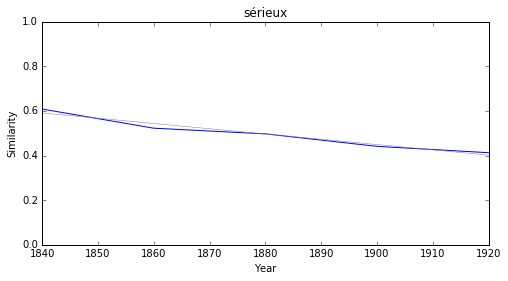

positif


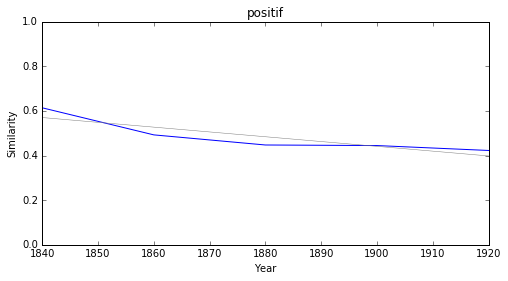

### <i><b>roman</i></b>

          token     slope         p
10     llorente -0.007121  0.037640
20         ixer -0.007012  0.025114
22   shakspeare -0.005352  0.002550
1      hérodote -0.005334  0.024334
26     exceller -0.004134  0.024997
12      chanson -0.003520  0.045067
18   traducteur -0.003412  0.004734
8       musique -0.003026  0.032464
24  commentaire -0.002987  0.018158
13        bible -0.002926  0.043043



llorente


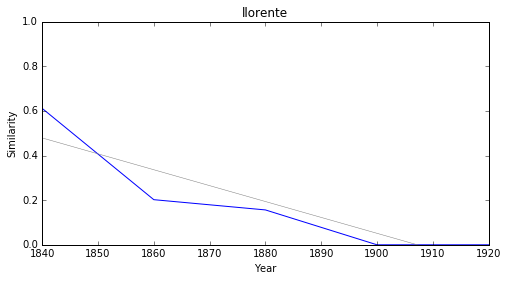

ixer


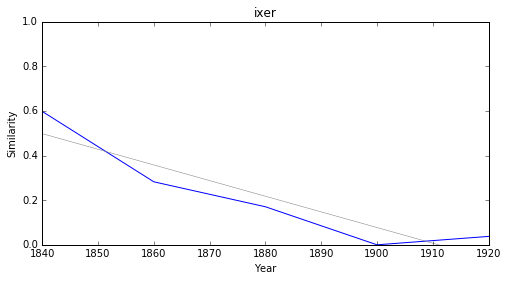

shakspeare


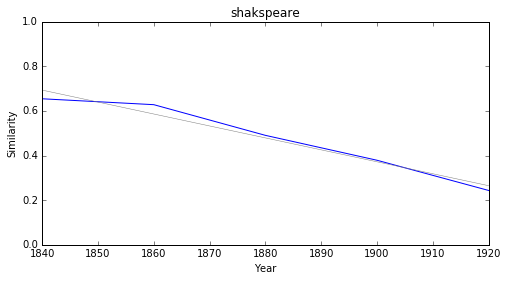

hérodote


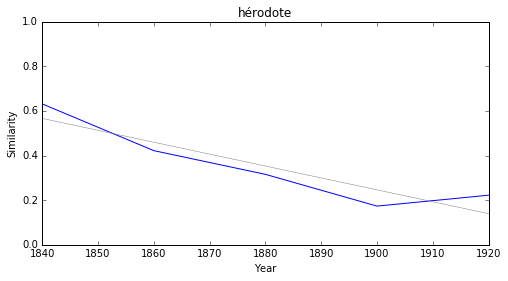

exceller


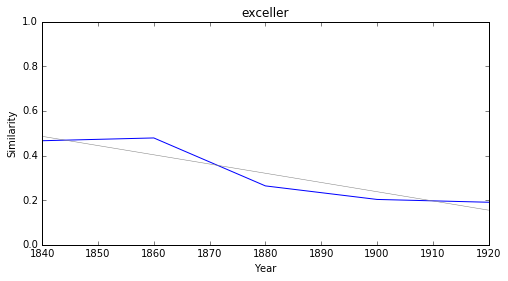

chanson


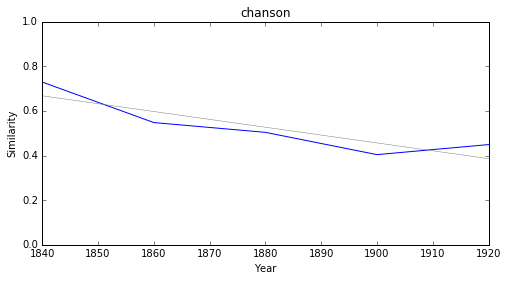

traducteur


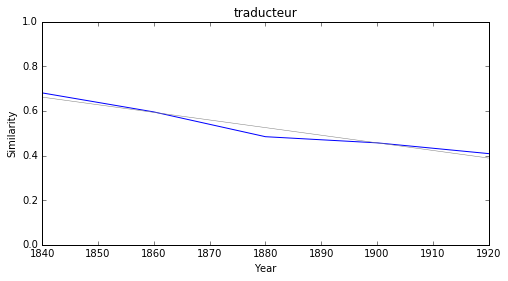

musique


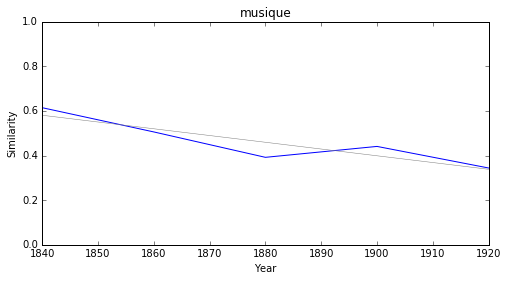

commentaire


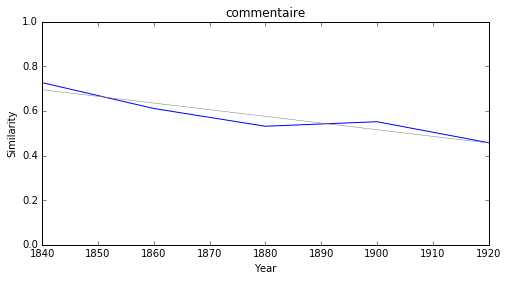

bible


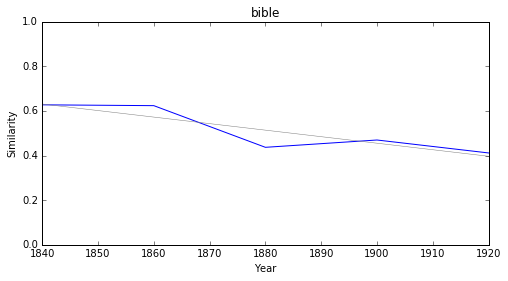

### <i><b>théâtre</i></b>

         token     slope         p
11     collége -0.008214  0.007756
12      collet -0.007140  0.012926
21        cuba -0.005920  0.039880
8     aspirant -0.005050  0.031587
19     recette -0.004788  0.019365
16      crédit -0.003879  0.025941
9       ballet -0.002711  0.024230
4      tribune -0.002194  0.044575
0   conférence -0.001302  0.010824
22     lecteur  0.000856  0.043444



collége


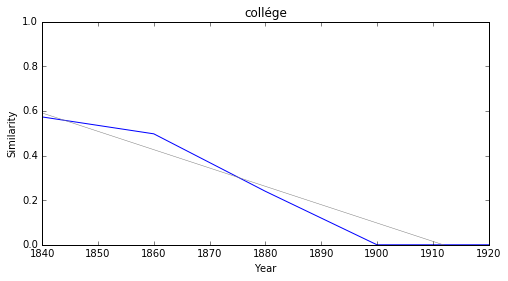

collet


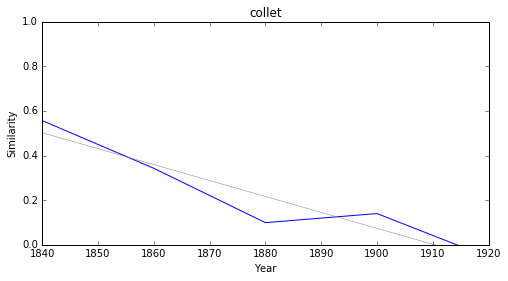

cuba


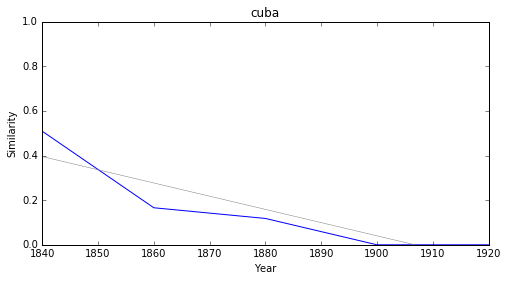

aspirant


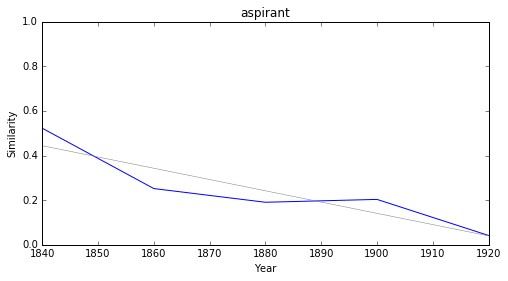

recette


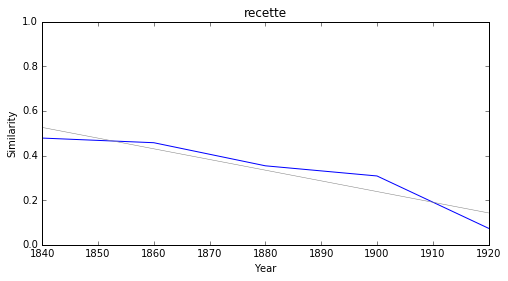

crédit


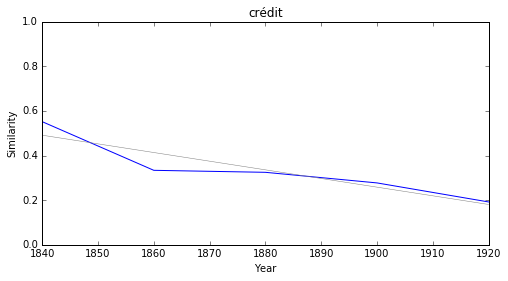

ballet


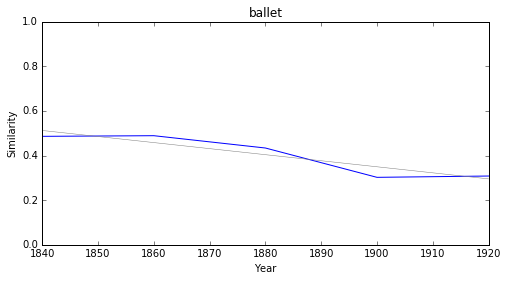

tribune


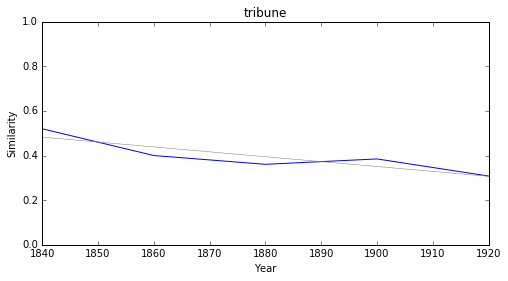

conférence


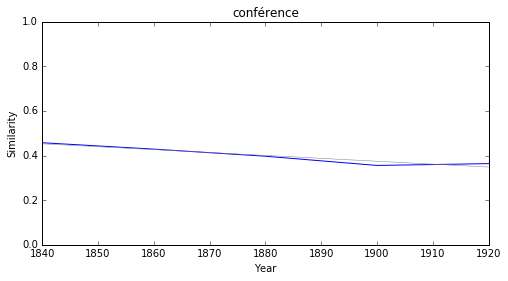

lecteur


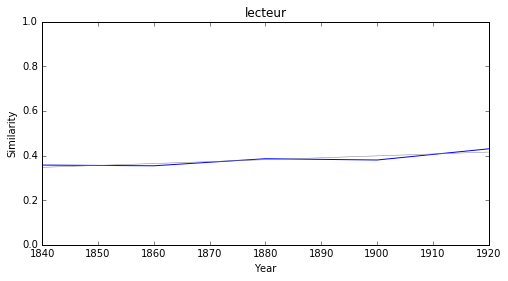

### <i><b>drame</i></b>

          token     slope         p
23         lied -0.007286  0.020742
14       élégie -0.005012  0.049936
21    appendice -0.004994  0.027739
13       idylle -0.004842  0.021330
12   traducteur -0.004648  0.048630
16   shakspeare -0.004188  0.012386
25       sonnet -0.004004  0.044520
11     pamphlet -0.003996  0.030701
17  commentaire -0.003675  0.022205
6        iliade -0.003211  0.034849



lied


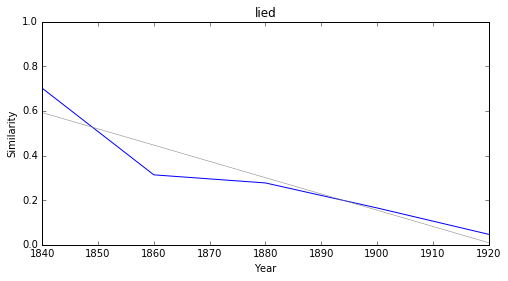

élégie


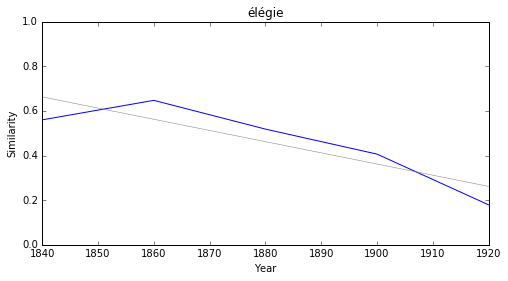

appendice


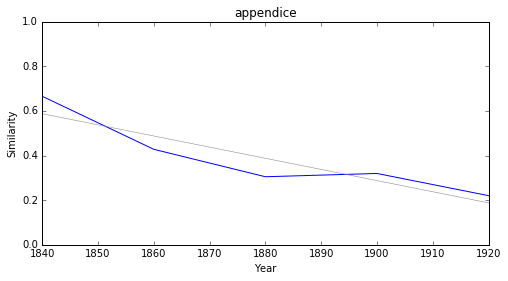

idylle


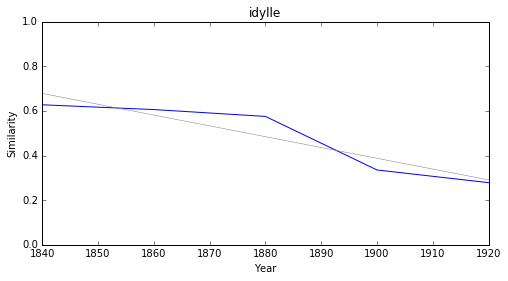

traducteur


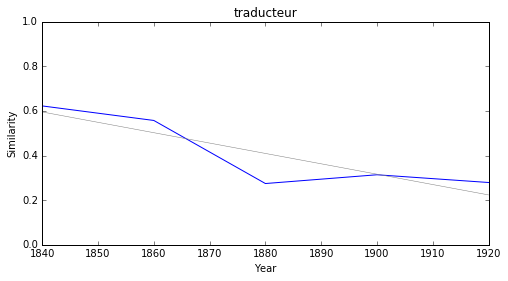

shakspeare


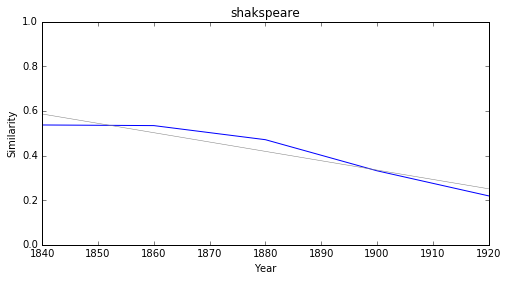

sonnet


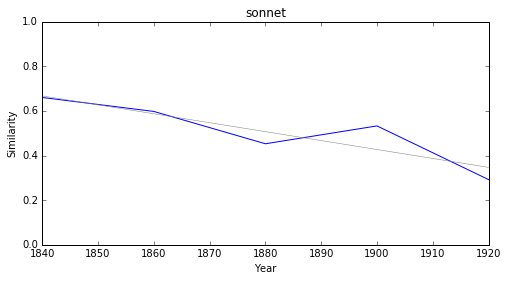

pamphlet


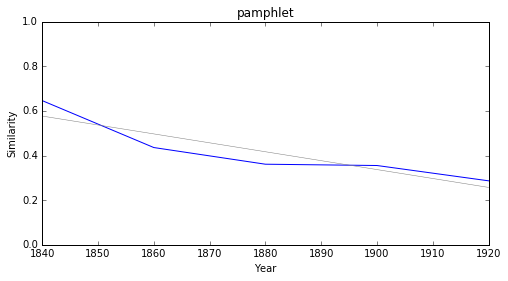

commentaire


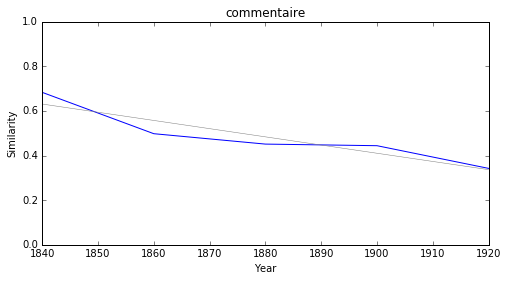

iliade


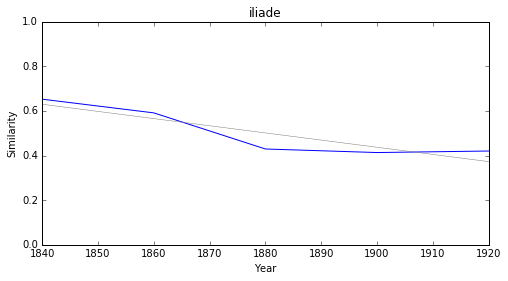

### <i><b>esprit</i></b>

            token     slope         p
10        société -0.002887  0.042811
24           tact -0.002631  0.028925
4       sceptique -0.001554  0.046144
18    scepticisme  0.001207  0.049742
12         ironie  0.001597  0.017912
21     démocratie  0.001761  0.001990
22     compétence  0.001803  0.021943
17  individualité  0.002130  0.036093
20        égoïsme  0.002371  0.007172
1    désintéressé  0.002454  0.049360



société


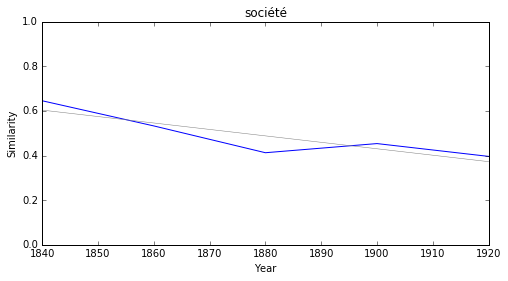

tact


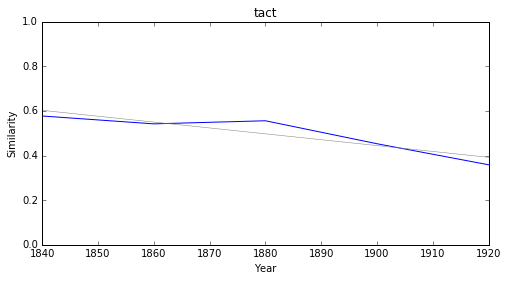

sceptique


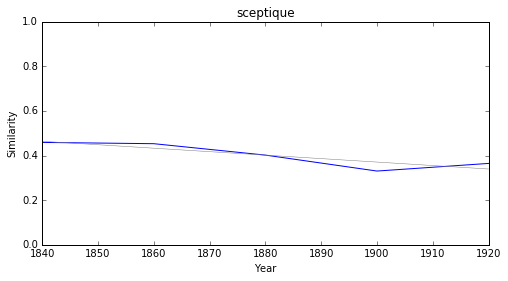

scepticisme


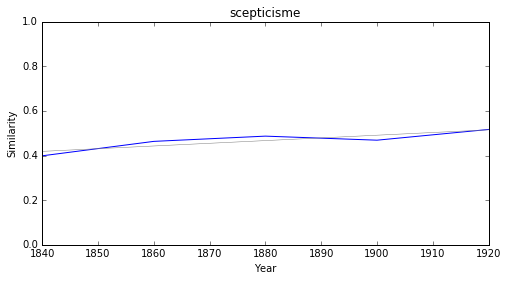

ironie


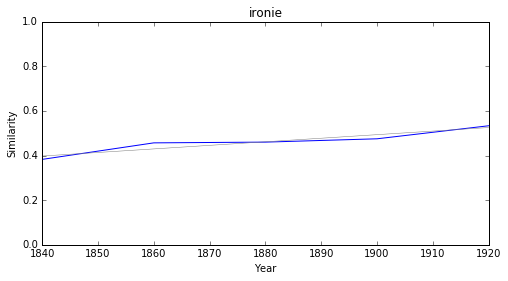

démocratie


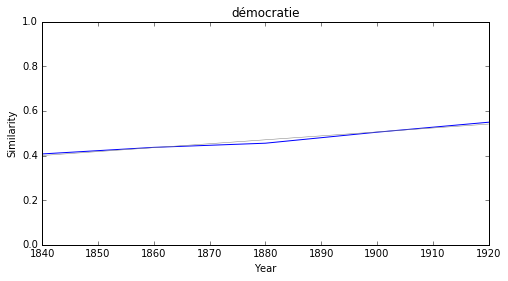

compétence


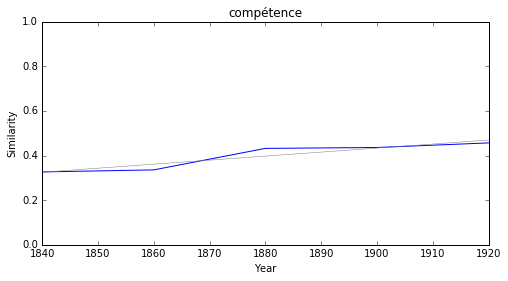

individualité


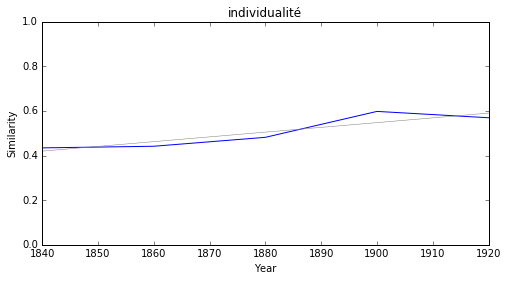

égoïsme


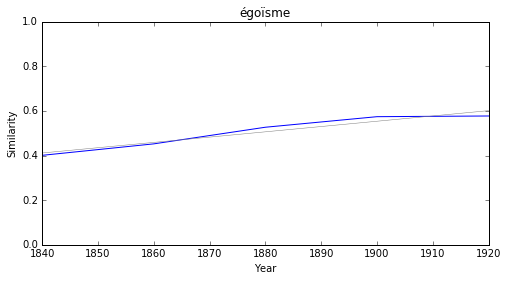

désintéressé


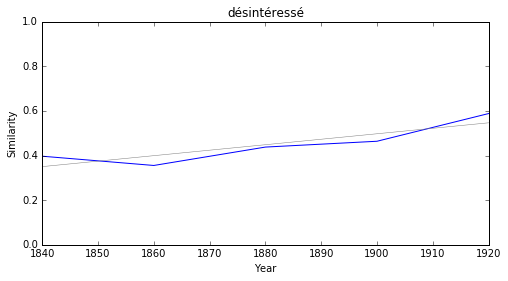

### <i><b>langue</i></b>

            token     slope         p
19         nature -0.004499  0.045199
24       locution -0.004399  0.004450
26      sémitique -0.004227  0.001251
27       barbarie -0.003829  0.012912
5        primitif -0.003528  0.002180
14    comparaison -0.003310  0.047108
15      structure -0.003252  0.013439
0   investigation -0.003225  0.040426
6        celtique -0.003082  0.001002
7      étymologie -0.002977  0.018637



nature


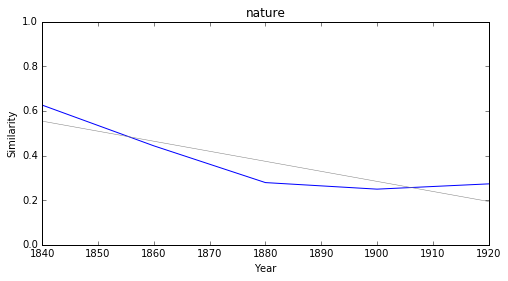

locution


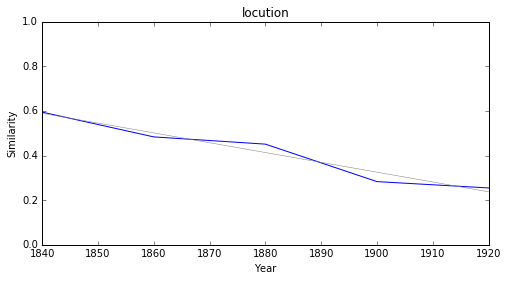

sémitique


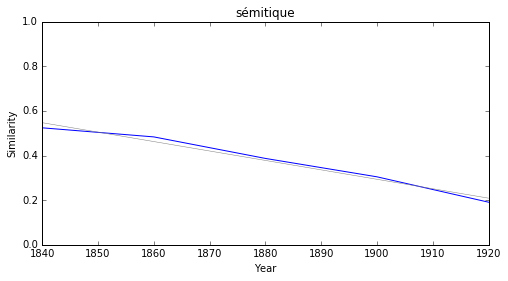

barbarie


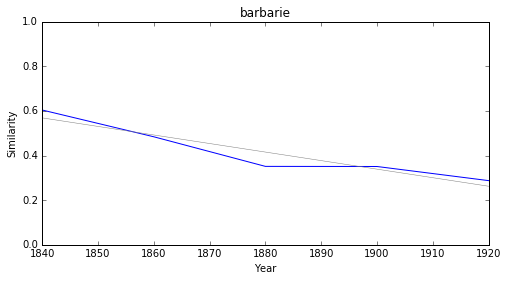

primitif


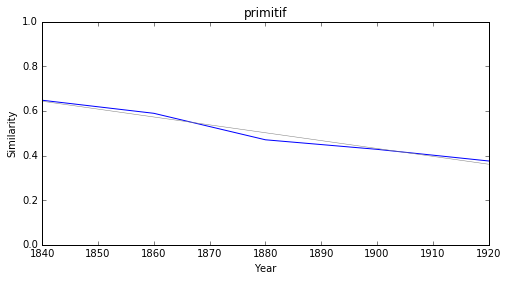

comparaison


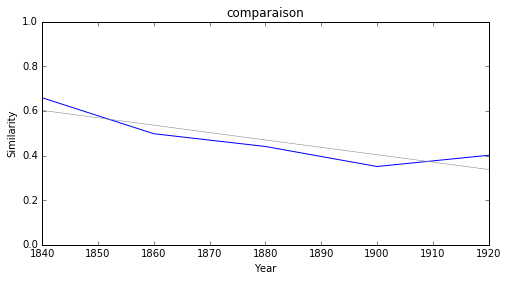

structure


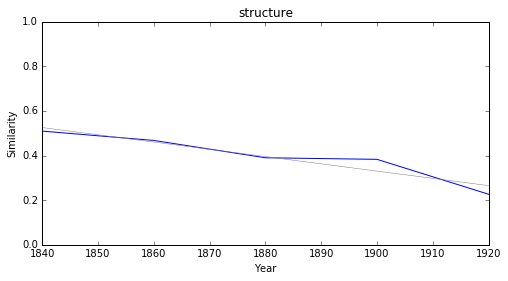

investigation


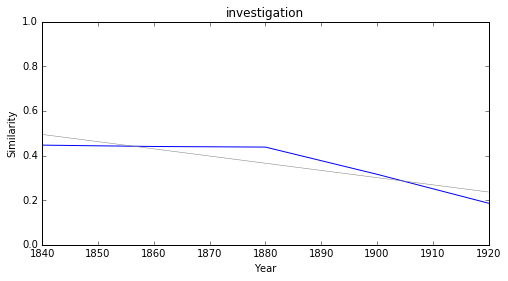

celtique


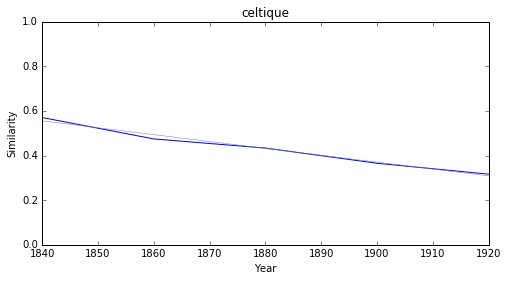

étymologie


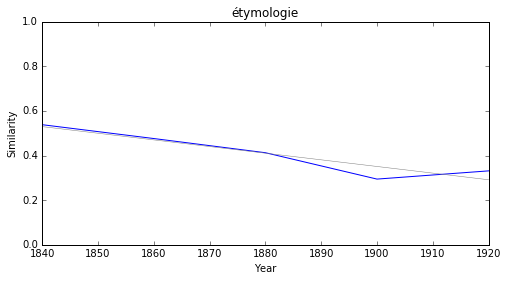

### <i><b>diplomatie</i></b>

            token     slope         p
35     euphonique -0.010949  0.012709
40      décoction -0.010695  0.024864
28       cauchois -0.010668  0.020090
60        magenta -0.010473  0.036346
18    convocation -0.005982  0.028801
42     université -0.004525  0.006103
62          ecole -0.002843  0.002717
10    corporation -0.002401  0.035002
33  prépondérance -0.002369  0.045473
69       alphabet -0.002246  0.031227



euphonique


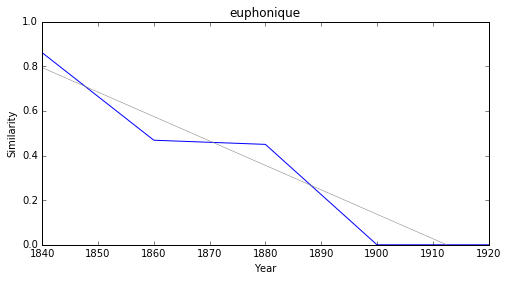

décoction


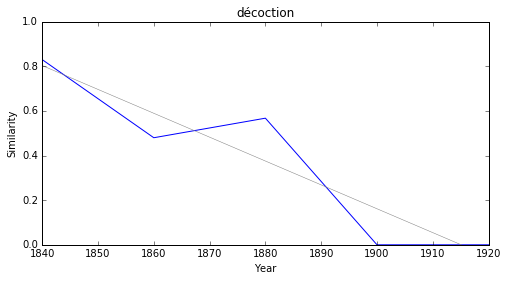

cauchois


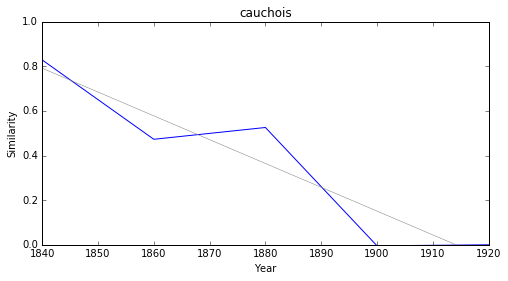

magenta


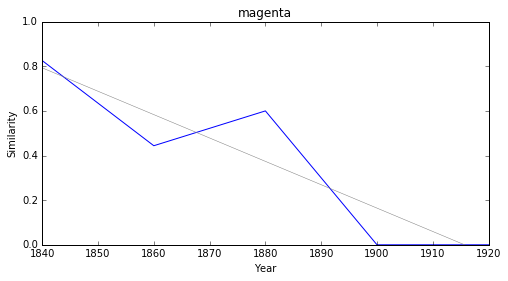

convocation


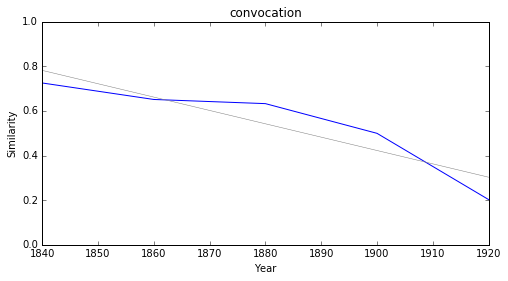

université


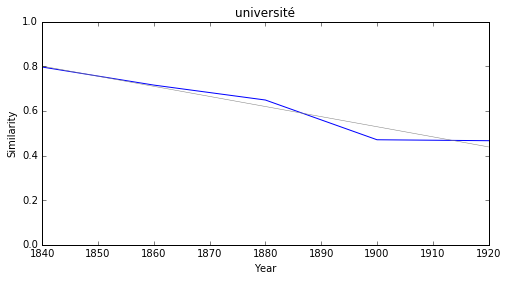

ecole


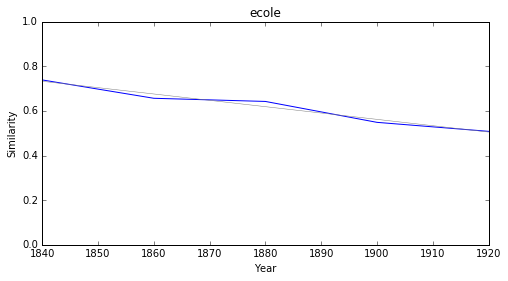

corporation


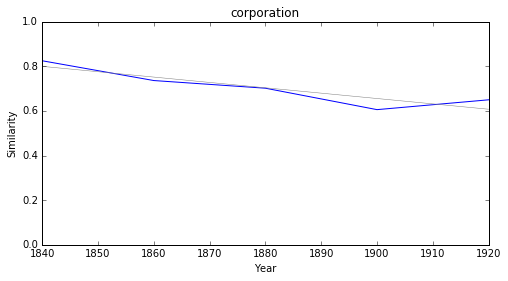

prépondérance


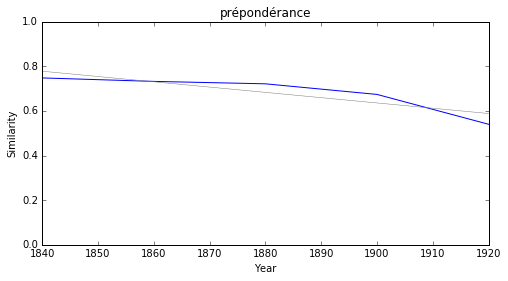

alphabet


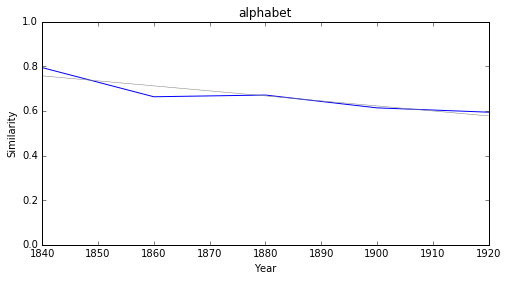

### <i><b>politique</i></b>

               token     slope         p
4            scinder -0.006702  0.034417
9       théocratique -0.006369  0.021497
23      souveraineté -0.003989  0.006947
27         tolérance -0.002956  0.030583
15      intervention -0.002660  0.036789
0         profession -0.002536  0.003759
3            préjugé -0.002426  0.022423
16  affranchissement -0.002301  0.036648
6        association -0.001799  0.011172
26           royauté -0.001454  0.027625



scinder


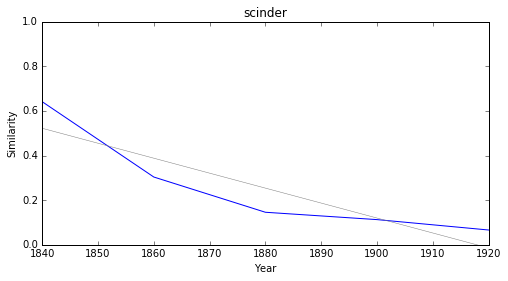

théocratique


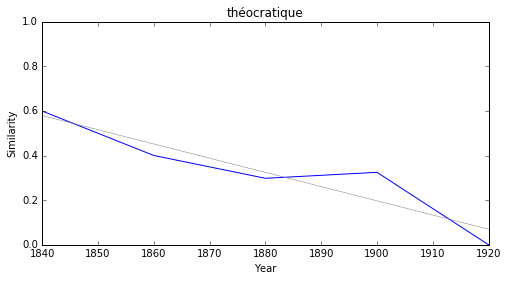

souveraineté


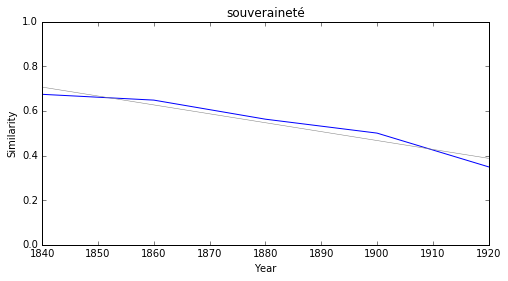

tolérance


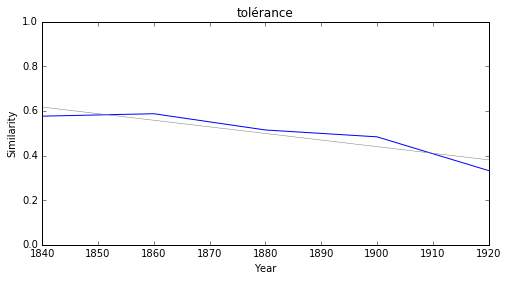

intervention


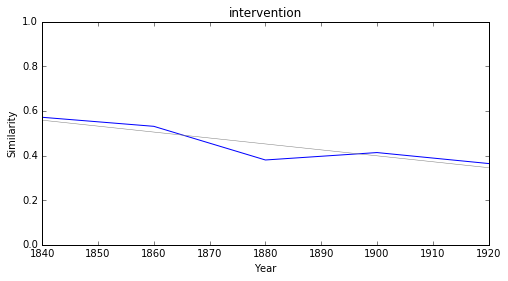

profession


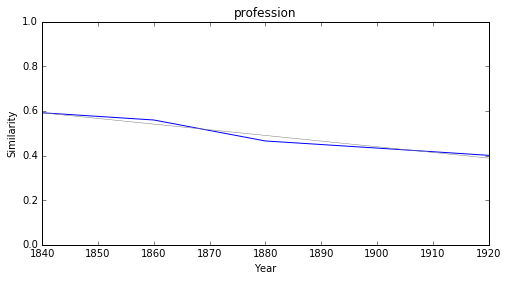

préjugé


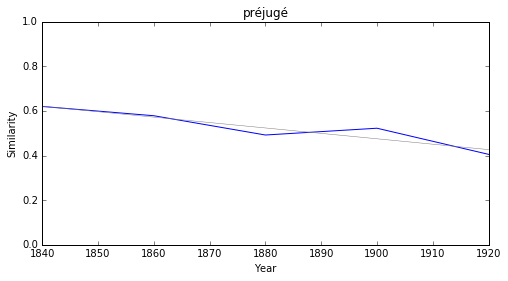

affranchissement


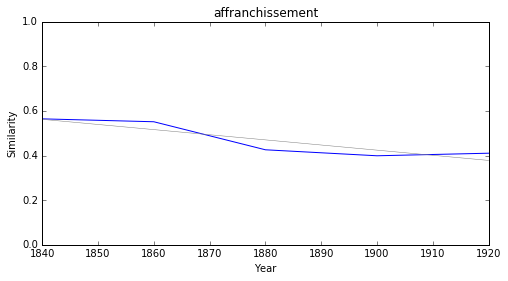

association


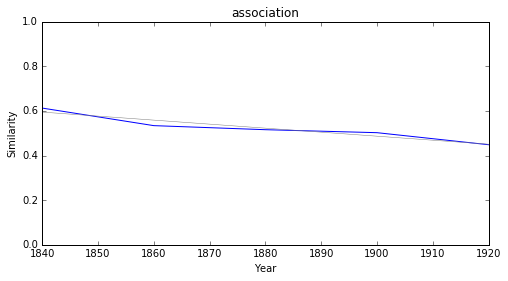

royauté


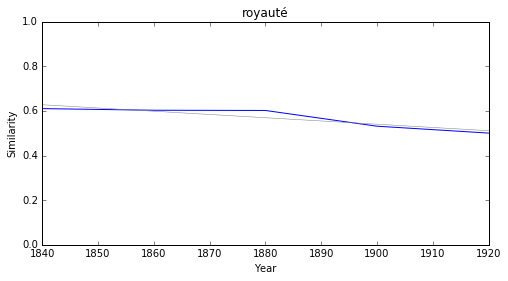

### <i><b>morale</i></b>

             token     slope         p
10         sagesse -0.003272  0.038909
19         charité -0.002719  0.039520
26   incontestable -0.002202  0.039580
24         justice -0.001908  0.012815
12      convenance -0.001494  0.040175
17       salutaire -0.001213  0.028232
30       organique  0.001339  0.032544
2   responsabilité  0.001769  0.001574
4         créateur  0.002044  0.008297
18      instinctif  0.002417  0.008284



sagesse


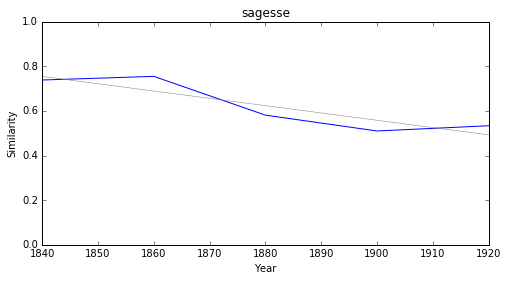

charité


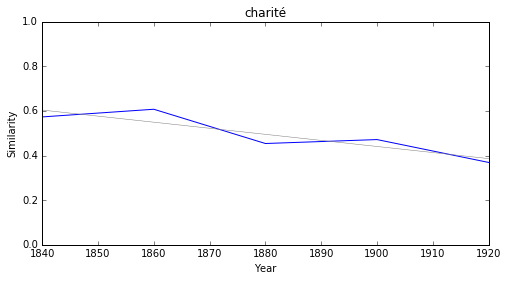

incontestable


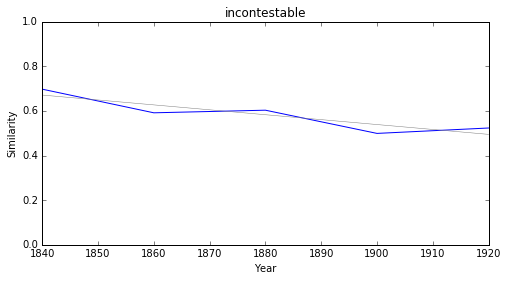

justice


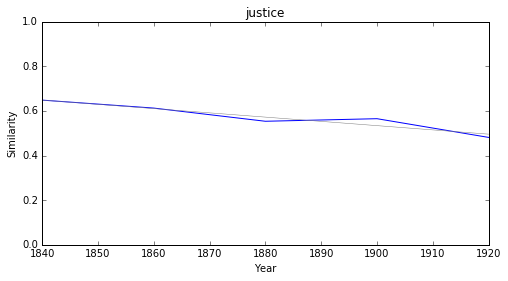

convenance


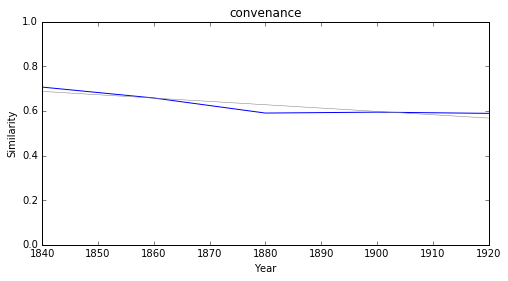

salutaire


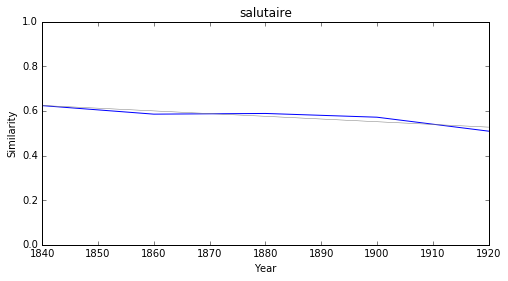

organique


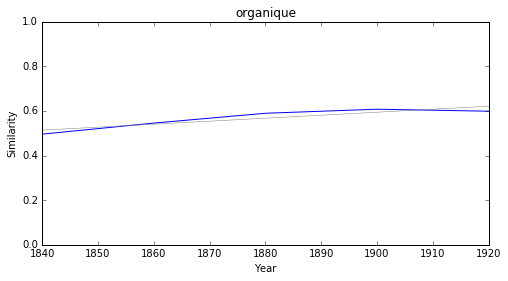

responsabilité


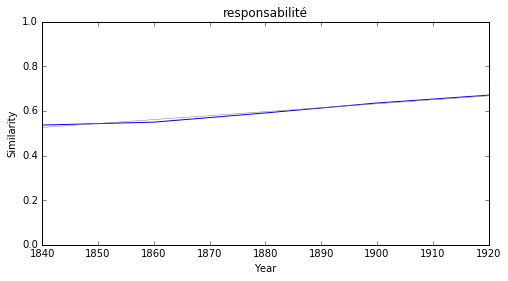

créateur


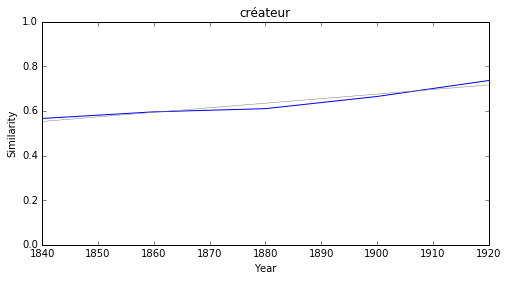

instinctif


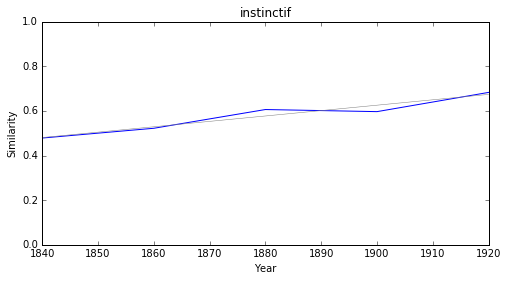

### <i><b>société</i></b>

           token     slope         p
15  intervention -0.004681  0.014647
25  intelligence -0.004606  0.015924
30     ressource -0.004526  0.046953
7     changement -0.004105  0.030084
21       liberté -0.003683  0.037483
14   distinction -0.003538  0.024050
40  indépendance -0.003238  0.036903
3       temporel -0.003221  0.046549
9        opinion -0.003094  0.048666
31      problème -0.003088  0.014810



intervention


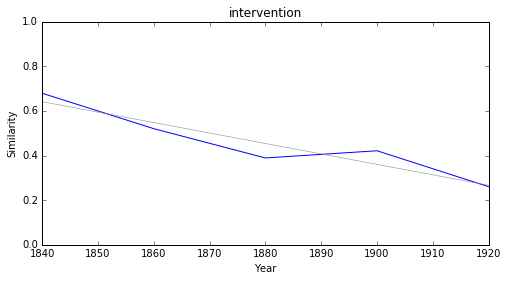

intelligence


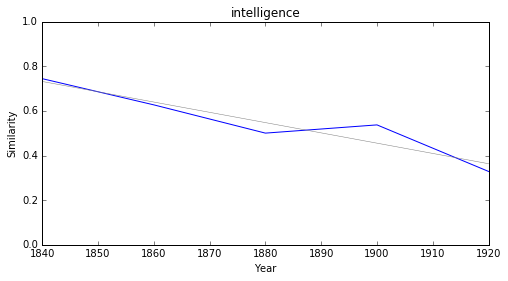

ressource


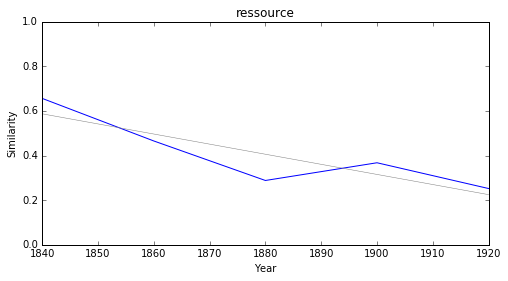

changement


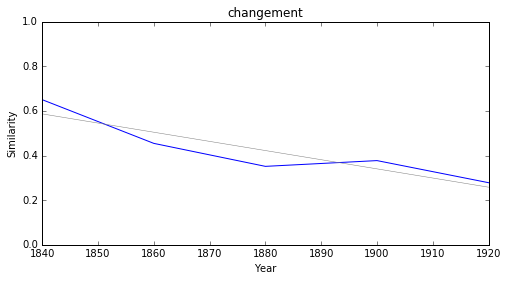

liberté


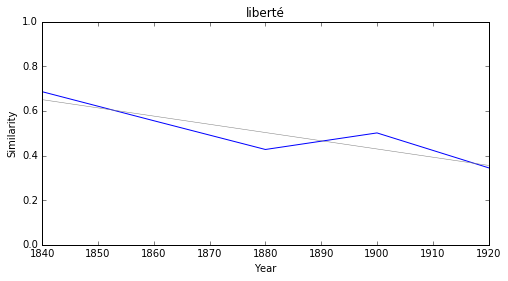

distinction


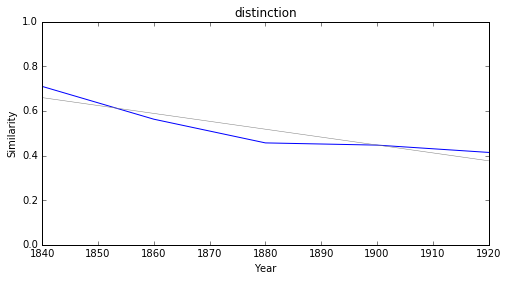

indépendance


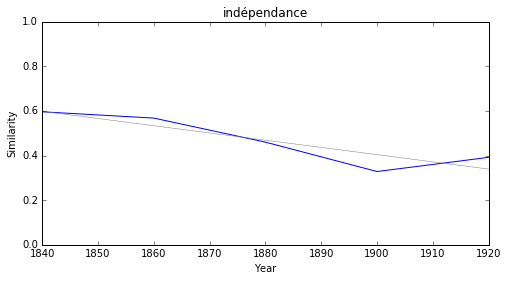

temporel


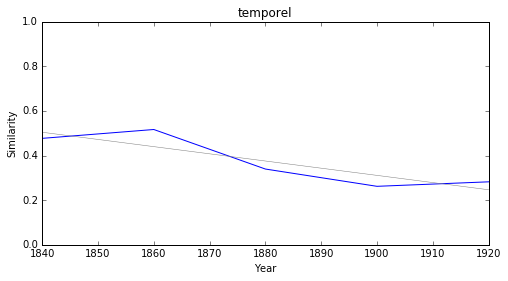

opinion


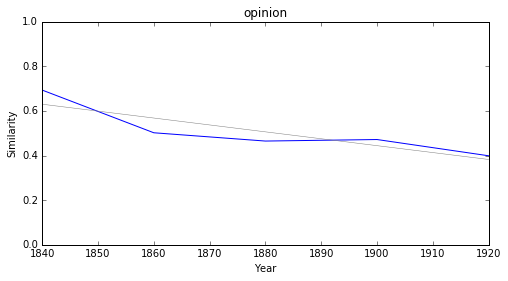

problème


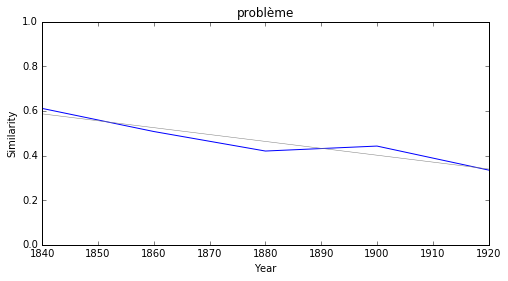

### <i><b>pouvoir</i></b>

        token     slope         p
14       gêne -0.002712  0.032815
4   puissance -0.000715  0.007101
13      souci  0.001033  0.002932
2     plaisir  0.001196  0.003250
0     élément  0.001365  0.036478
1    illusion  0.001667  0.047936
12   ensemble  0.001955  0.047651
11   scrupule  0.002074  0.045866
18  ressentir  0.002109  0.044700
9   incapable  0.002225  0.011977



gêne


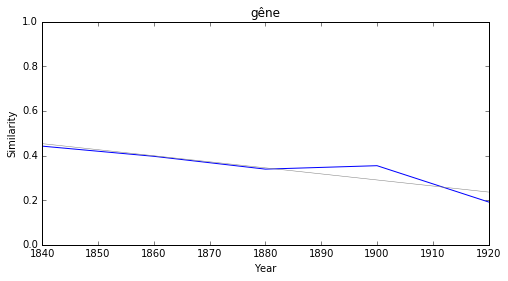

puissance


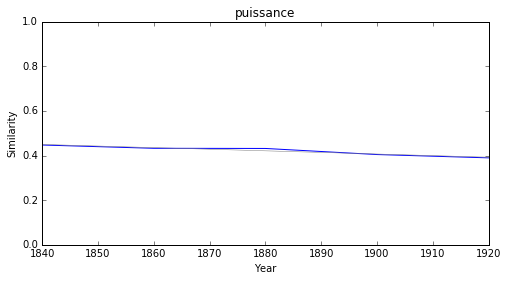

souci


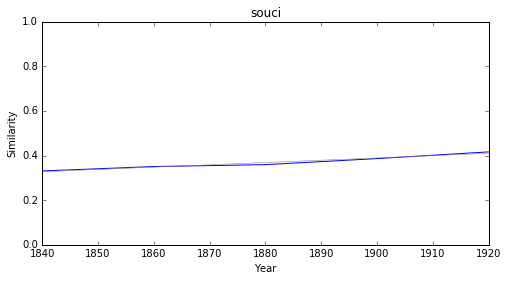

plaisir


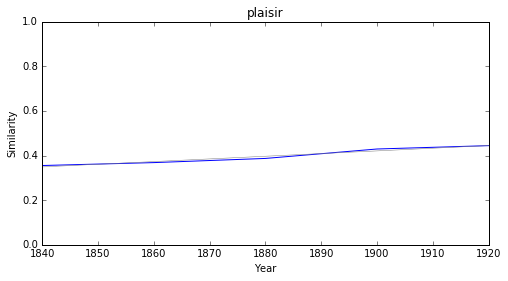

élément


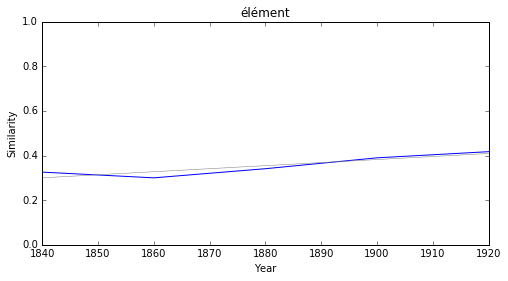

illusion


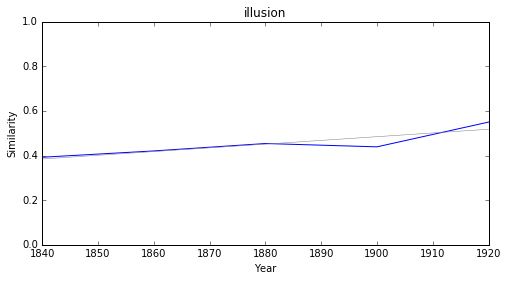

ensemble


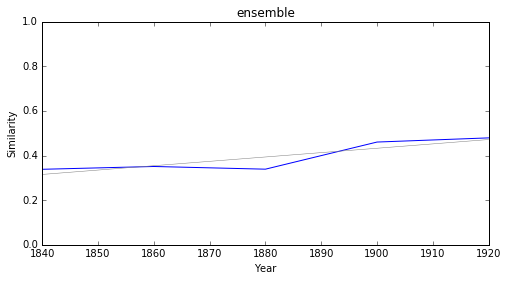

scrupule


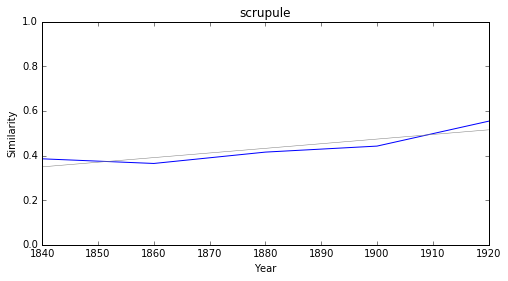

ressentir


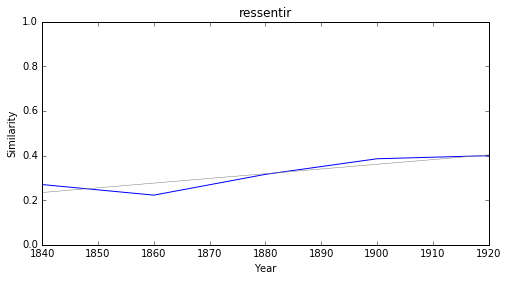

incapable


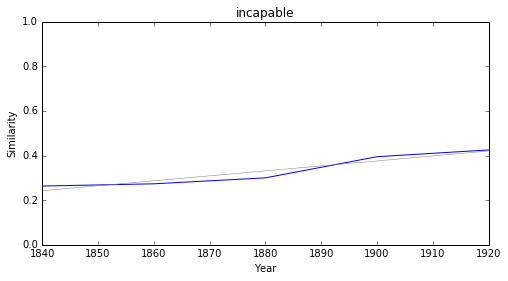

### <i><b>théologie</i></b>

            token     slope         p
46   horticulture -0.010277  0.016380
35            ies -0.009501  0.012734
29          arius -0.008727  0.032420
8        zoologie -0.005821  0.024298
20      condillac -0.005692  0.000362
21  prépondérance -0.003993  0.038249
23       leibnitz -0.003970  0.009301
41         direct -0.003575  0.049256
16    gravitation -0.003459  0.040417
28     arbitraire -0.003340  0.032033



horticulture


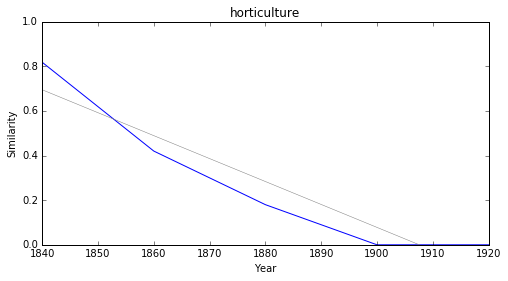

ies


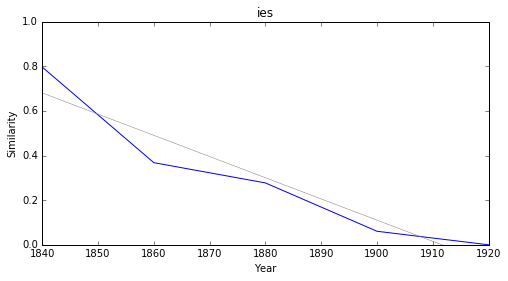

arius


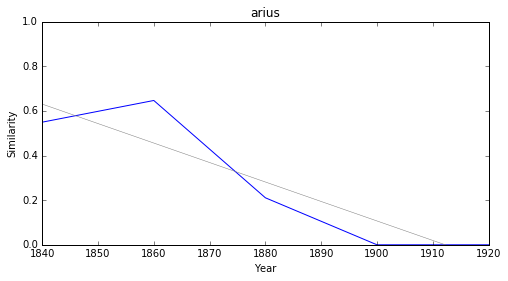

zoologie


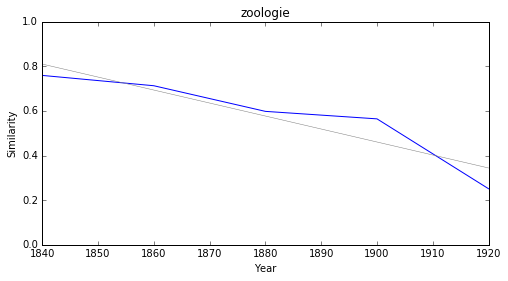

condillac


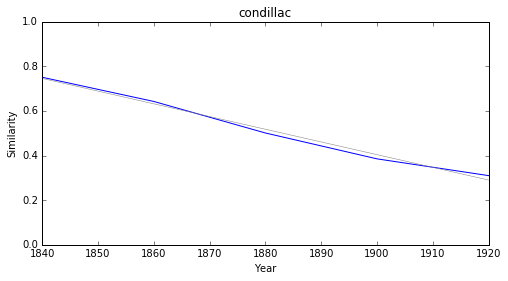

prépondérance


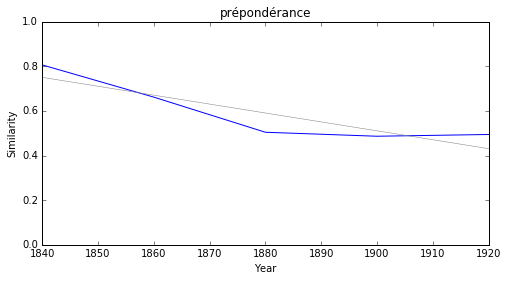

leibnitz


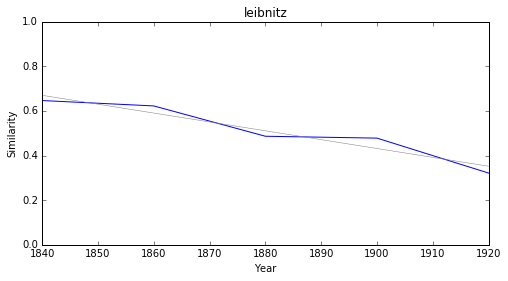

direct


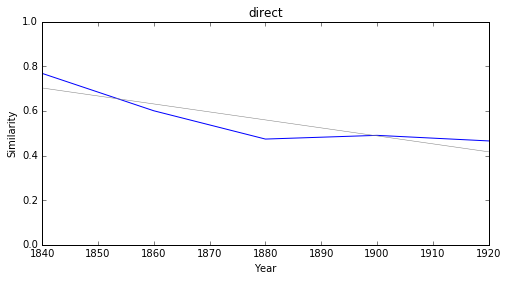

gravitation


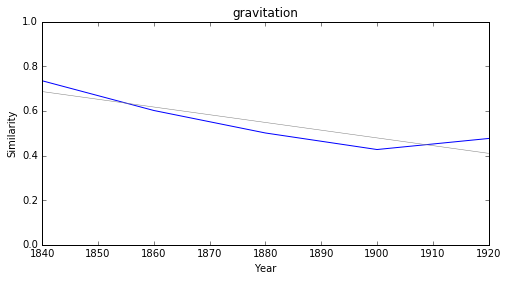

arbitraire


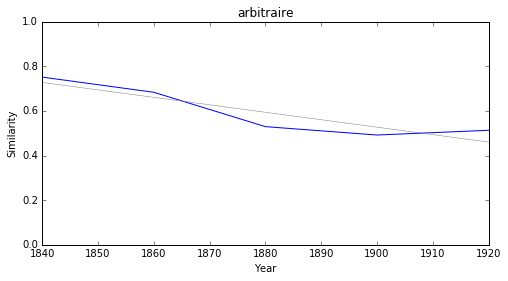

### <i><b>droit</i></b>

         token     slope         p
10     pontife -0.004559  0.016650
16    sévérité -0.004464  0.046331
11    prudence -0.004300  0.028690
18     serment -0.003411  0.000667
22     arbitre -0.003347  0.049370
19     royauté -0.003068  0.012321
4        punir -0.003037  0.037515
2   prospérité -0.003022  0.031167
17   fondement -0.002338  0.029615
0      égalité -0.002199  0.021421



pontife


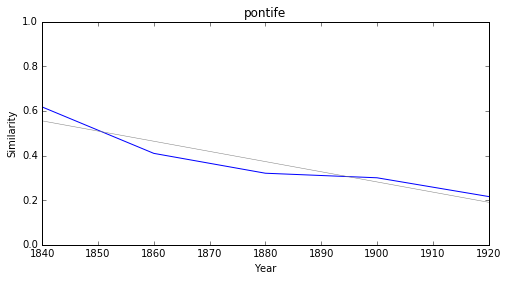

sévérité


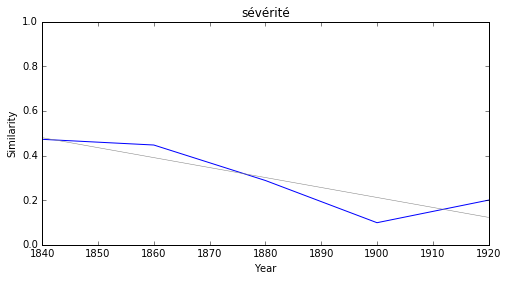

prudence


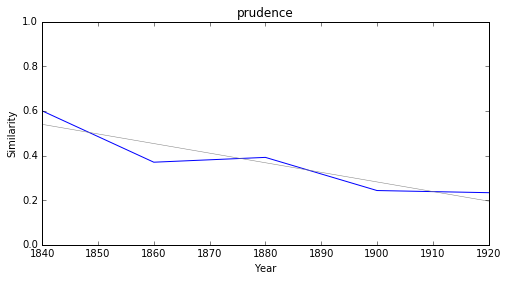

serment


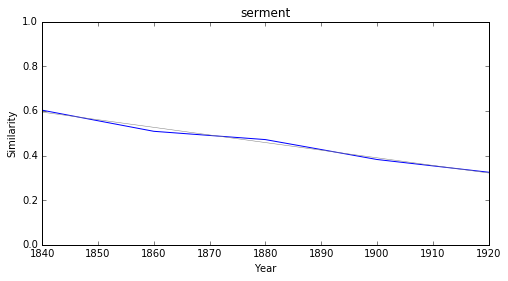

arbitre


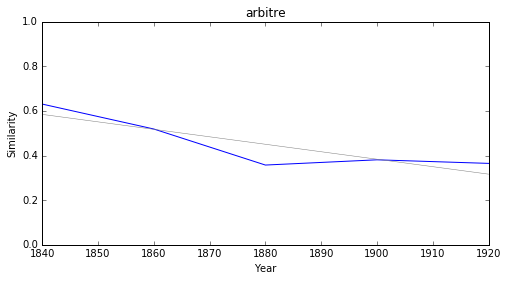

royauté


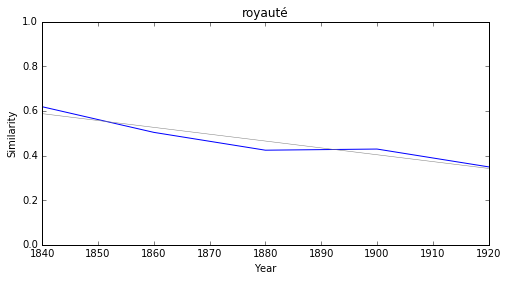

punir


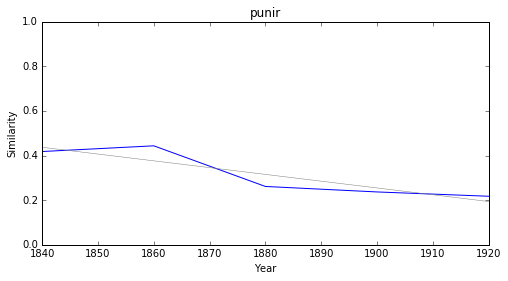

prospérité


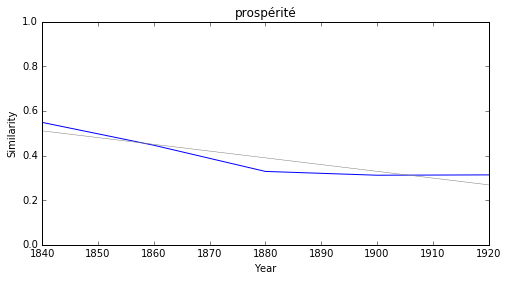

fondement


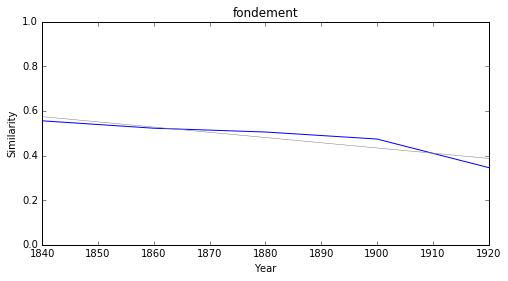

égalité


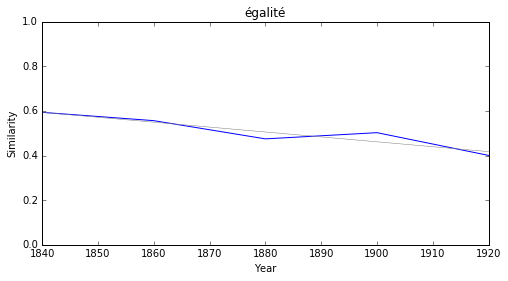

### <i><b>loi</i></b>

             token     slope         p
6            secte -0.003892  0.004383
21       tolérance -0.003713  0.002127
19     physiologie -0.003054  0.001441
20         royauté -0.002682  0.000093
9         division -0.001808  0.023149
4            dogme -0.000636  0.022129
17        résultat  0.000268  0.048662
15       organisme  0.001844  0.022557
13  interprétation  0.001935  0.036729
0        confusion  0.002020  0.036930



secte


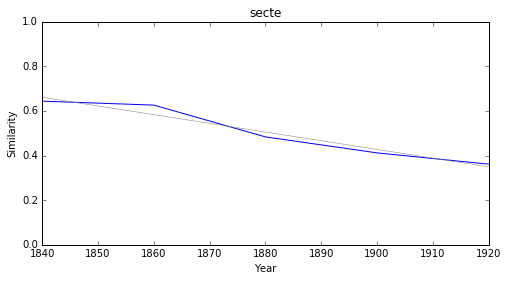

tolérance


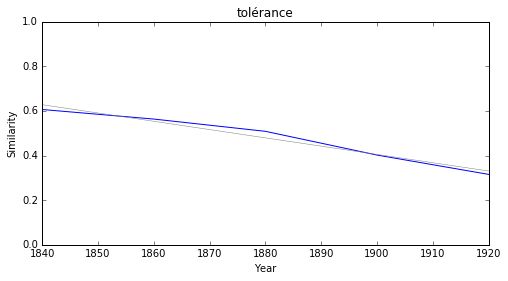

physiologie


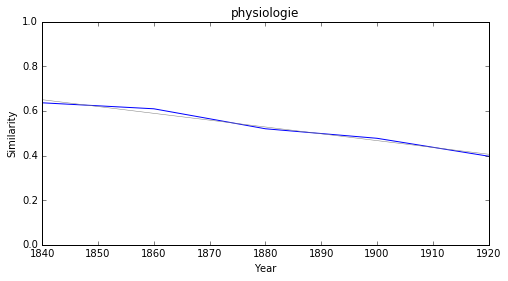

royauté


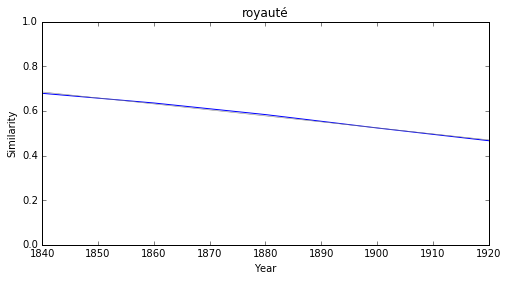

division


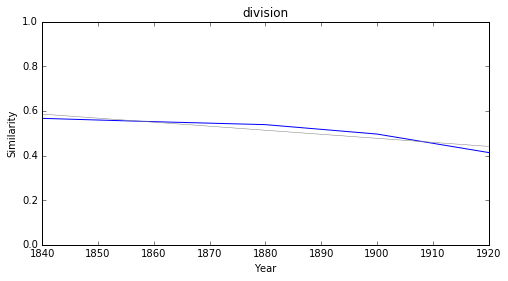

dogme


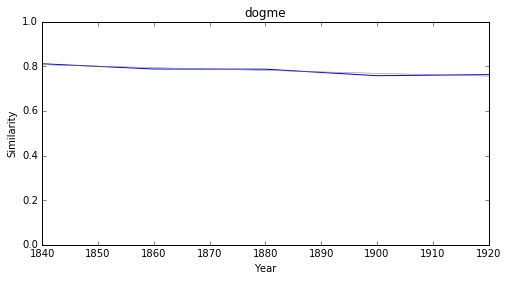

résultat


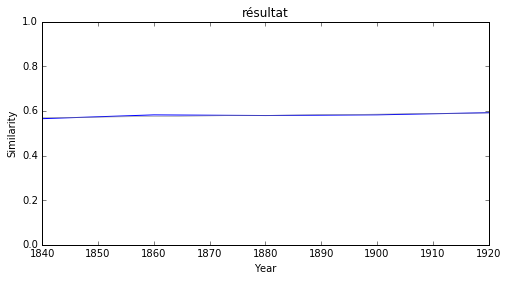

organisme


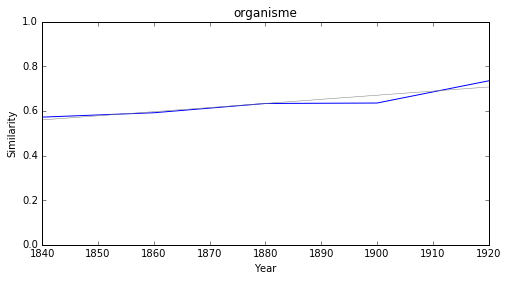

interprétation


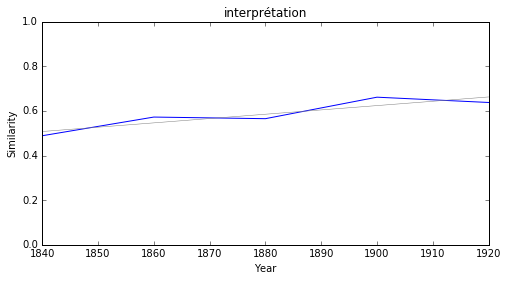

confusion


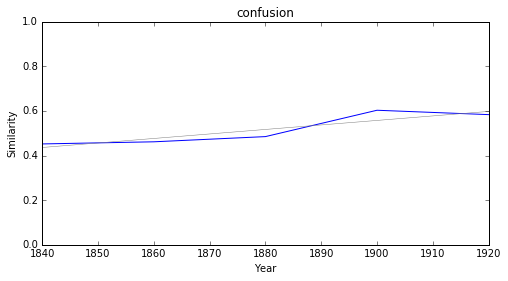

### <i><b>méthode</i></b>

              token     slope         p
2       destination -0.006971  0.041629
27  expérimentation -0.005585  0.042847
7         induction -0.004343  0.001183
11    physiologique -0.003989  0.030632
17    inconséquence -0.003875  0.035950
29        constater -0.003841  0.008991
23      théologique -0.003768  0.045011
24      physiologie -0.003685  0.000002
32       altération -0.003411  0.000116
14      spéculation -0.003256  0.027957



destination


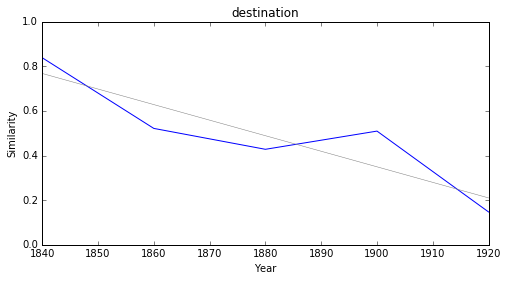

expérimentation


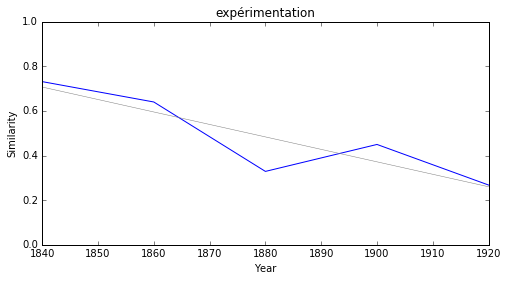

induction


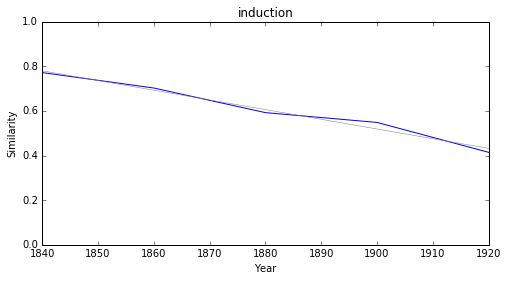

physiologique


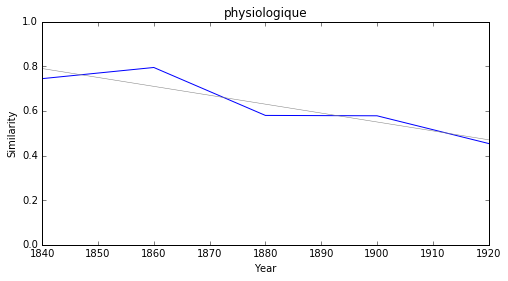

inconséquence


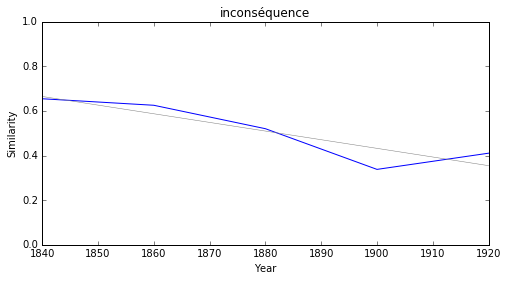

constater


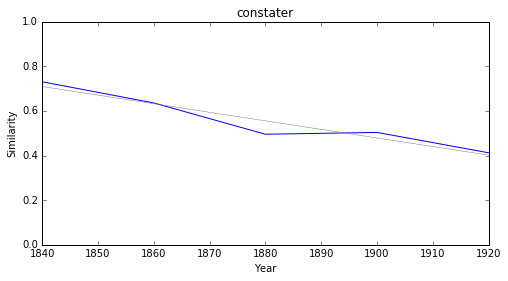

théologique


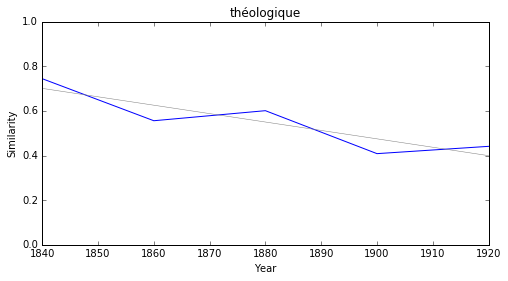

physiologie


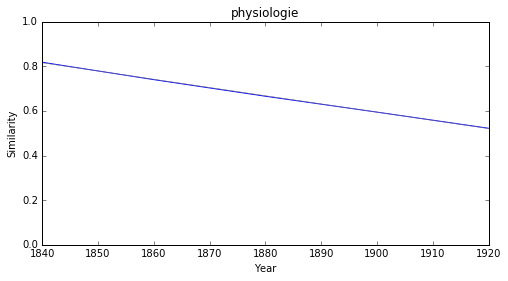

altération


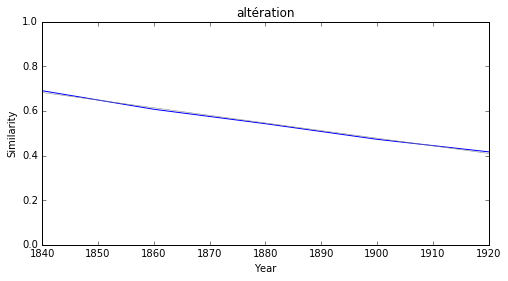

spéculation


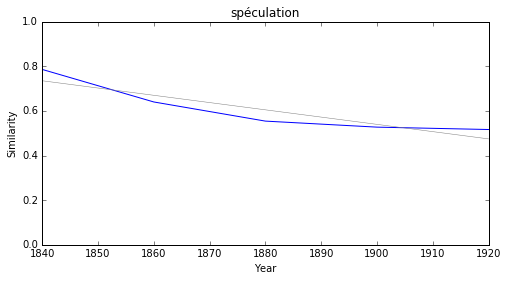

### <i><b>génie</i></b>

           token     slope         p
9   rationalisme -0.002460  0.024630
0      splendeur -0.002352  0.022090
4      éloquence -0.002250  0.035832
5        naïveté -0.001744  0.039775
12         verve -0.001407  0.013582
23     élévation -0.001358  0.003738
18     mécanisme  0.001036  0.002393
16      novateur  0.001769  0.009065
2        symbole  0.001860  0.046456
10      prestige  0.001862  0.045766



rationalisme


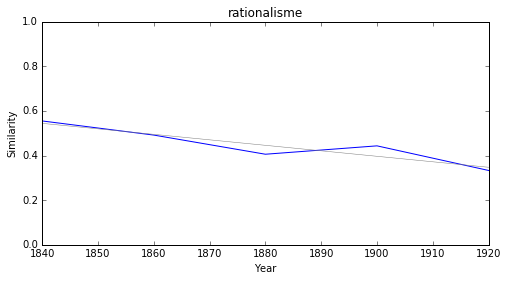

splendeur


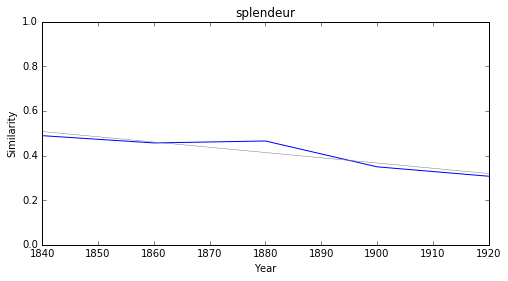

éloquence


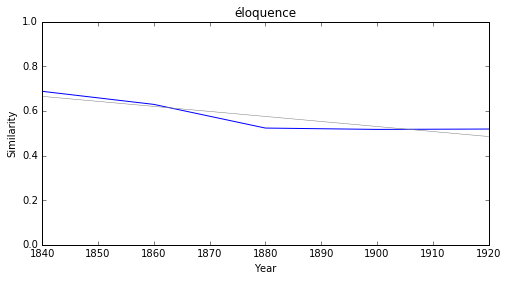

naïveté


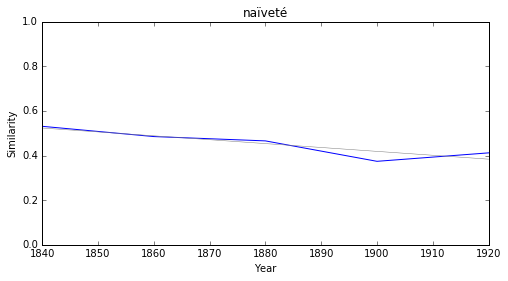

verve


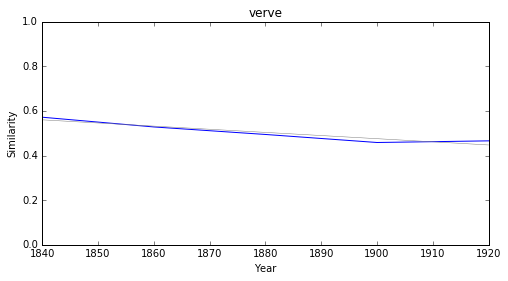

élévation


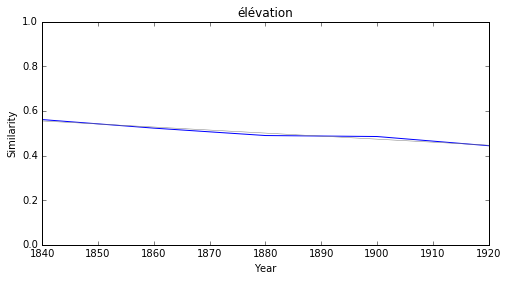

mécanisme


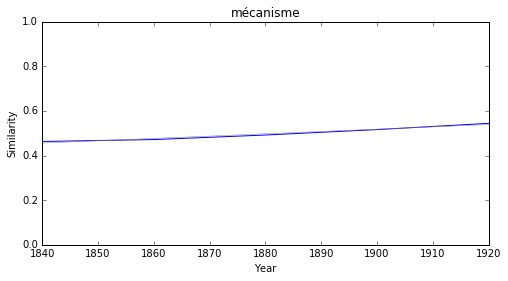

novateur


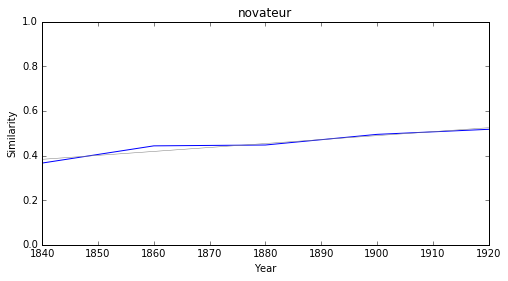

symbole


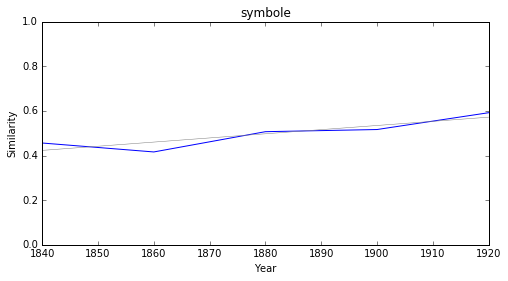

prestige


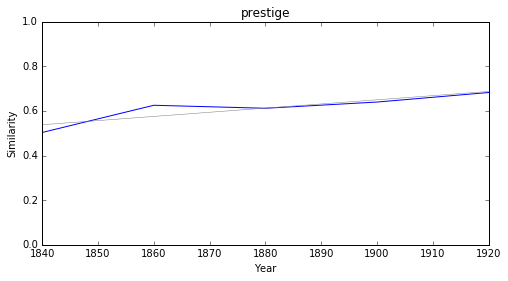

### <i><b>romantisme</i></b>

            token     slope         p
29        orifice -0.010563  0.021800
45        collége -0.010443  0.011771
23       cauchois -0.010373  0.022835
16      églantier -0.010002  0.047177
36            nil -0.009575  0.014172
35        laocoon -0.008904  0.005292
30  métempsychose -0.008807  0.012657
11    monothéisme -0.008778  0.032311
14          gange -0.008731  0.011670
42       consulte -0.008681  0.039142



orifice


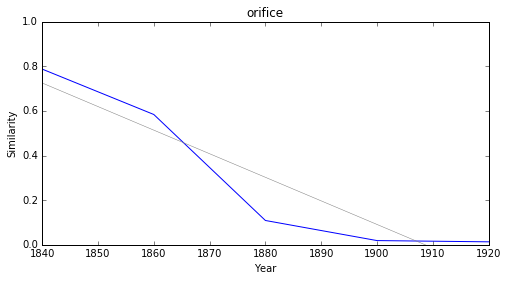

collége


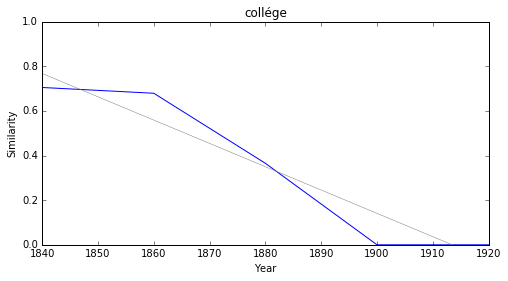

cauchois


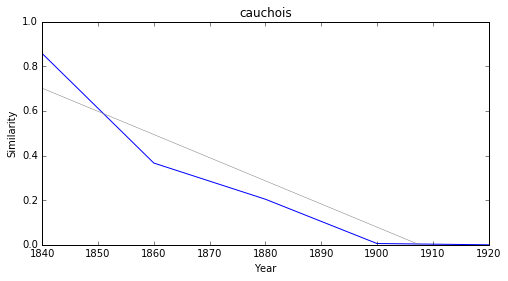

églantier


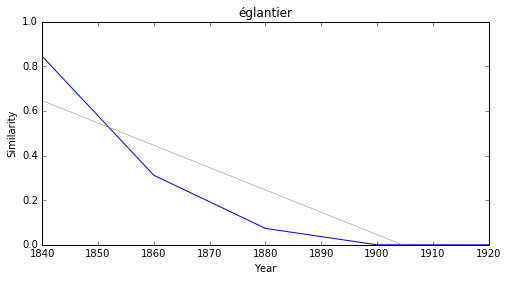

nil


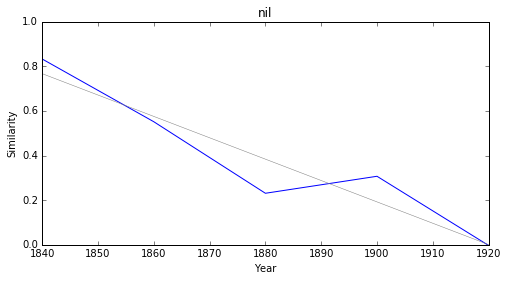

laocoon


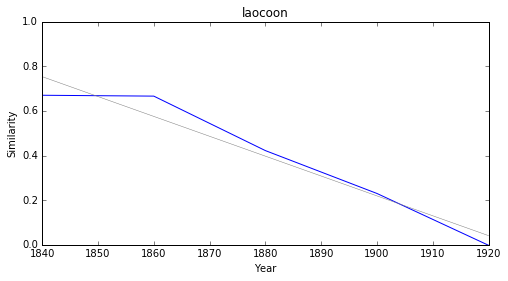

métempsychose


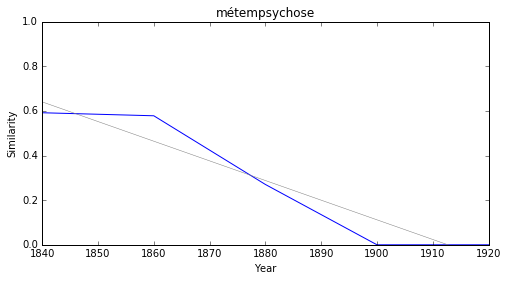

monothéisme


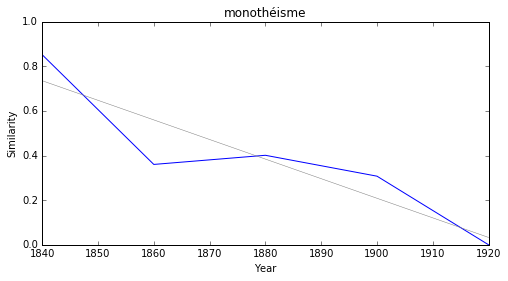

gange


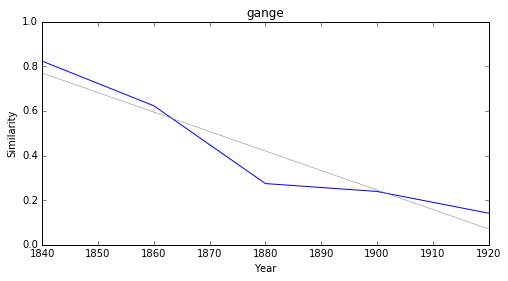

consulte


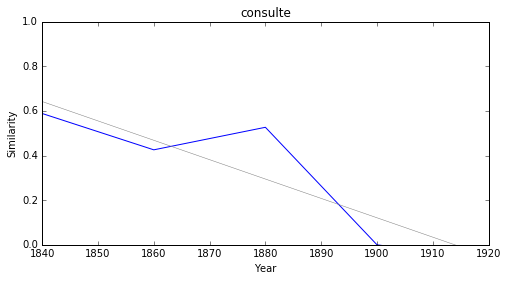

### <i><b>réalisme</i></b>

          token     slope         p
42          ies -0.011859  0.034810
55       alcali -0.010581  0.012537
65       tybalt -0.010574  0.011188
22       warton -0.010418  0.016614
66       affidé -0.009905  0.013209
19           dl -0.009842  0.015520
58     gervinus -0.009773  0.028660
59       xxxvii -0.009688  0.026852
70  déperdition -0.009518  0.038718
12       ramsay -0.009479  0.043967



ies


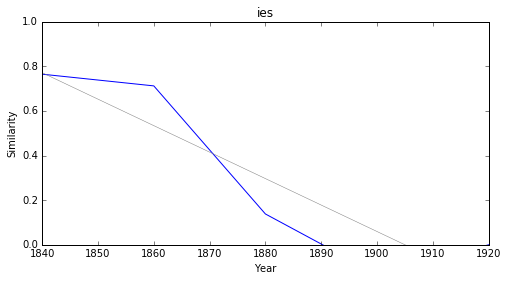

alcali


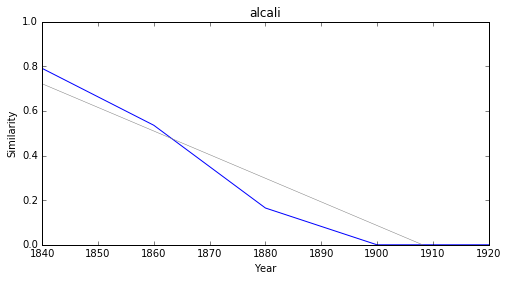

tybalt


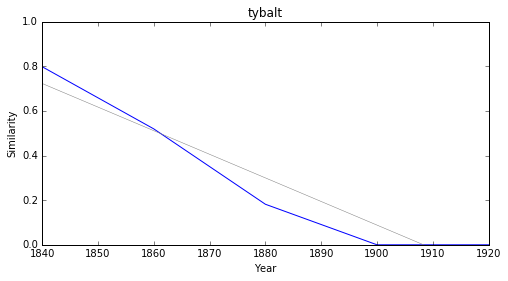

warton


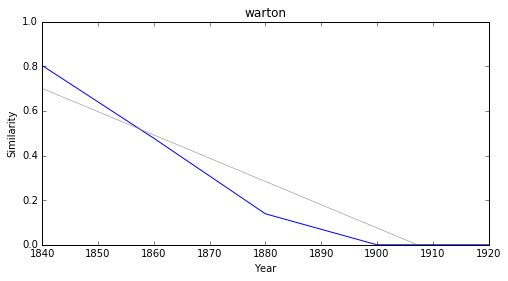

affidé


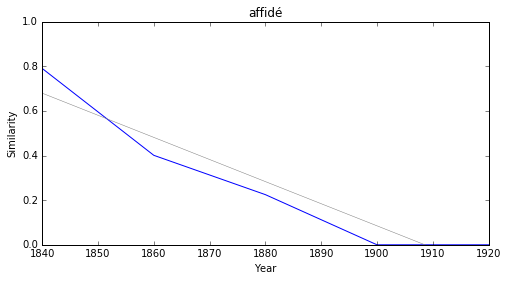

dl


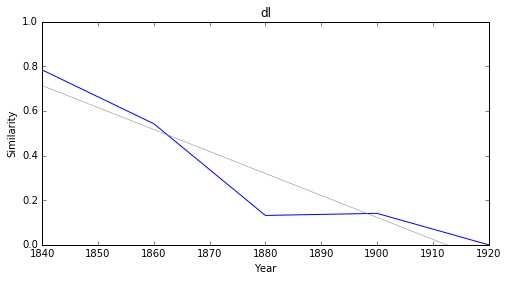

gervinus


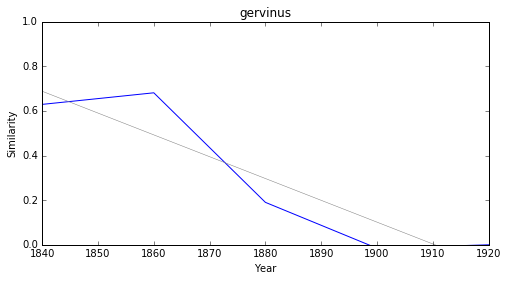

xxxvii


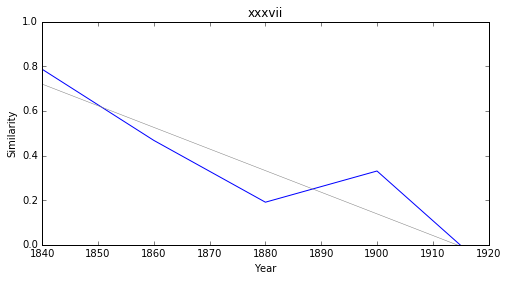

déperdition


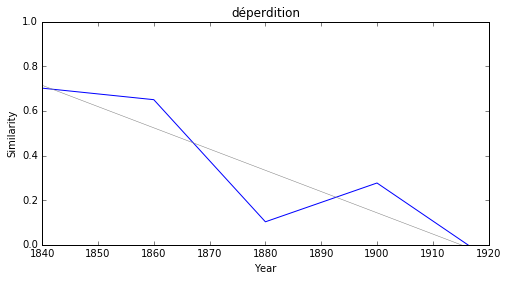

ramsay


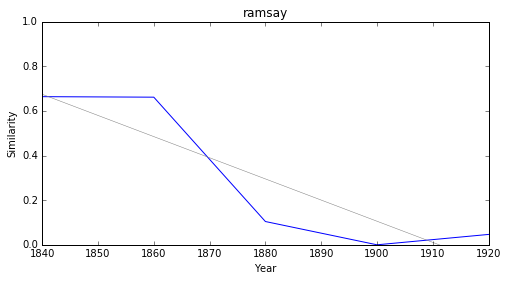

### <i><b>symbolisme</i></b>

            token     slope         p
38            ies -0.012636  0.020278
36  disciplinaire -0.011168  0.014376
37      idiotisme -0.010919  0.015602
27      accusatif -0.010302  0.012184
44     polyglotte -0.009726  0.032411
12         comète -0.009287  0.034764
1       tombereau -0.009046  0.020553
30       consulte -0.009014  0.040250
33            rig -0.008786  0.042013
25     mansuétude -0.008760  0.019281



ies


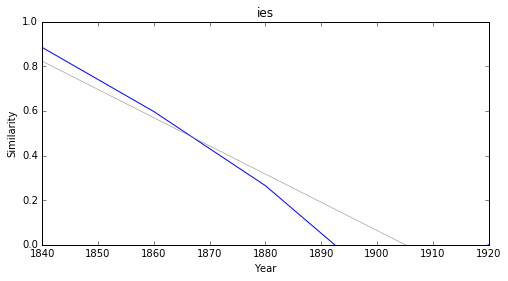

disciplinaire


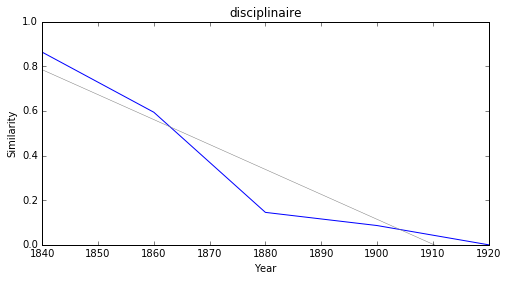

idiotisme


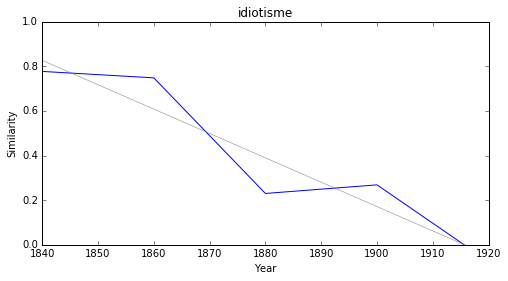

accusatif


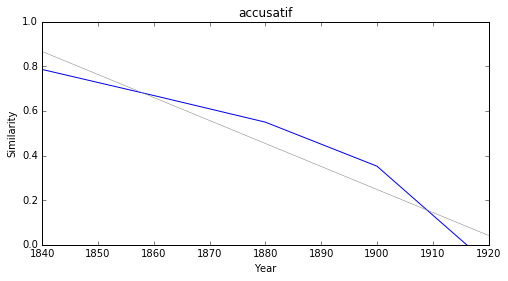

polyglotte


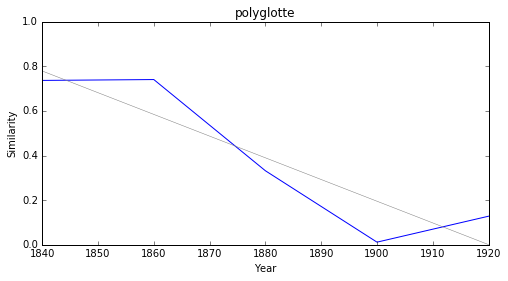

comète


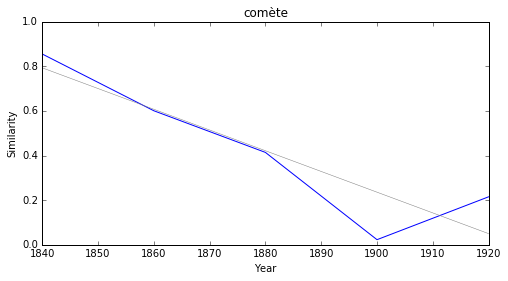

tombereau


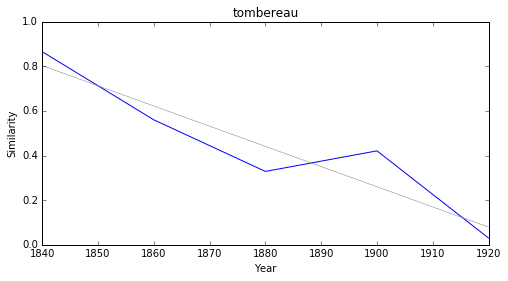

consulte


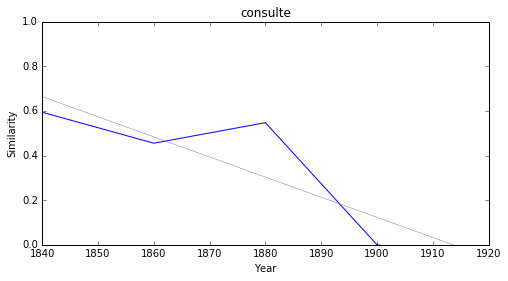

rig


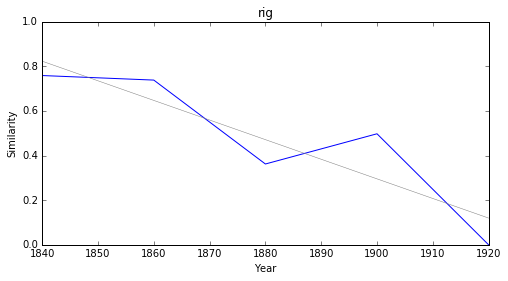

mansuétude


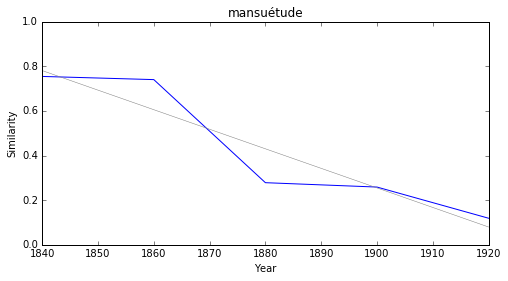

### <i><b>naturalisme</i></b>

          token     slope         p
24          ies -0.012906  0.026193
4          nala -0.011806  0.041429
26       pousse -0.011738  0.025406
10     cauchois -0.011624  0.015109
38      krishna -0.011490  0.040601
17      étrurie -0.011203  0.012720
19     brancard -0.010614  0.009121
43   macpherson -0.010143  0.026606
14  hiérophante -0.009827  0.010908
41     paraclet -0.009545  0.041696



ies


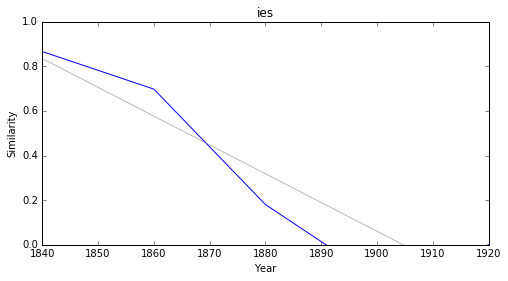

nala


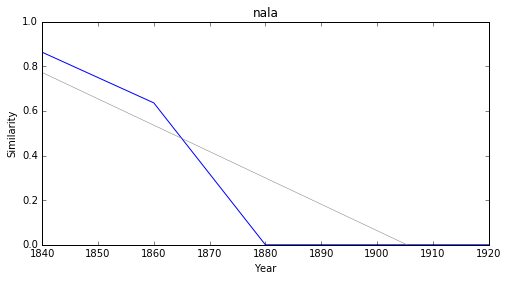

pousse


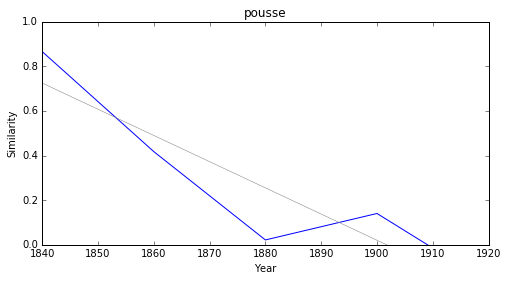

cauchois


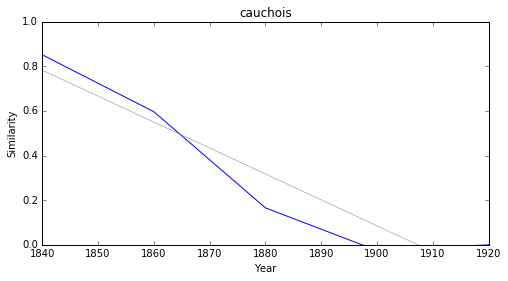

krishna


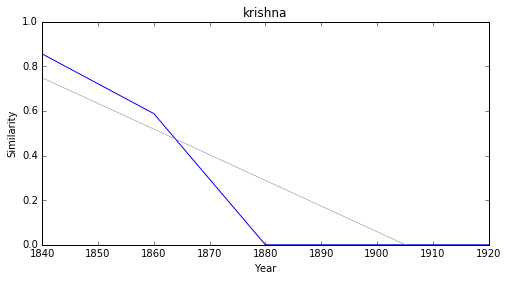

étrurie


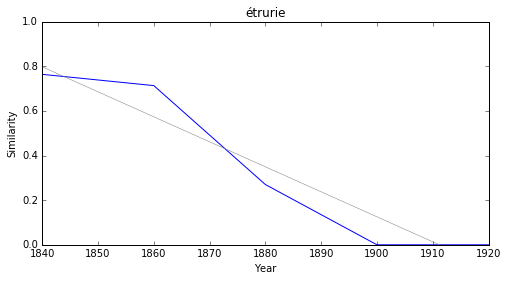

brancard


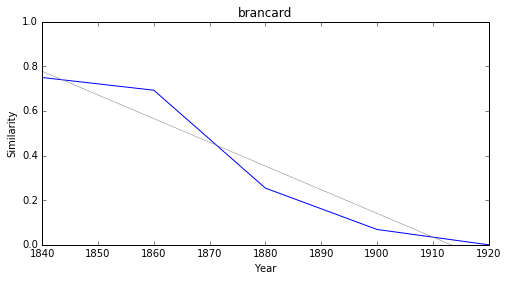

macpherson


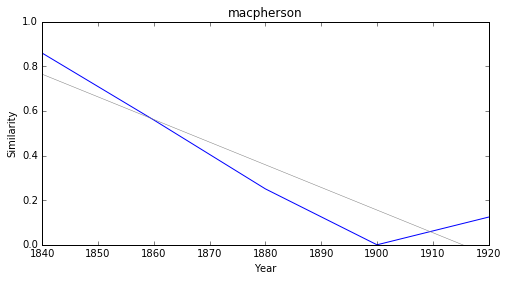

hiérophante


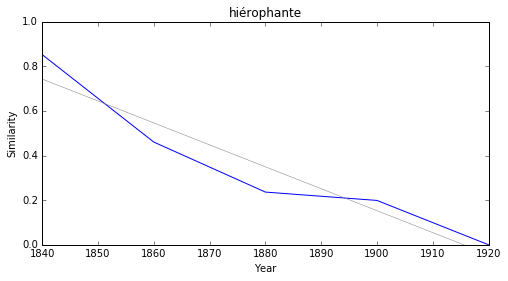

paraclet


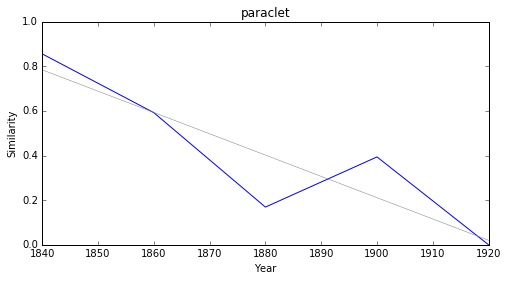

In [76]:
for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df2 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df2.sort_values('slope', ascending=True).head(10))
    print('\n\n')
    
    for i, row in df2.sort_values('slope', ascending=True).head(10).iterrows():
        plot_cosine_series(word, row['token'], 8, 4)

# Intersected neighbors

In [77]:
def intersect_neighbor_vocab(anchor, topn=2000):
    
    vocabs = []
    
    for year, model in models.items():
        similar = model.most_similar(anchor, topn=topn)
        vocabs.append(set([s[0] for s in similar]))
        
    return set.intersection(*vocabs)

In [78]:
entries={}

for word in testList:
    data = []
    for token in intersect_neighbor_vocab(word):
    
        series = cosine_series(word, token)
        fit = lin_reg(series)
    
        if fit.pvalues[1] < 0.05:
            data.append((token, fit.params[1], fit.pvalues[1]))
    entries[word]=data

In [79]:
import pandas as pd

### <i><b>littérature</i></b>

          token     slope         p
5         thèse  0.003912  0.001754
12   romantique  0.003671  0.032306
17   romantisme  0.003334  0.016078
8       culture  0.003254  0.020990
10     métrique  0.003019  0.045490
19   artistique  0.002972  0.001659
11    grammaire  0.002686  0.019628
13  renaissance  0.002579  0.005921
22      pléiade  0.002291  0.037112
1    conception  0.002287  0.026294



thèse


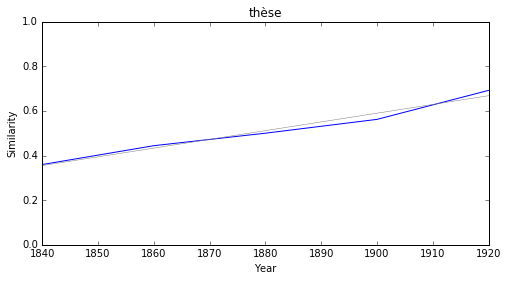

romantique


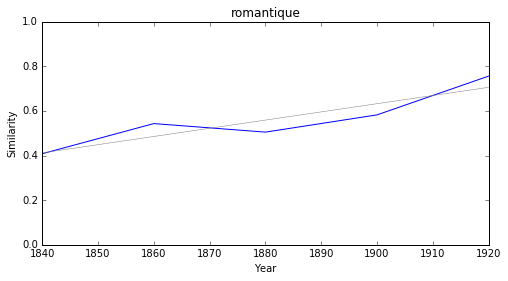

romantisme


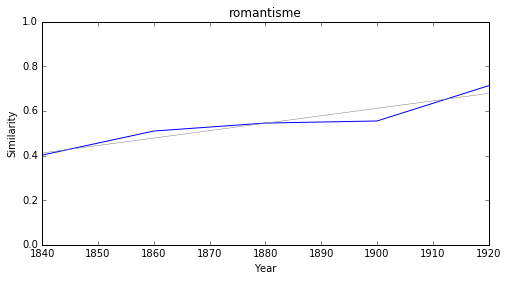

culture


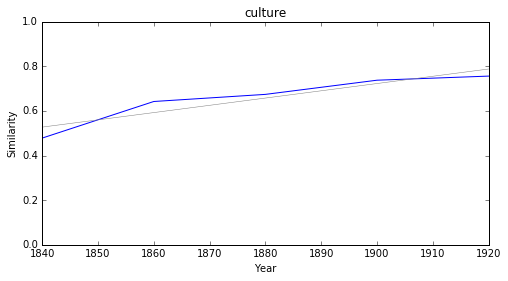

métrique


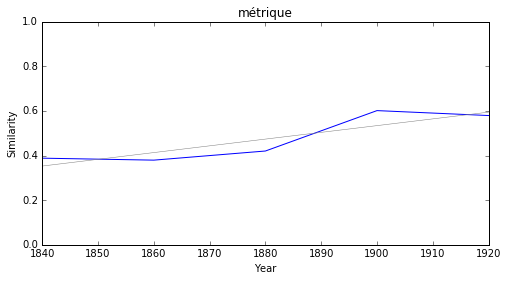

artistique


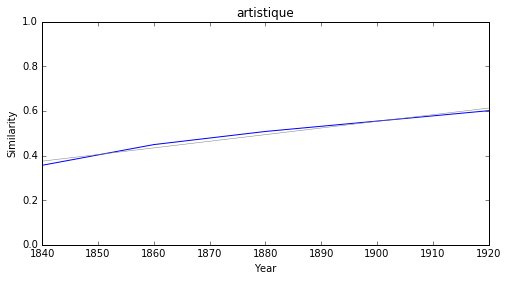

grammaire


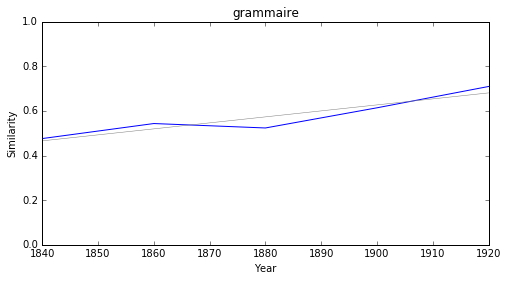

renaissance


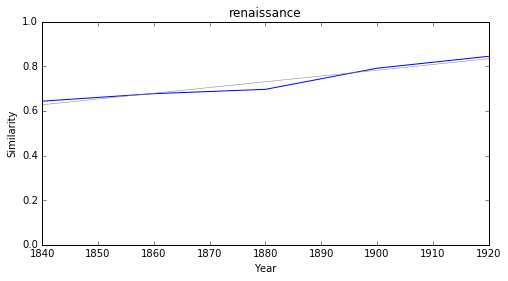

pléiade


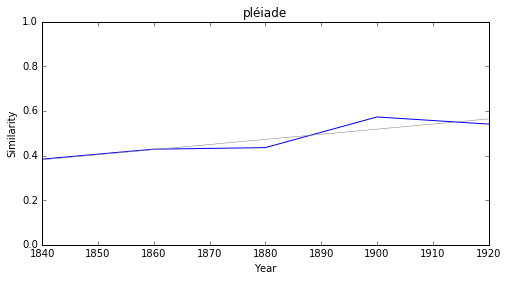

conception


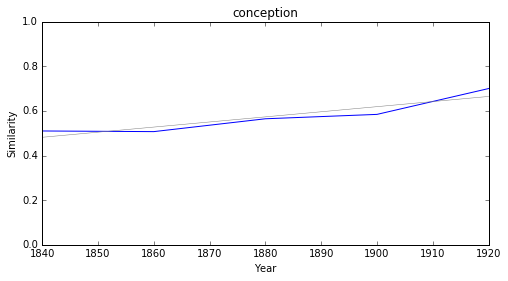

### <i><b>poésie</i></b>

           token     slope         p
3         rythme  0.004651  0.020520
7       synthèse  0.002874  0.036696
0     équivalent  0.002494  0.037037
8     romantisme  0.002410  0.034118
15        fusion  0.002184  0.003970
10         rimer  0.002009  0.019301
5      plénitude  0.001941  0.023868
11  personnalité  0.001926  0.047113
17    expression  0.001686  0.049338
12     sincérité  0.001608  0.045959



rythme


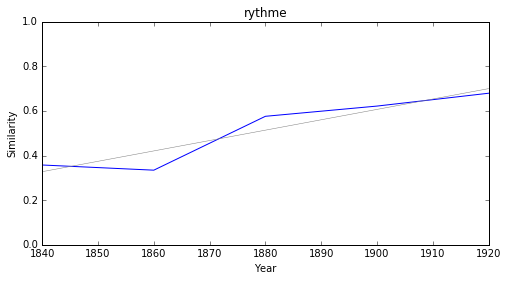

synthèse


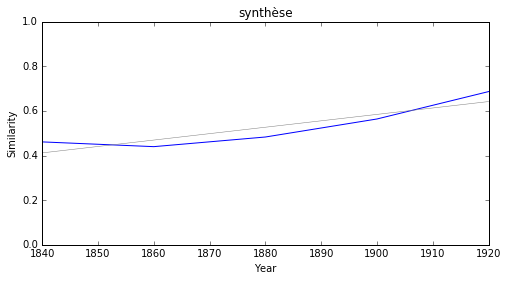

équivalent


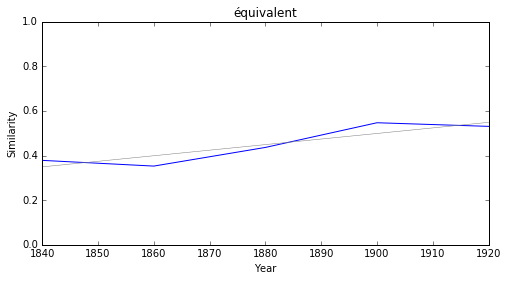

romantisme


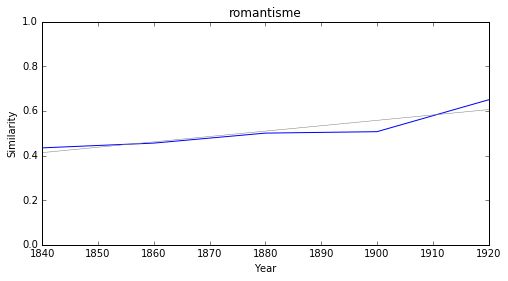

fusion


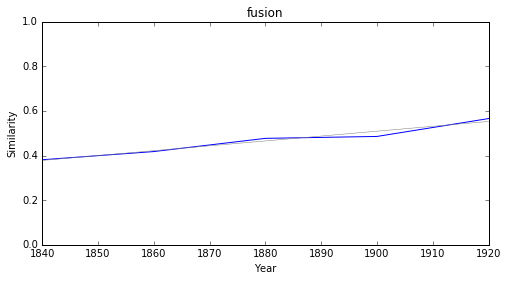

rimer


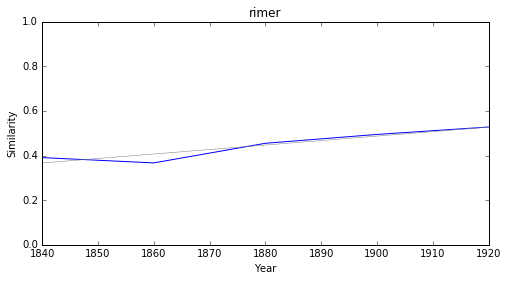

plénitude


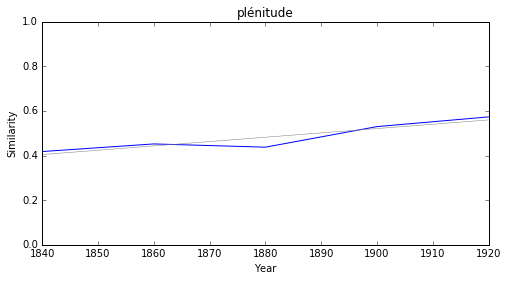

personnalité


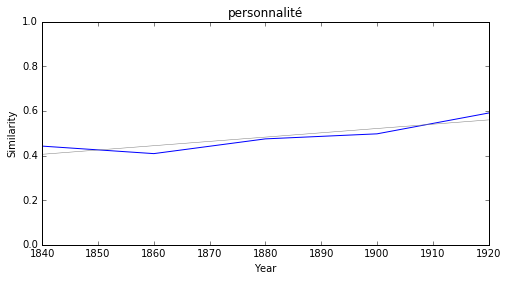

expression


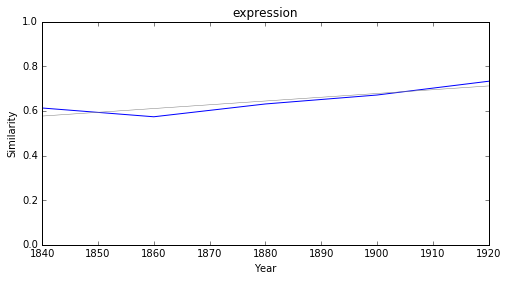

sincérité


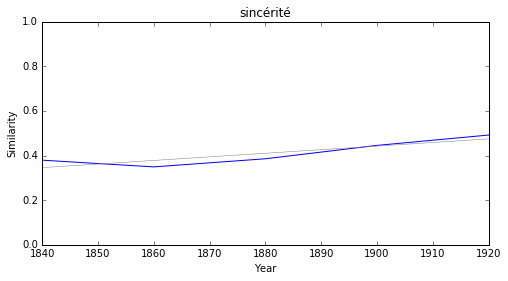

### <i><b>science</i></b>

         token     slope         p
7   démocratie  0.003162  0.007856
1        thèse  0.003069  0.018877
3   convention  0.002538  0.008362
8   hiérarchie  0.002097  0.038372
0   esthétique  0.001881  0.014456
6   rénovation  0.001737  0.043417
4   obligation  0.001207  0.031690
2     aristote  0.000980  0.014305
5  physiologie -0.002929  0.035389



démocratie


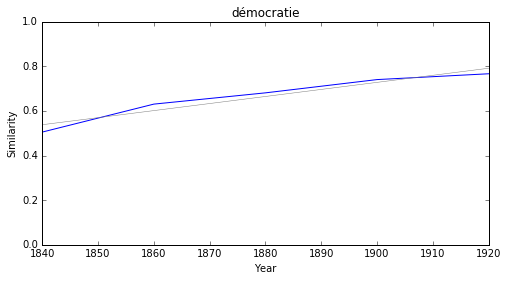

thèse


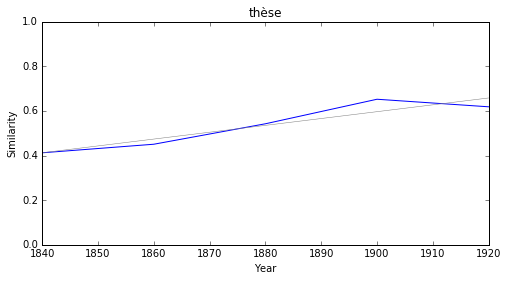

convention


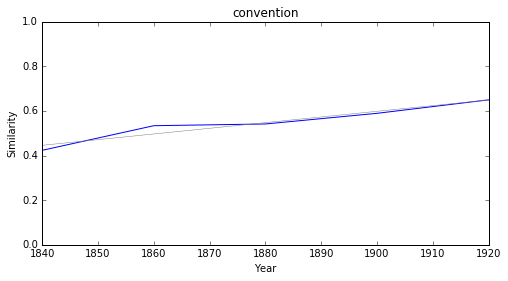

hiérarchie


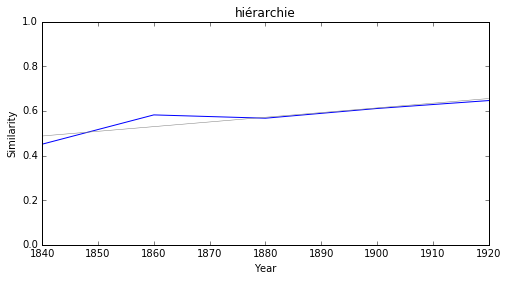

esthétique


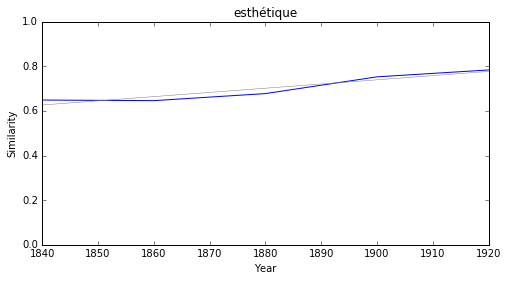

rénovation


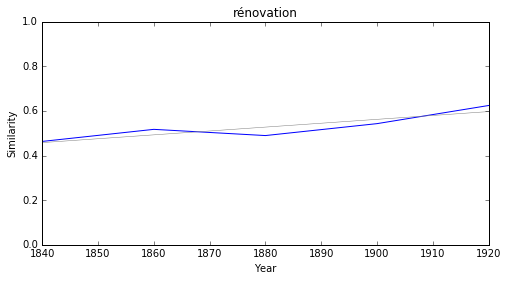

obligation


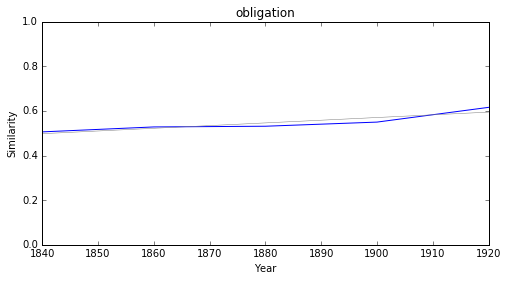

aristote


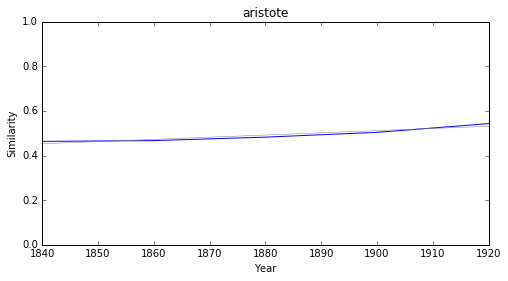

physiologie


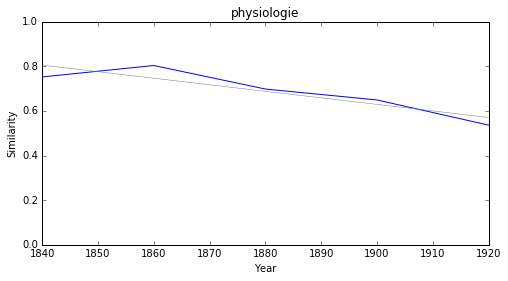

### <i><b>savoir</i></b>

          token     slope         p
0       railler  0.002230  0.022109
1  raisonnement  0.001821  0.014397
2        métier  0.001241  0.002480
3        vanter -0.001712  0.049584



railler


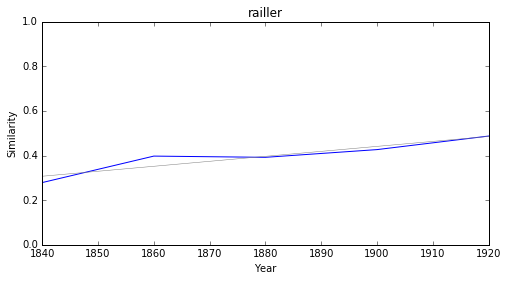

raisonnement


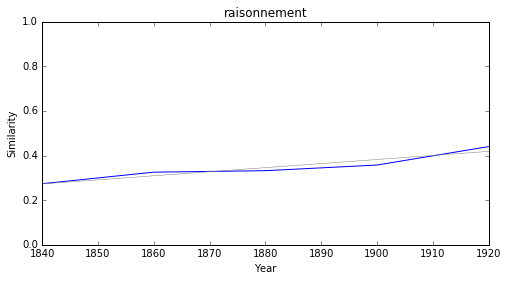

métier


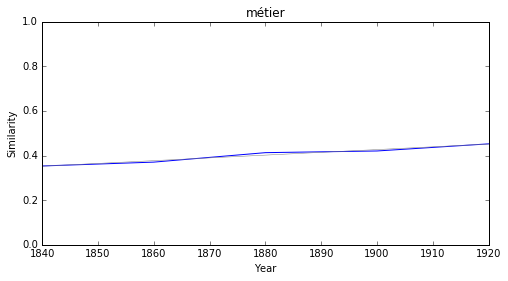

vanter


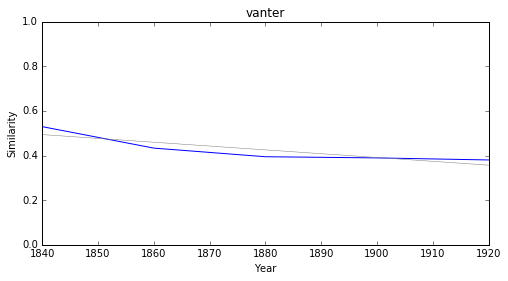

### <i><b>histoire</i></b>

        token     slope         p
3     enquête  0.003175  0.031832
0  conception  0.002630  0.011807
4  artistique  0.002455  0.043558
2     culture  0.002186  0.011003
1     légende  0.001947  0.013143



enquête


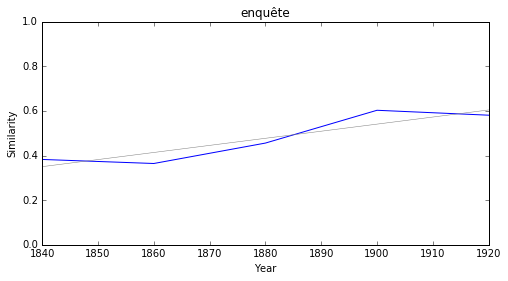

conception


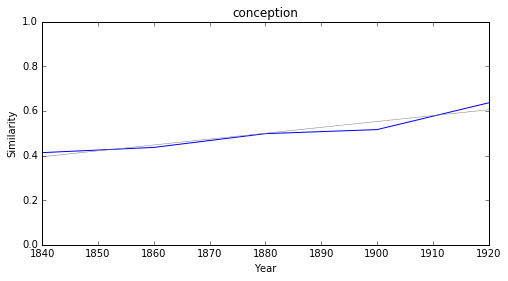

artistique


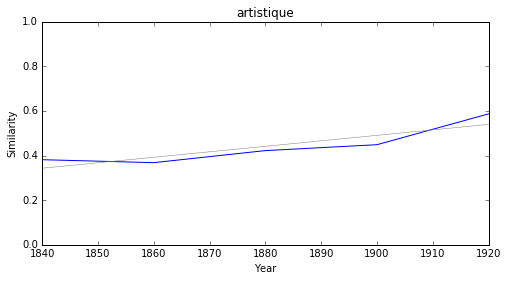

culture


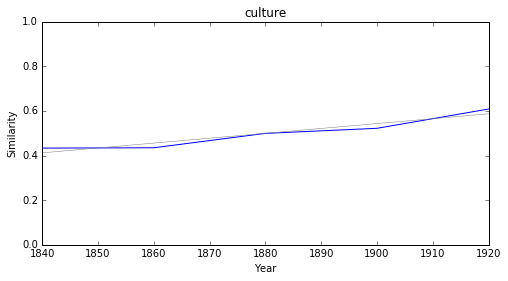

légende


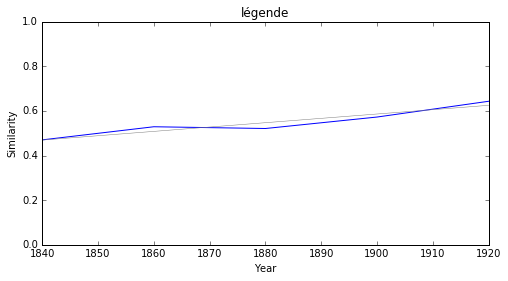

### <i><b>philosophie</i></b>

              token     slope         p
6        artistique  0.003774  0.006573
2             thèse  0.003032  0.014355
5        continuité  0.002271  0.016898
9        démocratie  0.002195  0.038124
7       préparation  0.001720  0.006041
0        esthétique  0.001531  0.031395
1         théorique  0.001482  0.028746
3  particulièrement -0.000782  0.019721
4         rationnel -0.001695  0.023396
8            vérité -0.001719  0.047640



artistique


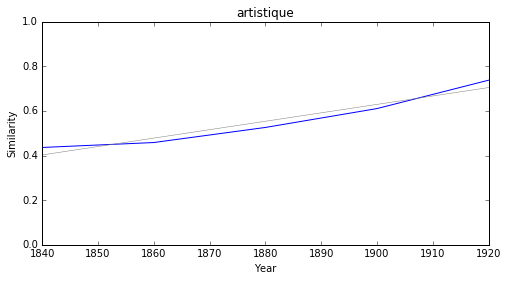

thèse


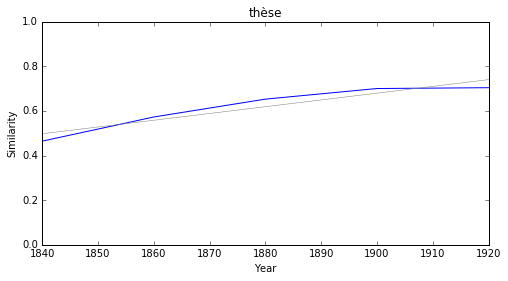

continuité


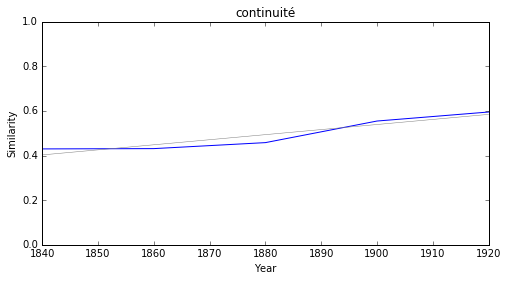

démocratie


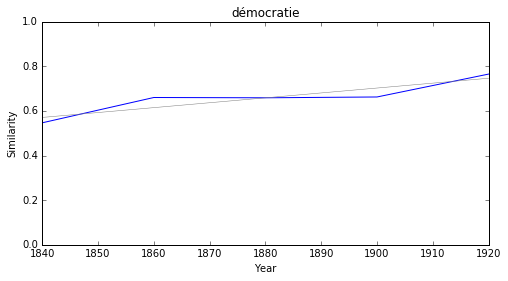

préparation


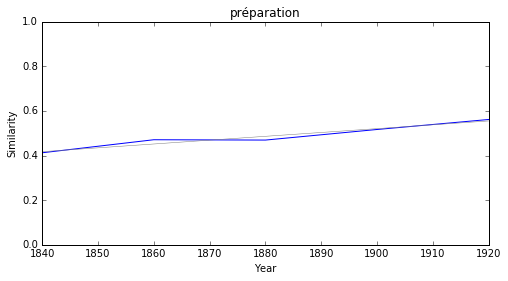

esthétique


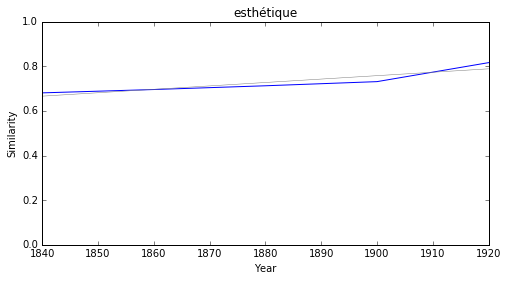

théorique


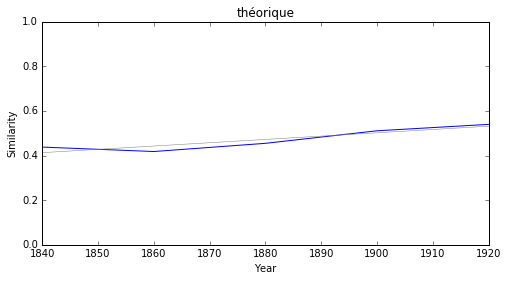

particulièrement


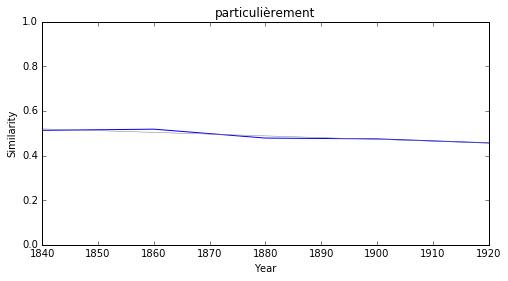

rationnel


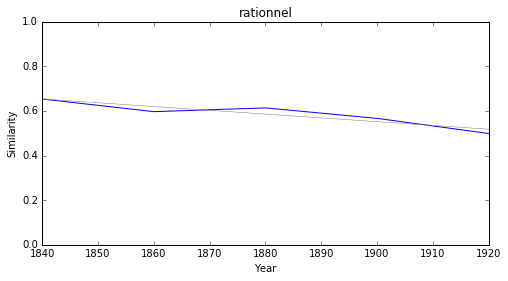

vérité


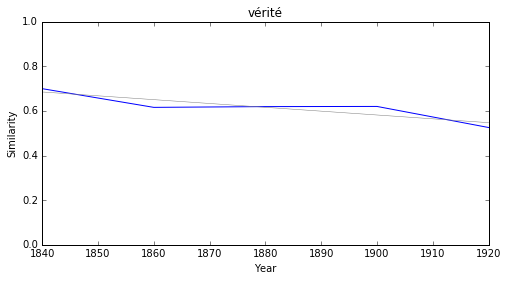

### <i><b>lettre</i></b>

        token     slope         p
2   testament  0.002327  0.017519
1      notice  0.001274  0.010345
3       texte  0.001204  0.031444
4  confession  0.001169  0.044680
0     insérer -0.001806  0.008851



testament


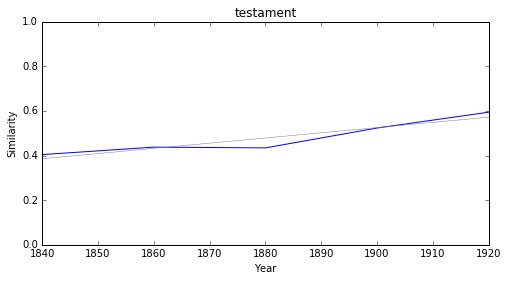

notice


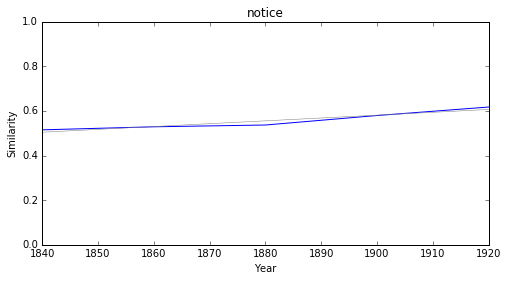

texte


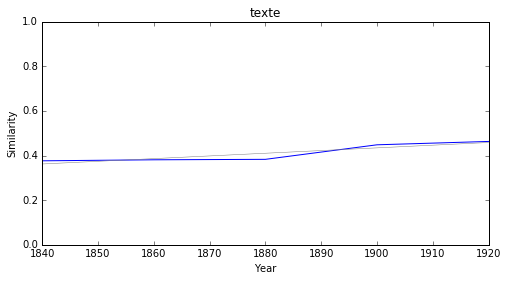

confession


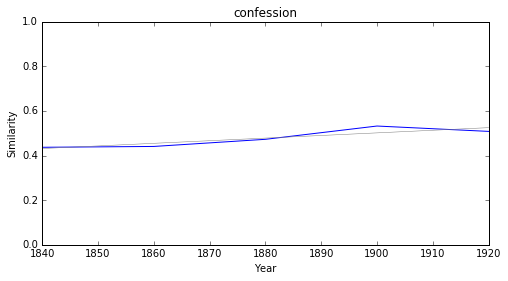

insérer


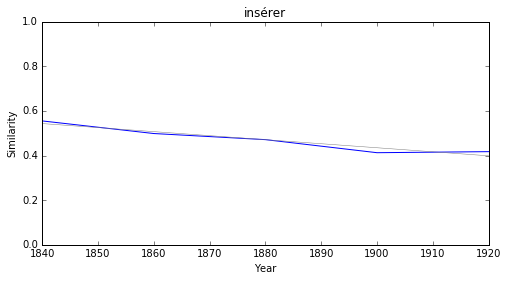

### <i><b>critique</i></b>

               token     slope         p
6              thèse  0.003204  0.048813
11            métier  0.002313  0.011663
0         théologien  0.000840  0.018878
18             poète -0.001149  0.028307
1          moraliste -0.001437  0.009910
4            faculté -0.001525  0.019641
7   particulièrement -0.001540  0.020493
14        difficulté -0.001690  0.035934
17      authenticité -0.001699  0.032399
5         historique -0.001771  0.014587



thèse


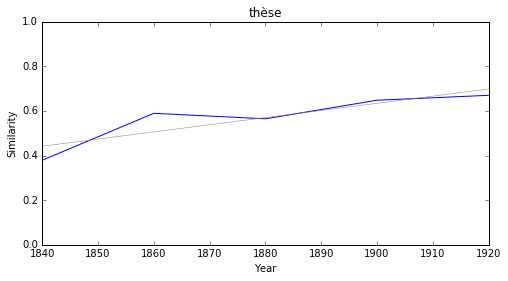

métier


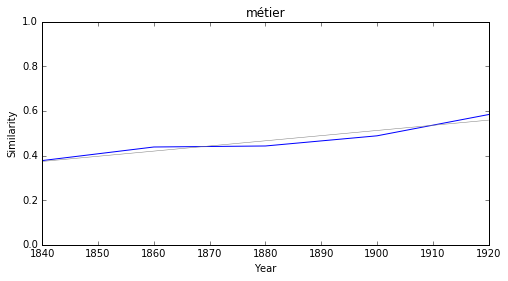

théologien


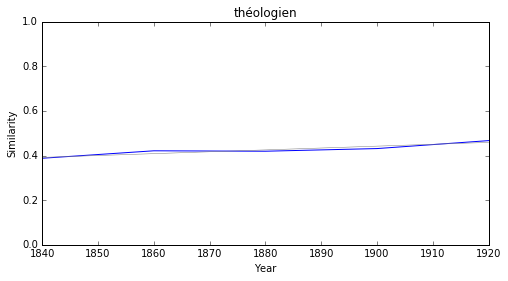

poète


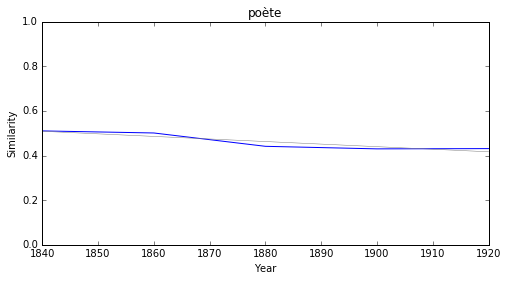

moraliste


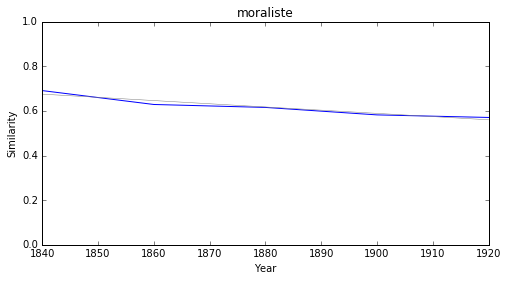

faculté


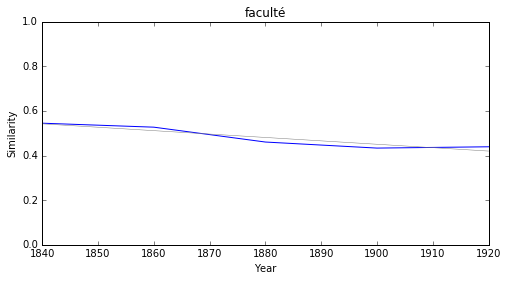

particulièrement


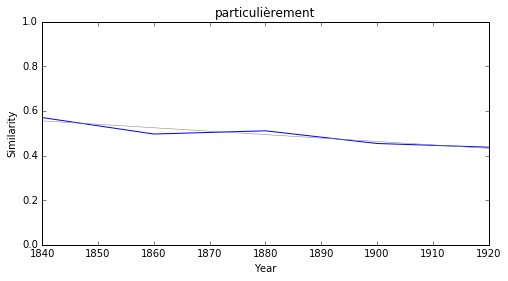

difficulté


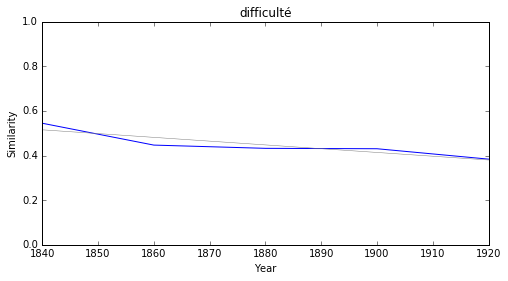

authenticité


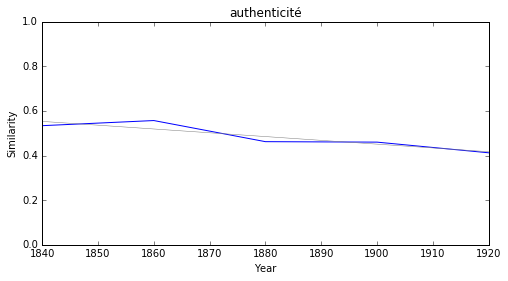

historique


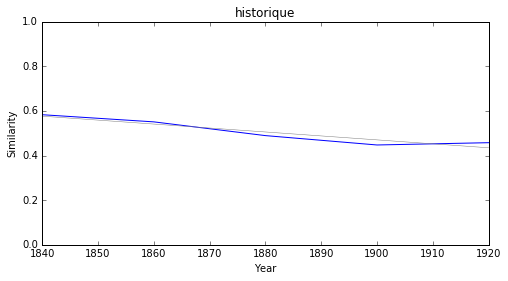

### <i><b>roman</i></b>

            token     slope         p
5      romantique  0.003502  0.003419
8          balzac  0.002149  0.035907
11          drame -0.001557  0.018205
0         strophe -0.001968  0.022391
4   avertissement -0.002043  0.024936
1      confession -0.002177  0.033259
2          épître -0.002572  0.004202
3           fable -0.002868  0.035509
7           bible -0.002926  0.043043
10    commentaire -0.002987  0.018158



romantique


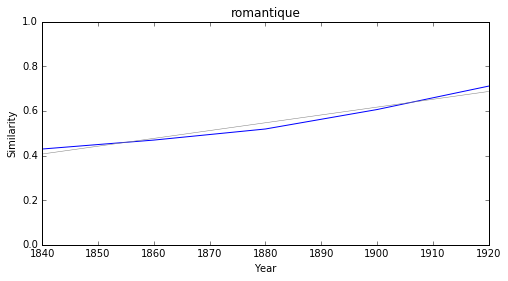

balzac


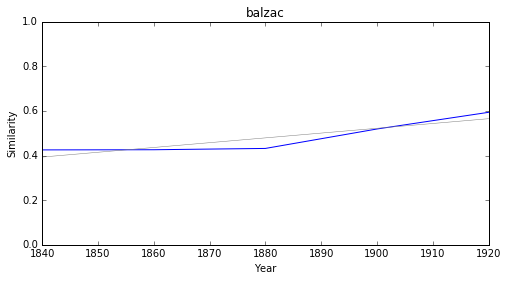

drame


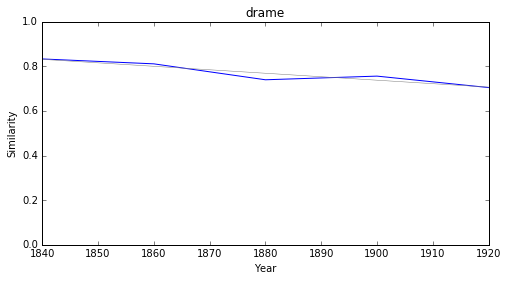

strophe


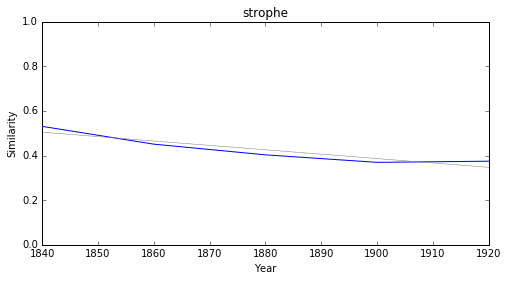

avertissement


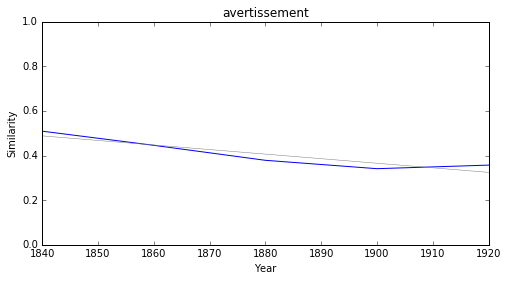

confession


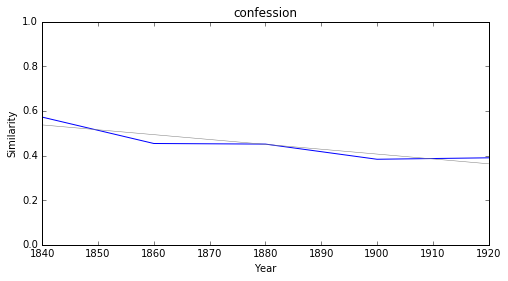

épître


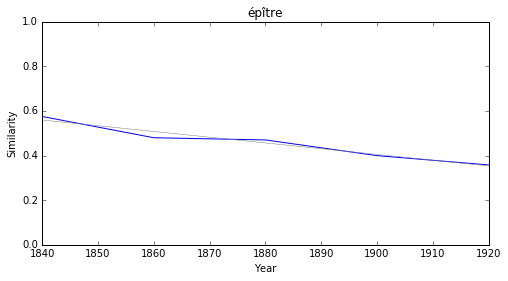

fable


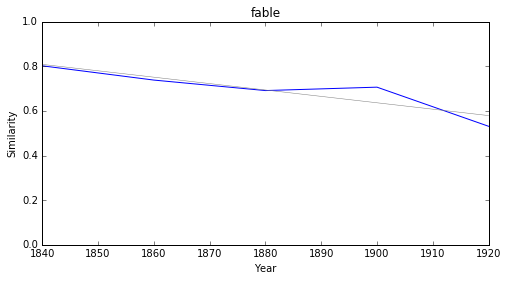

bible


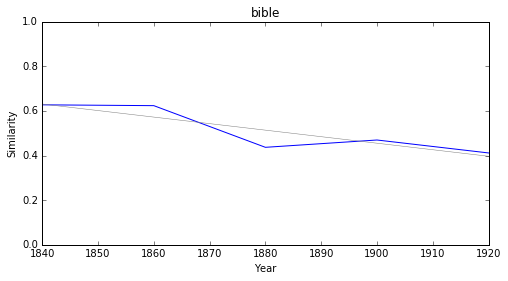

commentaire


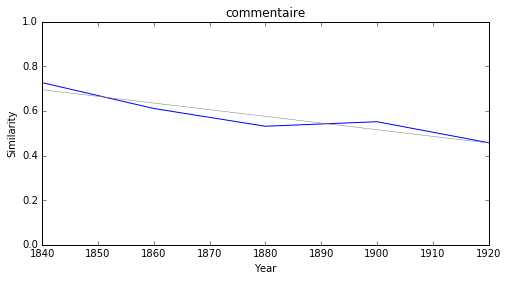

### <i><b>théâtre</i></b>

        token     slope         p
4    parnasse  0.002804  0.028749
2        type  0.002581  0.047111
1       genre  0.000884  0.002693
5     lecteur  0.000856  0.043444
3       russe  0.000389  0.029975
0  conférence -0.001302  0.010824



parnasse


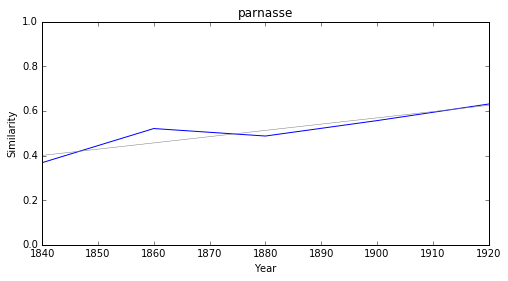

type


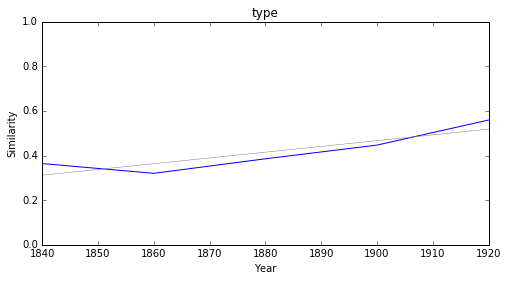

genre


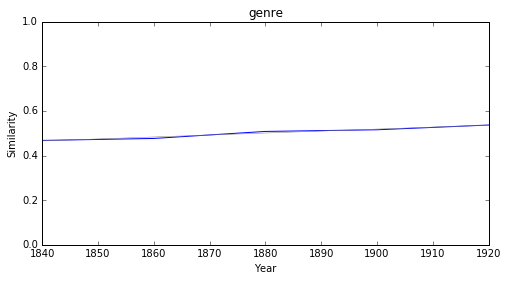

lecteur


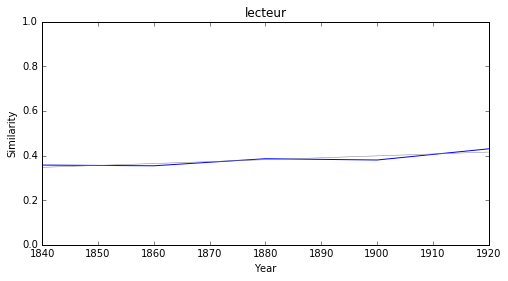

russe


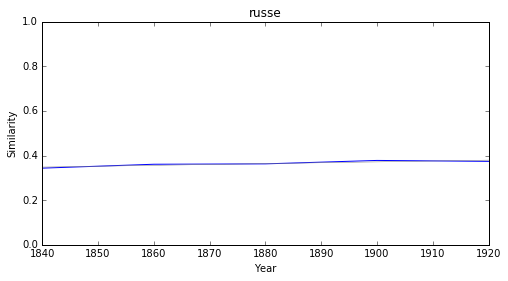

conférence


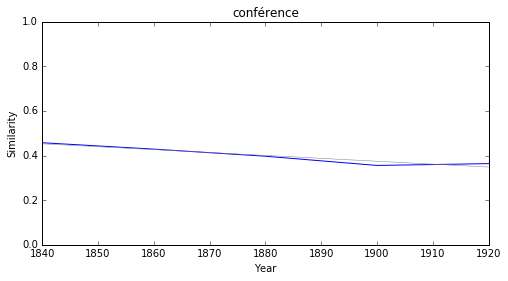

### <i><b>drame</i></b>

        token     slope         p
3  romantique  0.002358  0.005027
0    dialogue -0.001534  0.042454
4       roman -0.001557  0.018205
6   narration -0.001669  0.045025
2    moralité -0.002147  0.031294
5       opéra -0.002164  0.021772
1      iliade -0.003211  0.034849



romantique


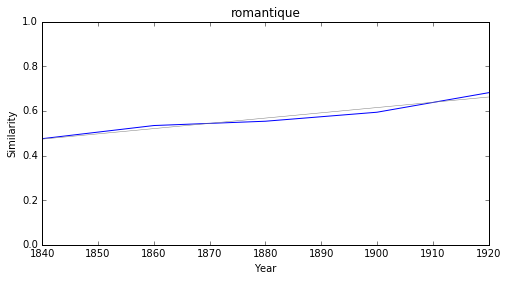

dialogue


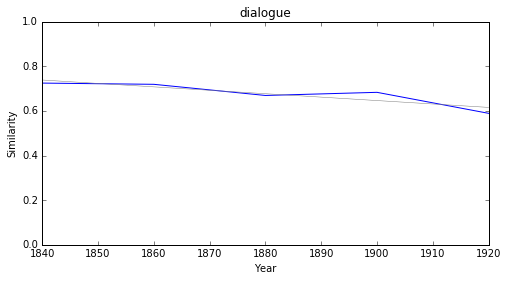

roman


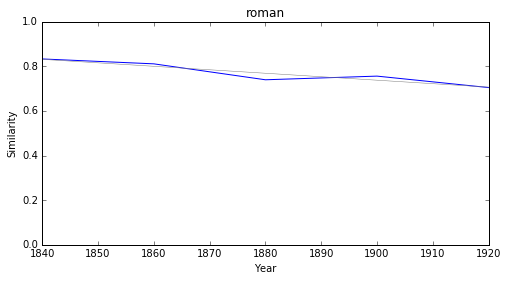

narration


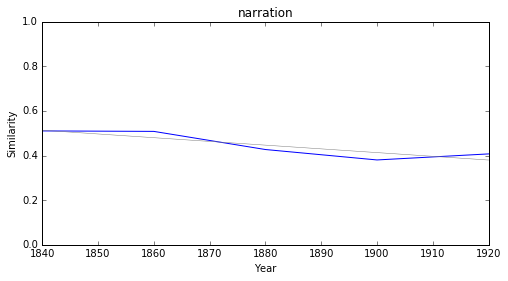

moralité


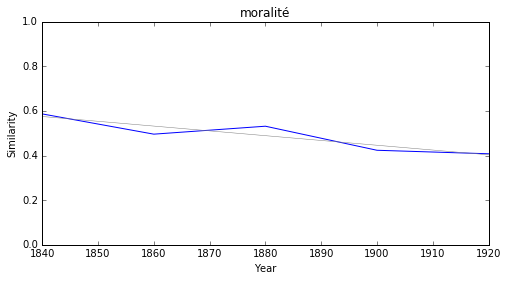

opéra


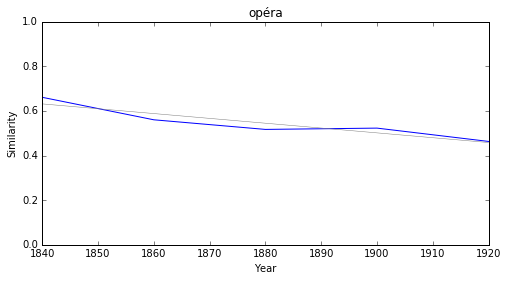

iliade


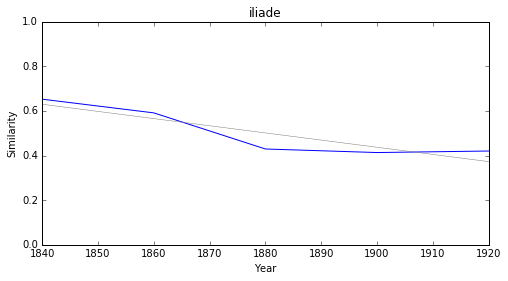

### <i><b>esprit</i></b>

           token     slope         p
18    discipline  0.004183  0.038798
14  personnalité  0.003904  0.001634
2      intuition  0.003895  0.015316
5     exaltation  0.003682  0.028642
4      plénitude  0.003603  0.020031
6          élite  0.003585  0.024961
12   réalisation  0.003302  0.039114
10      fatalité  0.003231  0.023646
9      organisme  0.003137  0.019535
0      équilibre  0.002653  0.017933



discipline


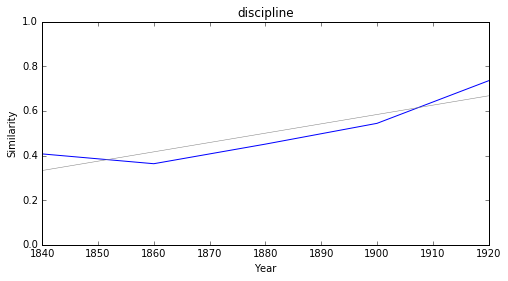

personnalité


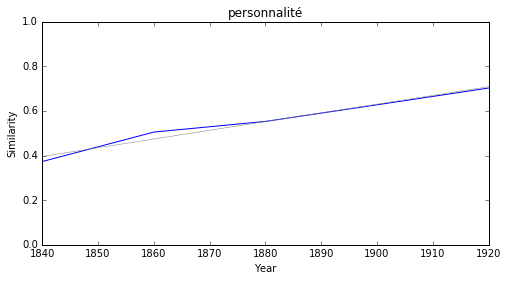

intuition


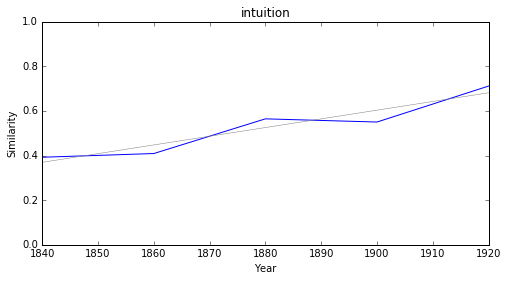

exaltation


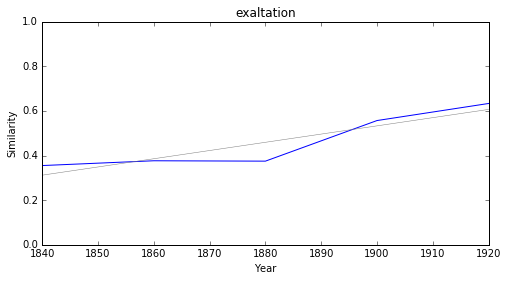

plénitude


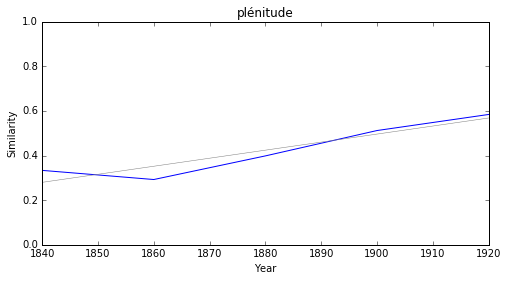

élite


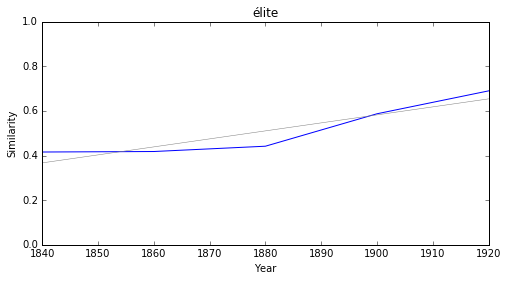

réalisation


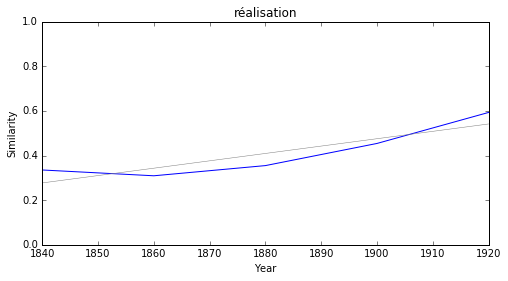

fatalité


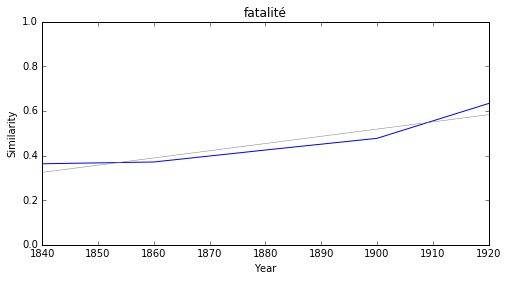

organisme


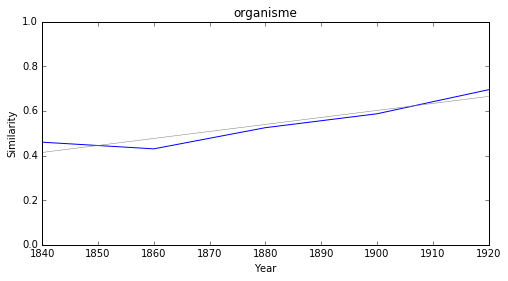

équilibre


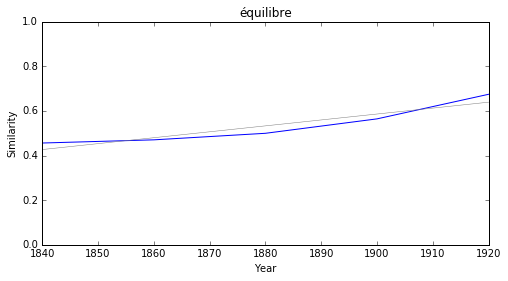

### <i><b>langue</i></b>

         token     slope         p
0      culture  0.003290  0.003976
2     français  0.002441  0.037675
4      pléiade  0.001712  0.047159
7        façon  0.001001  0.011836
5         race -0.000789  0.028910
6       homère -0.002144  0.006797
3  comparaison -0.003310  0.047108
1     primitif -0.003528  0.002180



culture


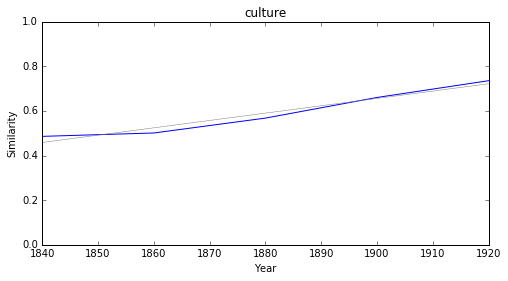

français


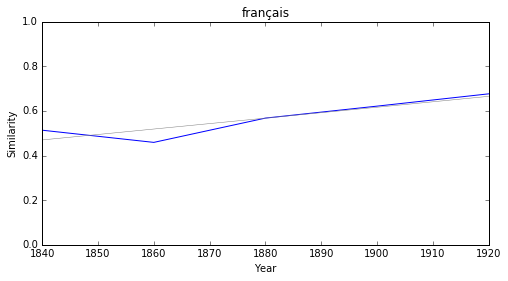

pléiade


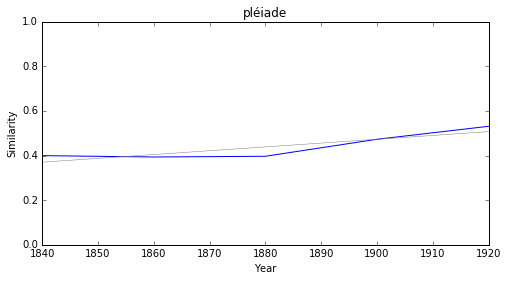

façon


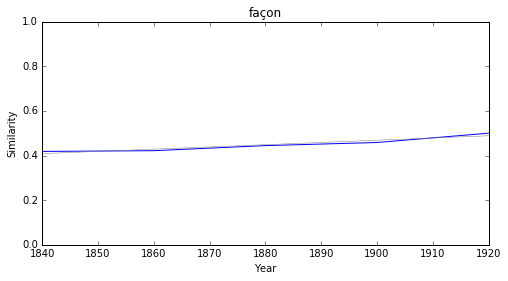

race


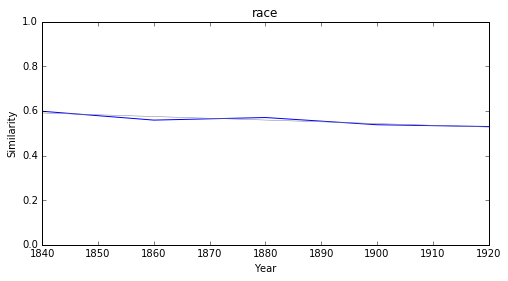

homère


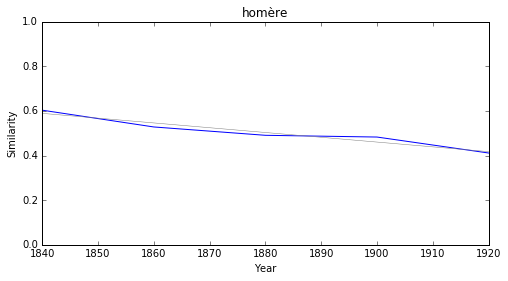

comparaison


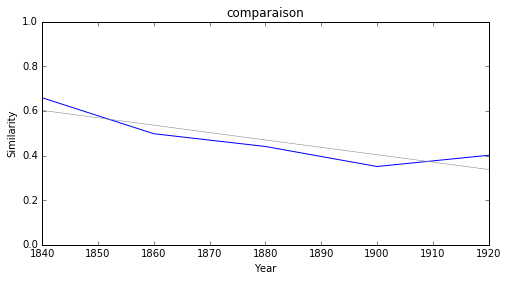

primitif


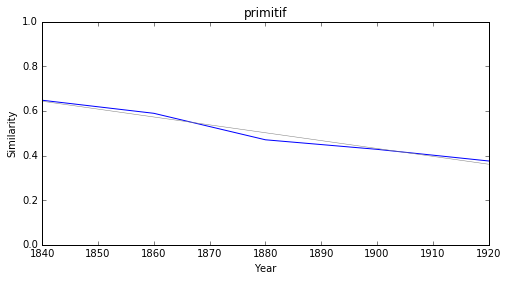

### <i><b>diplomatie</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>politique</i></b>

               token     slope         p
8         économique  0.003478  0.009491
7         artistique  0.003337  0.017079
5              thèse  0.001823  0.047283
10         descartes -0.001241  0.038366
3          moraliste -0.001387  0.045794
1           autorité -0.001450  0.022712
9            royauté -0.001454  0.027625
4        association -0.001799  0.011172
6   affranchissement -0.002301  0.036648
2            préjugé -0.002426  0.022423



économique


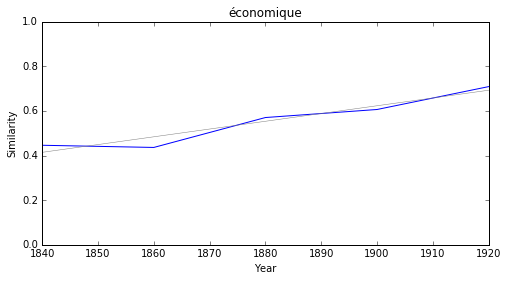

artistique


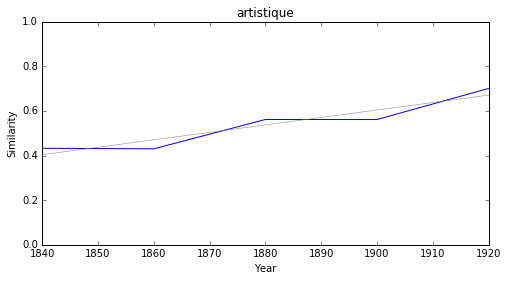

thèse


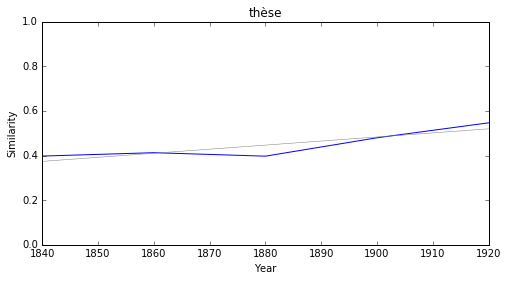

descartes


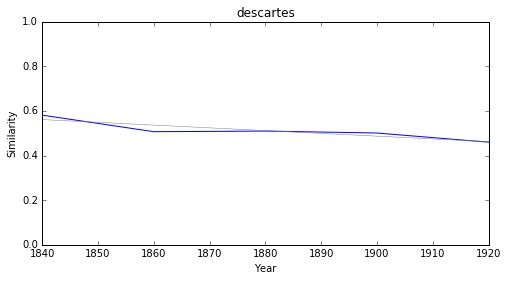

moraliste


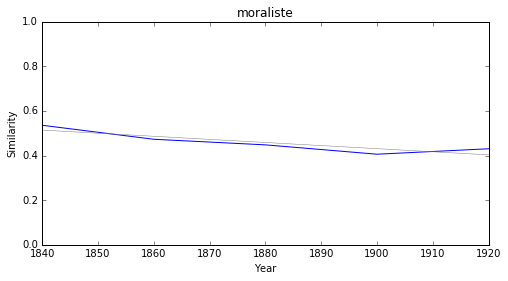

autorité


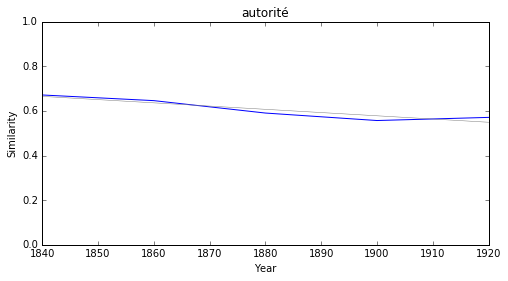

royauté


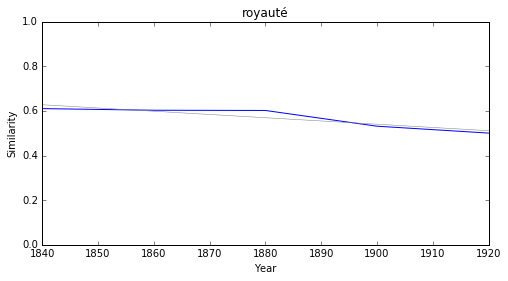

association


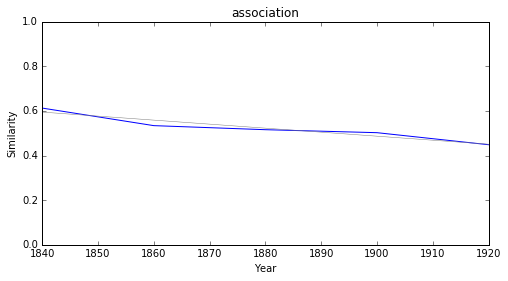

affranchissement


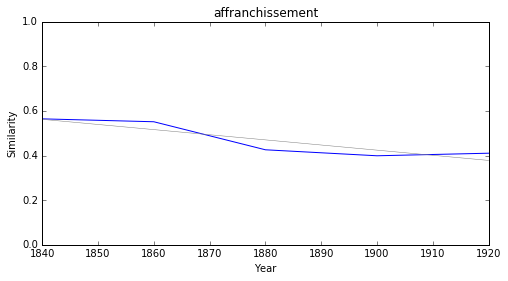

préjugé


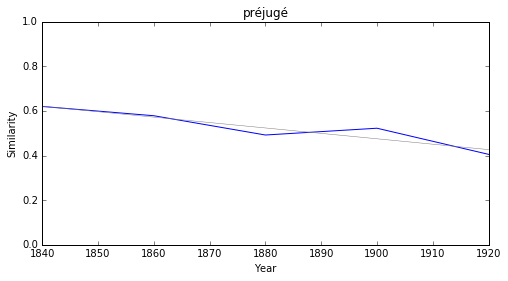

### <i><b>morale</i></b>

             token     slope         p
6        impliquer  0.004736  0.019258
0        intuition  0.004198  0.004400
9      pénétration  0.003176  0.042139
10      continuité  0.003038  0.006659
19    conservation  0.002750  0.010712
2       esthétique  0.002433  0.019371
12      instinctif  0.002417  0.008284
4         créateur  0.002044  0.008297
17      uniquement  0.001849  0.019445
1   responsabilité  0.001769  0.001574



impliquer


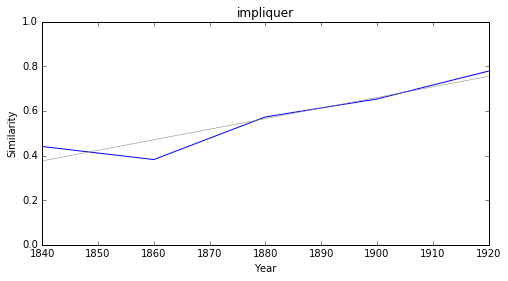

intuition


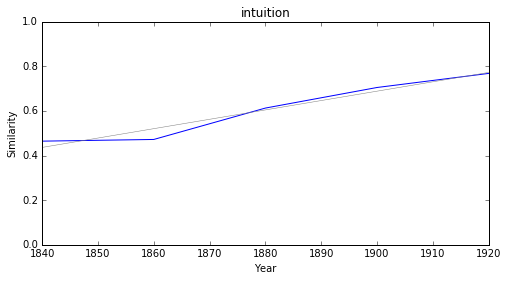

pénétration


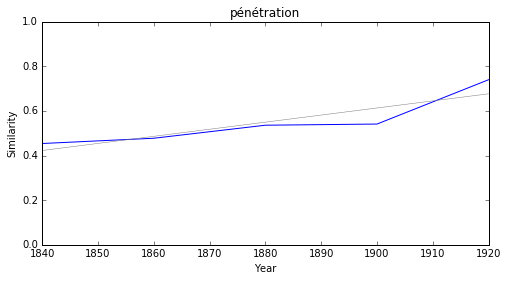

continuité


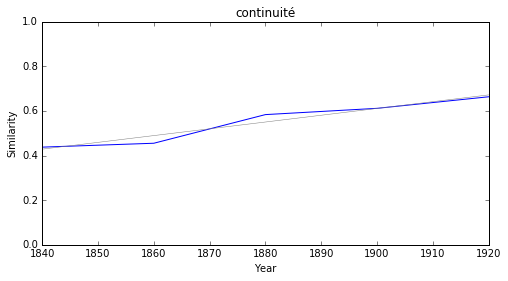

conservation


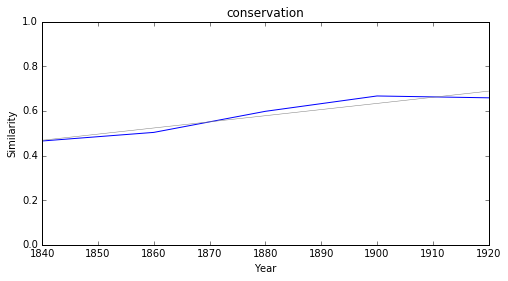

esthétique


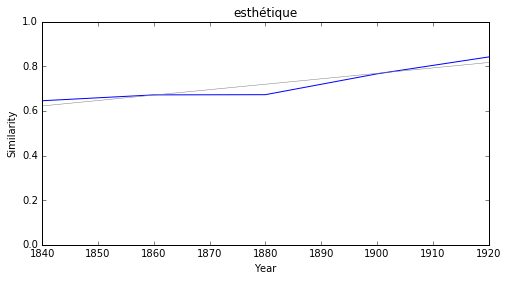

instinctif


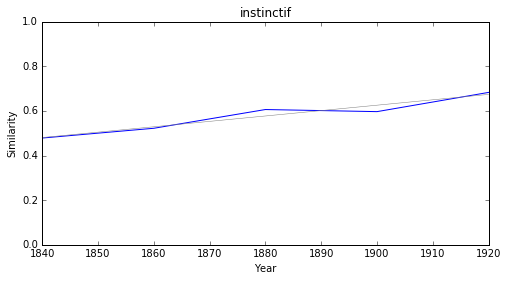

créateur


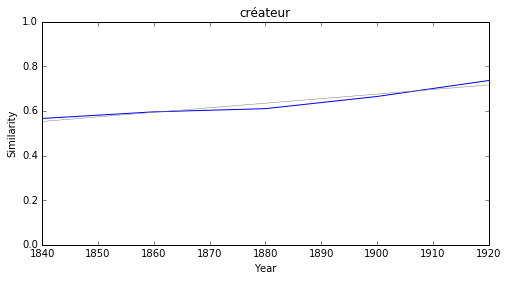

uniquement


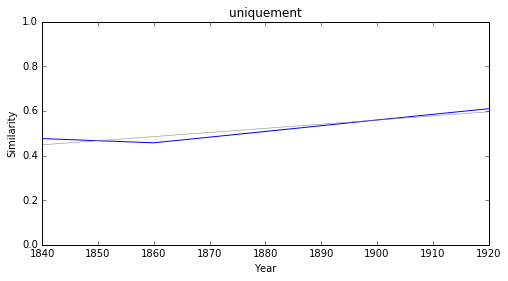

responsabilité


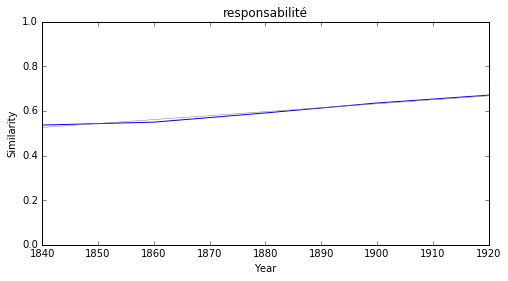

### <i><b>société</i></b>

        token     slope         p
3    province  0.002459  0.049296
5        etat  0.002360  0.043084
1  communauté  0.001267  0.043367
4  discipline -0.001668  0.043377
2   permanent -0.001853  0.035834
0    position -0.002022  0.015620



province


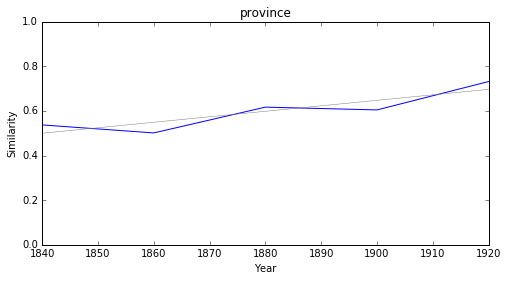

etat


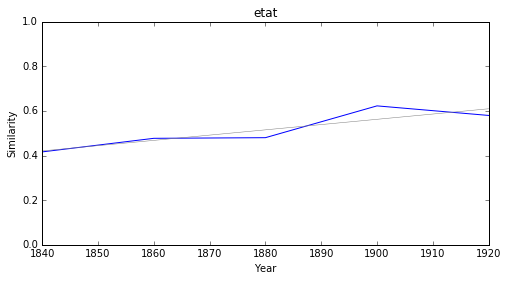

communauté


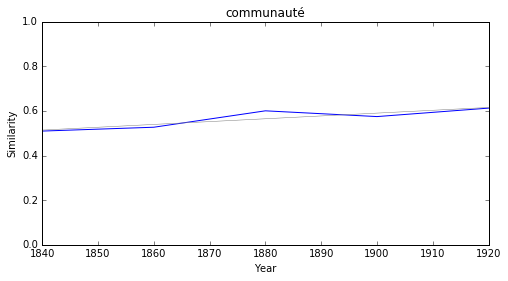

discipline


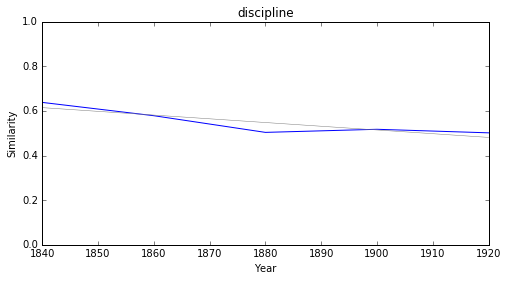

permanent


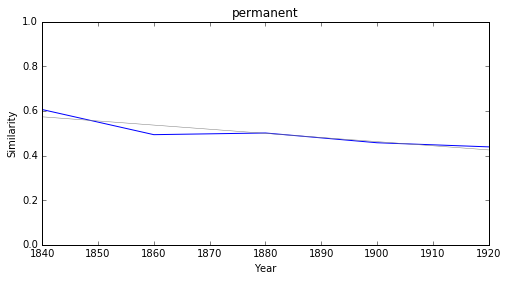

position


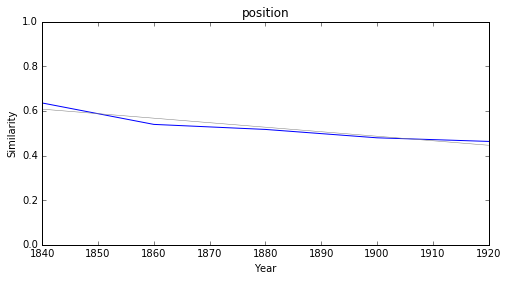

### <i><b>pouvoir</i></b>

            token     slope         p
10       réaliser  0.003244  0.047176
9         formule  0.002461  0.019813
8     originalité  0.002370  0.047944
4   naturellement  0.002314  0.016528
19      ignorance  0.002289  0.030744
11      incapable  0.002225  0.011977
21      ressentir  0.002109  0.044700
14       scrupule  0.002074  0.045866
2       extérieur  0.001980  0.045326
16       ensemble  0.001955  0.047651



réaliser


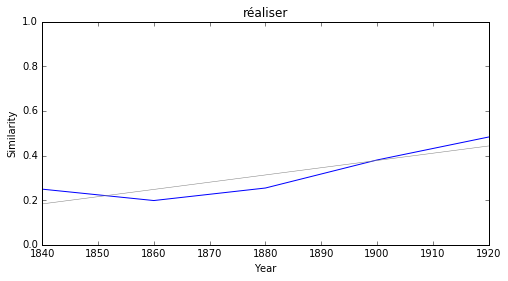

formule


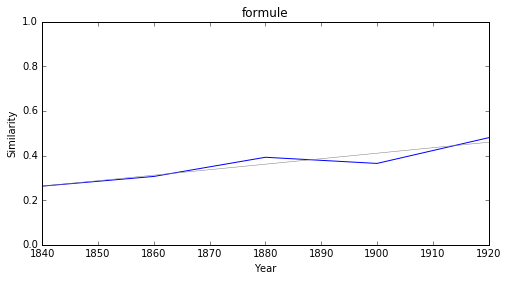

originalité


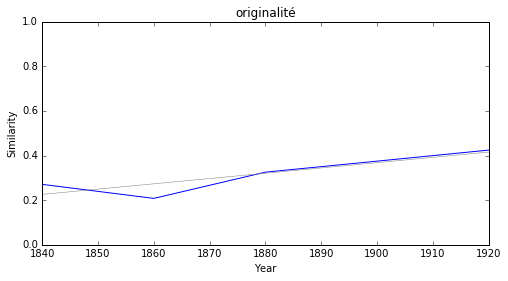

naturellement


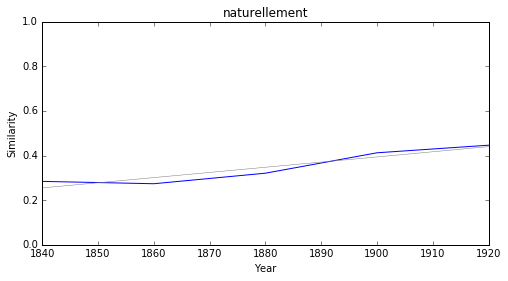

ignorance


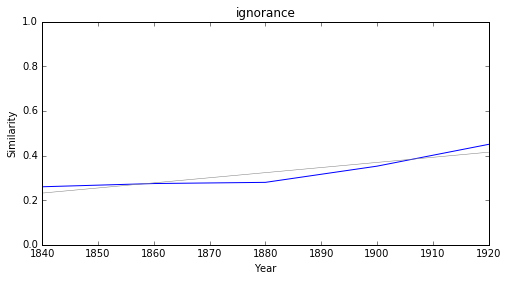

incapable


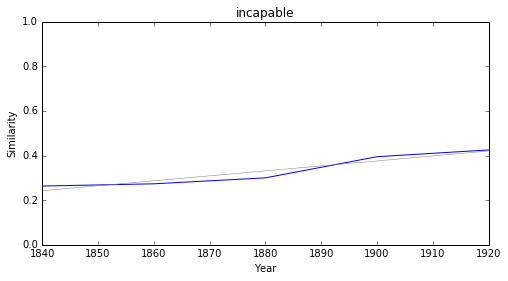

ressentir


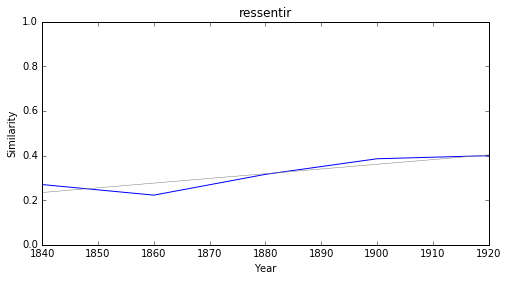

scrupule


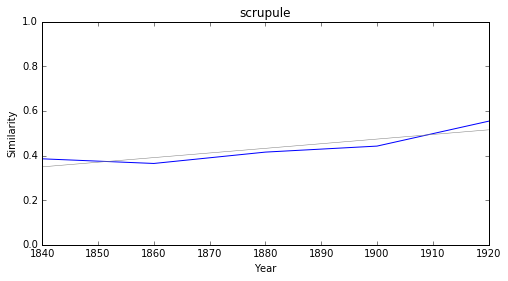

extérieur


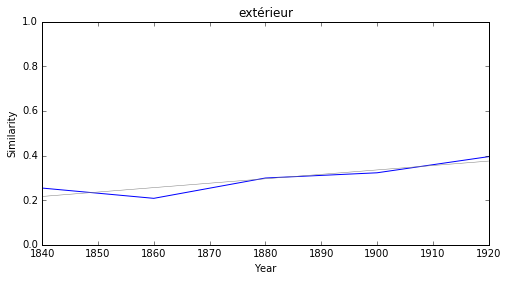

ensemble


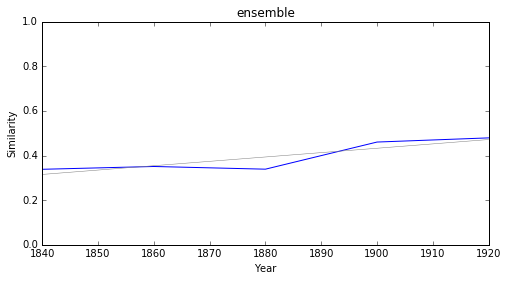

### <i><b>théologie</i></b>

        token     slope         p
0  astronomie -0.001606  0.038401



astronomie


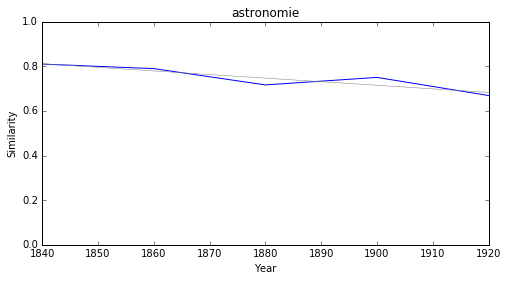

### <i><b>droit</i></b>

        token     slope         p
1   règlement  0.001205  0.049223
8  initiative -0.000626  0.038902
4        code -0.000877  0.012986
5  obéissance -0.001873  0.020389
3    garantie -0.001939  0.004626
9       agent -0.002010  0.019778
2    tribunal -0.002146  0.010506
0     égalité -0.002199  0.021421
6   fondement -0.002338  0.029615
7     royauté -0.003068  0.012321



règlement


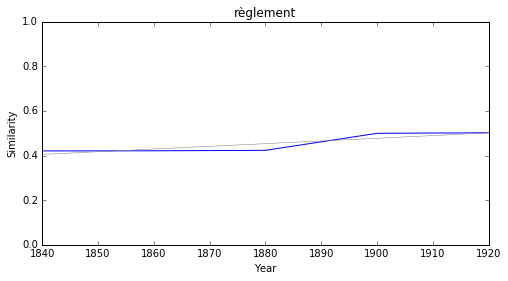

initiative


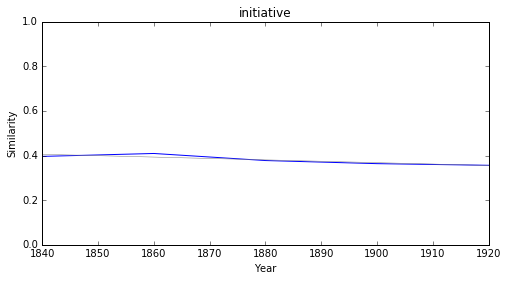

code


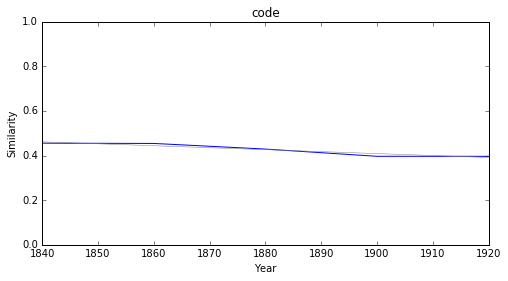

obéissance


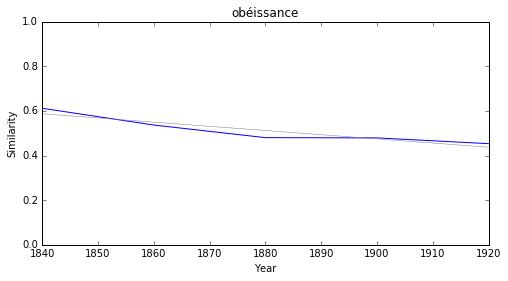

garantie


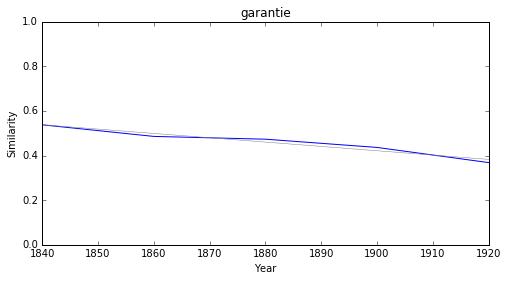

agent


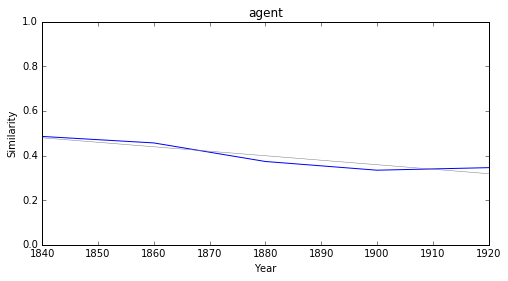

tribunal


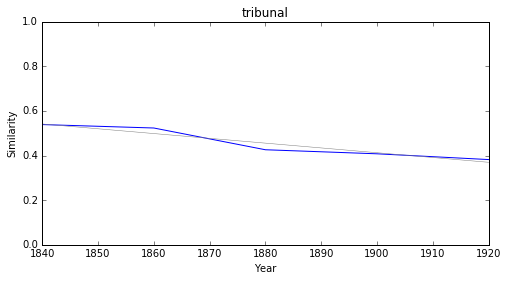

égalité


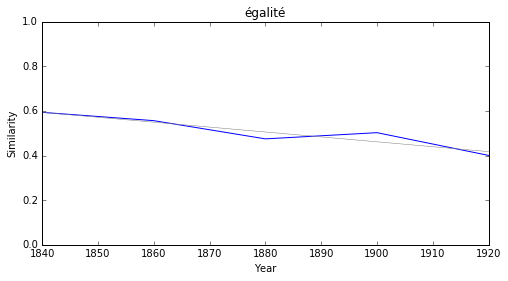

fondement


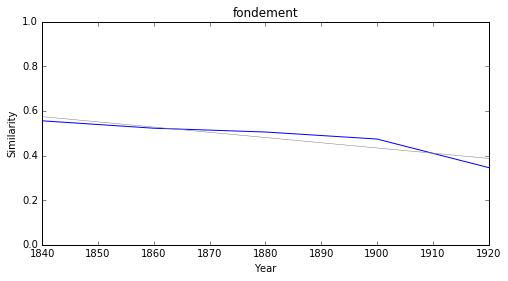

royauté


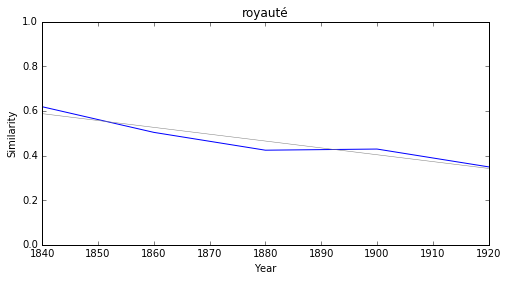

### <i><b>loi</i></b>

             token     slope         p
8        évolution  0.002094  0.001599
1       esthétique  0.002085  0.025247
0        confusion  0.002020  0.036930
6   interprétation  0.001935  0.036729
7        organisme  0.001844  0.022557
11    personnalité  0.001396  0.012065
4         immédiat  0.001125  0.027447
2            issue  0.000958  0.016256
9         résultat  0.000268  0.048662
3            dogme -0.000636  0.022129



évolution


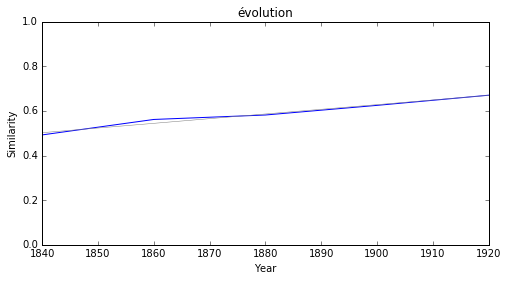

esthétique


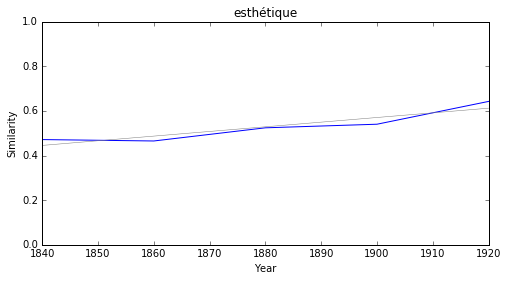

confusion


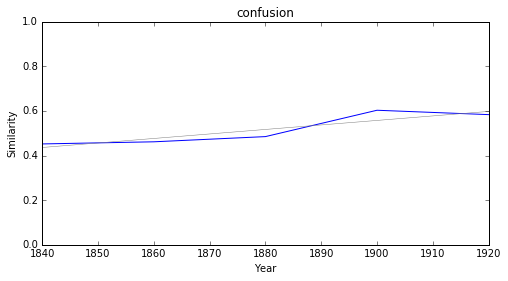

interprétation


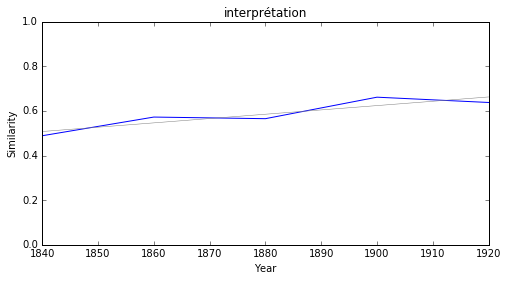

organisme


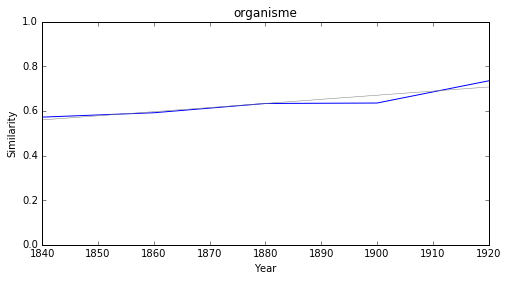

personnalité


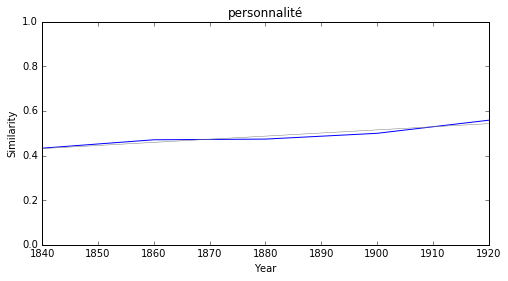

immédiat


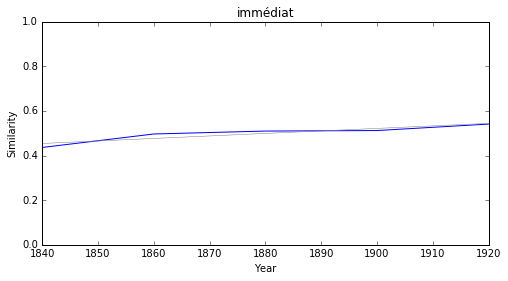

issue


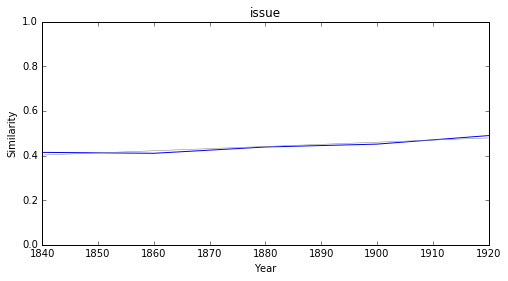

résultat


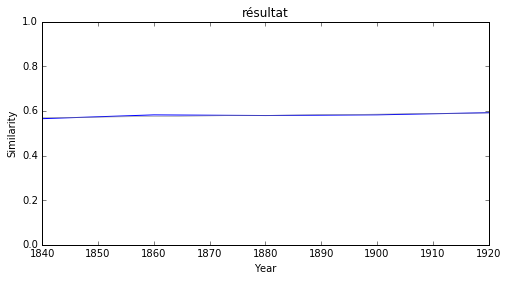

dogme


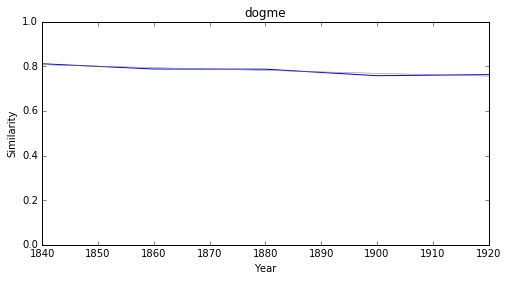

### <i><b>méthode</i></b>

            token     slope         p
2      esthétique  0.002216  0.040282
3        vocation  0.001587  0.047094
11        système -0.000640  0.006589
10       remarque -0.000658  0.046737
14       résultat -0.000792  0.014443
0   contradiction -0.001228  0.036395
16      diversité -0.001399  0.028149
19      organique -0.001450  0.027391
20      réflexion -0.001470  0.012829
18     discussion -0.001661  0.024859



esthétique


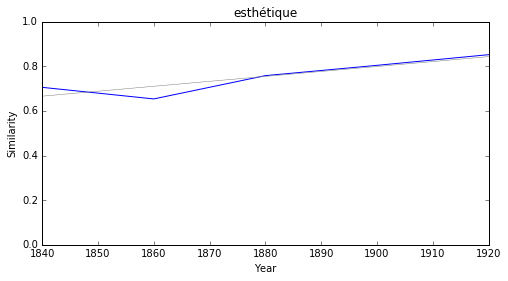

vocation


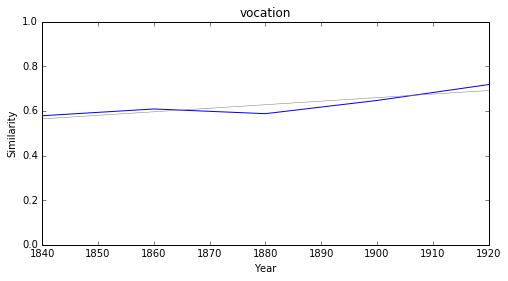

système


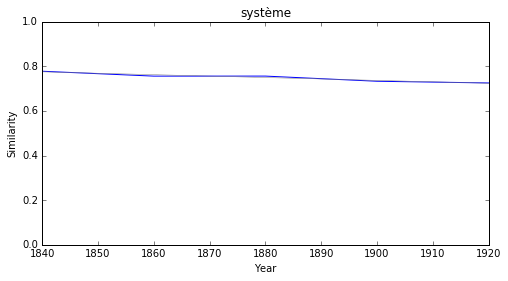

remarque


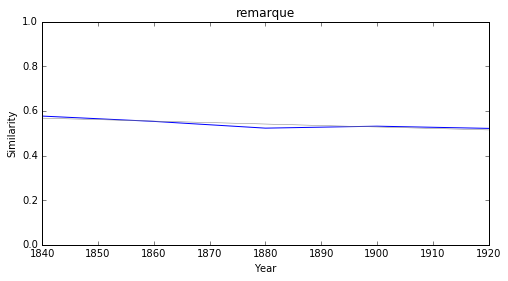

résultat


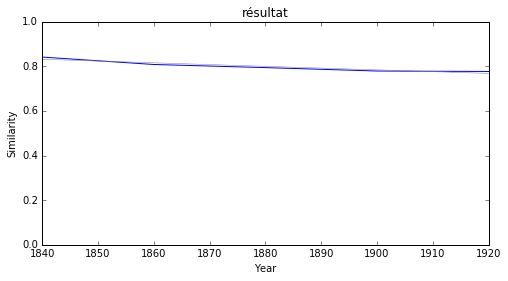

contradiction


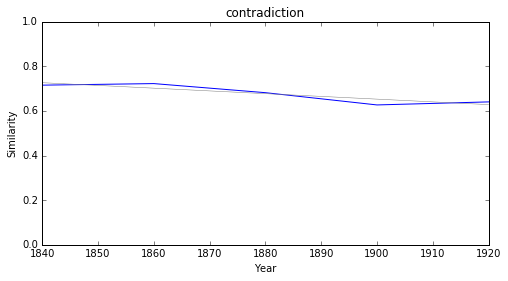

diversité


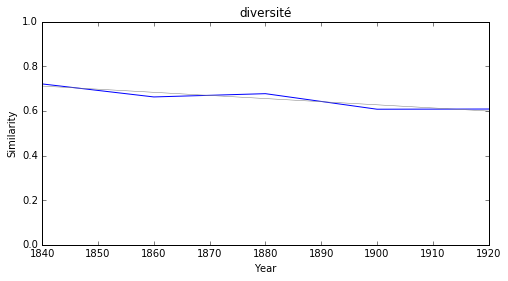

organique


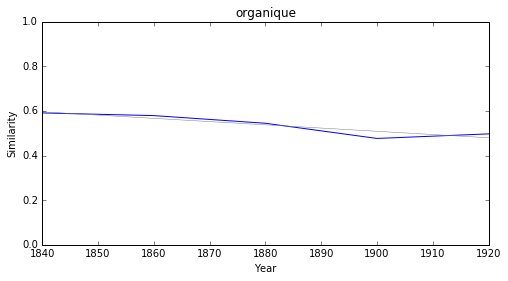

réflexion


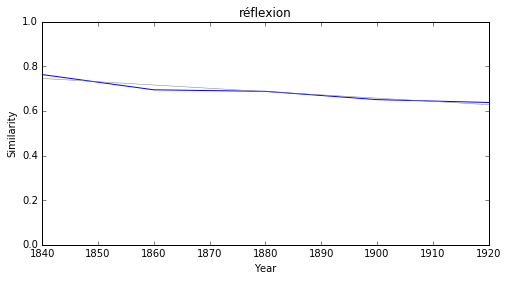

discussion


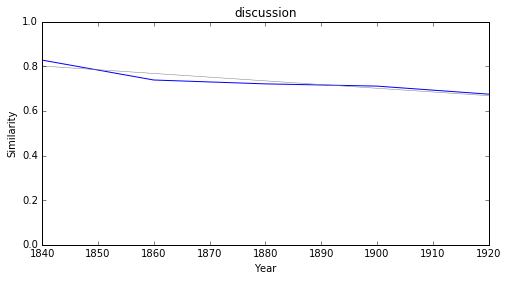

### <i><b>génie</i></b>

           token     slope         p
9        lyrisme  0.004757  0.023723
10  personnalité  0.003815  0.028191
6         métier  0.002994  0.031394
13       cerveau  0.002544  0.015389
7     romantisme  0.002536  0.000300
4       prestige  0.001862  0.045766
0        symbole  0.001860  0.046456
12     confiance  0.001208  0.035667
8      mécanisme  0.001036  0.002393
3    raffinement -0.001324  0.037457



lyrisme


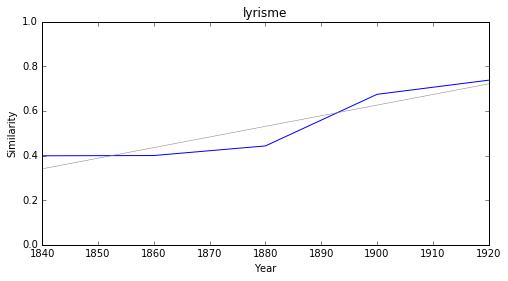

personnalité


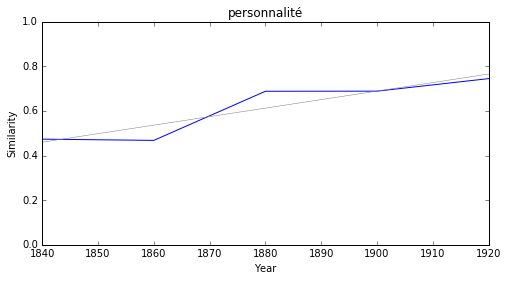

métier


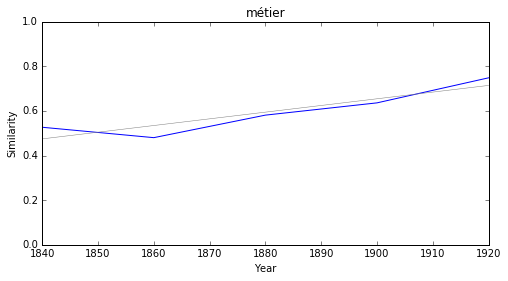

cerveau


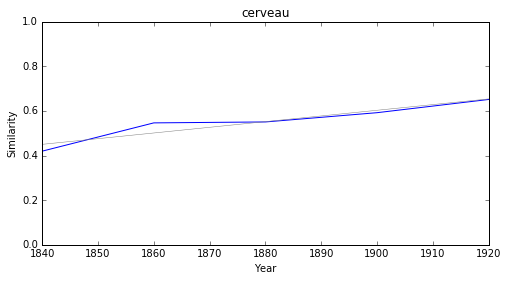

romantisme


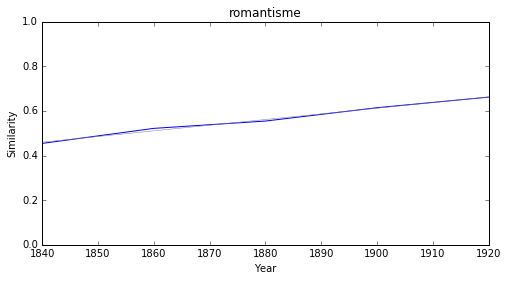

prestige


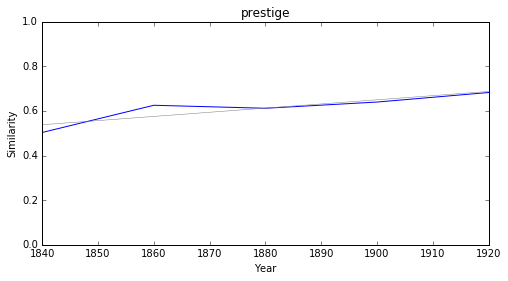

symbole


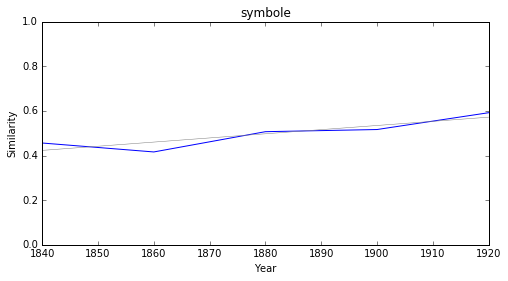

confiance


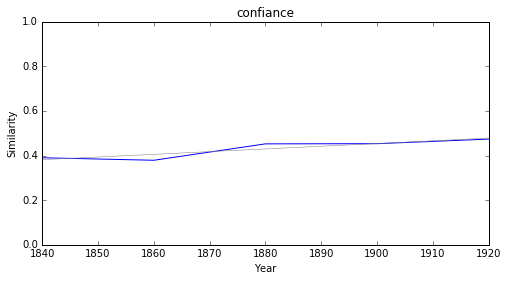

mécanisme


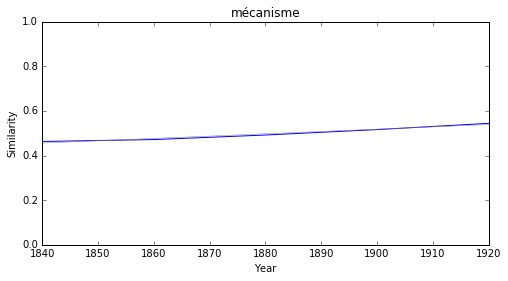

raffinement


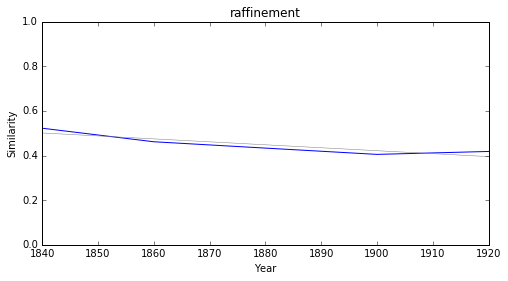

### <i><b>romantisme</i></b>

            token     slope         p
2  protestantisme -0.001922  0.011393
3             cid -0.002213  0.003550
5       paganisme -0.002988  0.013632
1    rationalisme -0.003614  0.013069
0      bouddhisme -0.004106  0.008077
6      directoire -0.004113  0.035481
4       fondateur -0.004289  0.039935



protestantisme


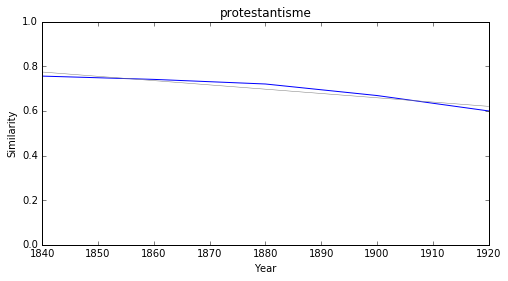

cid


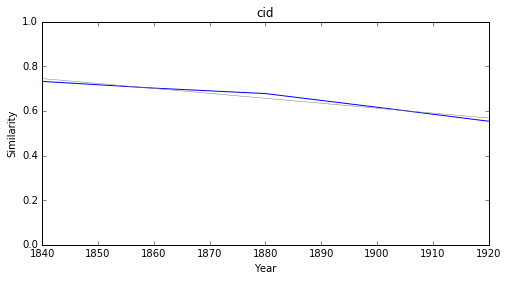

paganisme


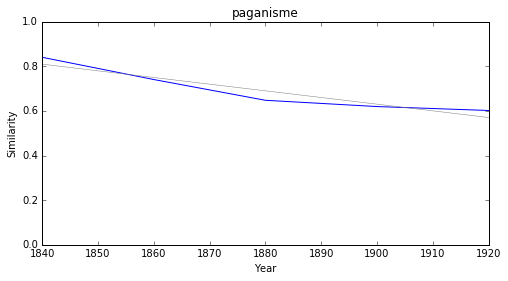

rationalisme


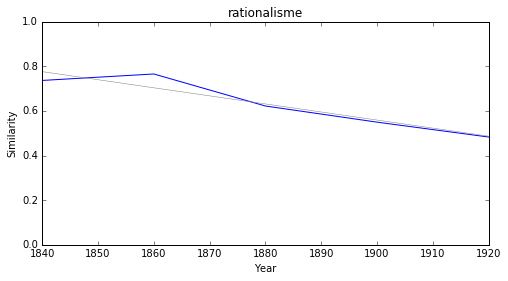

bouddhisme


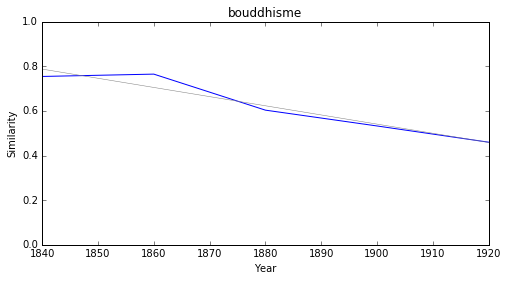

directoire


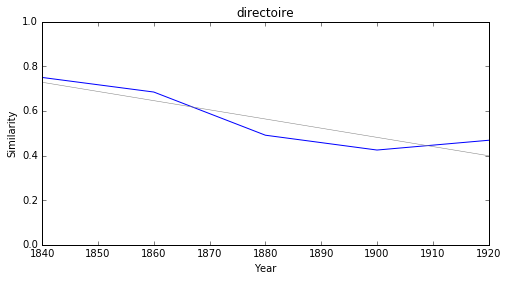

fondateur


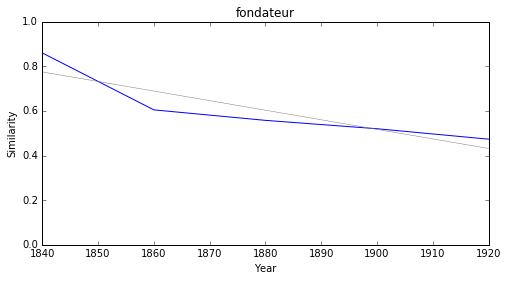

### <i><b>réalisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>symbolisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





### <i><b>naturalisme</i></b>

Empty DataFrame
Columns: [token, slope, p]
Index: []





In [80]:
from IPython.display import Markdown, display

for word in testList :
    display(Markdown("### <i><b>"+word+"</i></b>"))
    df3 = pd.DataFrame(entries[word], columns=('token', 'slope', 'p'))
    print(df3.sort_values('slope', ascending=False).head(10))
    print('\n\n')
    
    for i, row in df3.sort_values('slope', ascending=False).head(10).iterrows():
        plot_cosine_series(word, row['token'], 8, 4)